#### EXAFS Data reduction for transmission XAS

In [1]:
# step 0: imports
import sys
# sys.path.insert(0, r"C:\Users\kwill\Keenan_UCB-O365\OneDrive_UCB-O365\GitHub_Repos\xraylarch") #Path to larch 
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
from scipy.interpolate import interp1d
from larch.io import read_athena, read_ascii
from larch.xafs import (pre_edge, autobk, xftf, 
                        ff2chi, feffpath, feffit_transform, feffit_dataset, feffit, feffit_report, TransformGroup, path2chi)
from larch.fitting import param, guess, param_group
from larch.plot.plotly_xafsplots import (plot_mu, plot_chik, plot_chir, plot_chifit, 
                                         multi_plot, plotlabels, set_label_weight)
from larch.utils import group2dict
from pathlib import Path
from larch.wxlib import plotlabels as plab 
from scipy.signal import savgol_filter   
try:
    # Try the newer name first
    from scipy.integrate import simpson as integrate_method
except ImportError:
    try:
        # Try the older name
        from scipy.integrate import simps as integrate_method
    except ImportError:
        # Fall back to trapz which is always available
        from scipy.integrate import trapz as integrate_method
        print("Note: Using trapz for integration instead of simpson/simps")      
import matplotlib.cm as cm  
from larch import Group                                
import os 

In [2]:
def apply_energy_calibration(projects, verbose=True):
    """
    Apply energy calibration shifts stored in Athena projects to the energy arrays.
    
    When reading Athena project files with read_athena(), the energy_shift values
    are stored as attributes (group.energy_shift) but NOT applied to the energy arrays.
    This function applies those shifts.
    
    Parameters:
    -----------
    projects : dict
        Dictionary of projects loaded from read_athena() or batch_process_athena_projects()
    verbose : bool
        If True, print information about applied shifts
    
    Returns:
    --------
    dict
        The modified projects dictionary with energy shifts applied
    """
    import numpy as np
    
    if not projects:
        print("No projects provided")
        return None
    
    for proj_name, project in projects.items():
        if verbose:
            print(f"\nProject: {proj_name}")
        
        for group_name, group in project.groups.items():
            # Check if there's an energy_shift attribute from the Athena project
            energy_shift = getattr(group, 'energy_shift', 0.0)
            
            # Also check athena_params.bkg.eshift as a fallback
            if energy_shift == 0.0 and hasattr(group, 'athena_params'):
                if hasattr(group.athena_params, 'bkg'):
                    energy_shift = float(getattr(group.athena_params.bkg, 'eshift', 0.0))
                    group.energy_shift = energy_shift
            
            if hasattr(group, 'energy') and energy_shift != 0.0:
                # Store original energy if not already stored
                if not hasattr(group, 'energy_orig'):
                    group.energy_orig = group.energy.copy()
                
                # Apply the shift
                group.energy = group.energy_orig + energy_shift
                
                if verbose:
                    print(f"  {group_name}: applied energy shift of {energy_shift:.4f} eV")
            elif verbose and energy_shift == 0.0:
                print(f"  {group_name}: no energy shift to apply")
    
    return projects


def show_energy_calibration_info(projects):
    """
    Display energy calibration information for all groups in projects.
    Shows whether shifts have been applied and what the shift values are.
    
    Parameters:
    -----------
    projects : dict
        Dictionary of projects loaded from read_athena()
    """
    for proj_name, project in projects.items():
        print(f"\nProject: {proj_name}")
        print("-" * 60)
        
        for group_name, group in project.groups.items():
            energy_shift = getattr(group, 'energy_shift', 0.0)
            has_orig = hasattr(group, 'energy_orig')
            
            # Check athena_params for stored shift
            athena_shift = 0.0
            if hasattr(group, 'athena_params') and hasattr(group.athena_params, 'bkg'):
                athena_shift = float(getattr(group.athena_params.bkg, 'eshift', 0.0))
            
            status = "APPLIED" if has_orig else "NOT APPLIED"
            print(f"  {group_name}:")
            print(f"    energy_shift attribute: {energy_shift:.4f} eV")
            print(f"    athena_params.bkg.eshift: {athena_shift:.4f} eV")
            print(f"    Status: {status}")
            
            if has_orig:
                current_diff = group.energy[0] - group.energy_orig[0]
                print(f"    Current offset from original: {current_diff:.4f} eV")

def batch_process_athena_projects(projects_path):
    """
    Batch process all Athena projects in the specified path without e0 alignment.
    
    Parameters:
    -----------
    projects_path : str or Path
        Path to a directory containing Athena project files (.prj)
    
    This function:
    - Loads all Athena project files from the specified path
    - Applies stavisky-golay noise filtering to each group in each project 
    - Applies pre-edge subtraction on each group in each project
    - Plots normalized absorption curves and derivatives for each project
    - Returns the loaded projects for further analysis
    
    Returns:
    --------
    dict
        Dictionary of loaded projects that can be used for further analysis
    """
    import numpy as np
    import matplotlib.pyplot as plt
    import matplotlib.cm as cm
    from pathlib import Path
    from larch.io import read_athena
    from larch.xafs import pre_edge
    from scipy.signal import savgol_filter
    import os

    # Load all Athena projects from the specified path
    projects = {}
    # Resolve the path to absolute and handle relative paths
    projects_path = Path(projects_path).resolve()
    
    # Check if path exists
    if not projects_path.exists():
        print(f"ERROR: Path does not exist: {projects_path}")
        print(f"Current working directory: {Path.cwd()}")
        return None
    
    # Check if it's a directory
    if not projects_path.is_dir():
        print(f"ERROR: Path is not a directory: {projects_path}")
        return None
    
    # Search for .prj files (both direct and recursive)
    project_files = list(projects_path.glob("*.prj"))
    
    # If no files found directly, try recursive search
    if not project_files:
        project_files = list(projects_path.glob("**/*.prj"))
    
    if not project_files:
        print(f"No Athena project files found in {projects_path}")
        print(f"  Searched directory: {projects_path}")
        print(f"  Absolute path: {projects_path.absolute()}")
        # List what files are actually in the directory for debugging
        try:
            all_files = list(projects_path.iterdir())
            if all_files:
                print(f"  Files/directories found in path:")
                for item in all_files[:10]:  # Show first 10 items
                    print(f"    - {item.name} ({'file' if item.is_file() else 'directory'})")
                if len(all_files) > 10:
                    print(f"    ... and {len(all_files) - 10} more items")
            else:
                print(f"  Directory is empty")
        except Exception as e:
            print(f"  Could not list directory contents: {e}")
        return None
    
    print(f"Found {len(project_files)} project file(s) in {projects_path}")
    
    for prj_file in project_files:
        proj_name = prj_file.stem
        print(f"Loading project: {proj_name}")
        try:
            project = read_athena(str(prj_file))
            projects[proj_name] = project
        except Exception as e:
            print(f"Error loading {prj_file.name}: {e}")
    
    if not projects:
        print("No valid projects were loaded.")
        return None
    
    # Process every group - apply pre_edge and Savitzky-Golay filter
    window_length = 21
    polyorder = 2
    
    for proj_name, project in projects.items():
        print(f"\nProject: {proj_name}")
        print("Available groups:", list(project.groups.keys()))
        
        # Process each group with pre-edge and filtering
        for name, group in project.groups.items():
            pre_edge(group)
            
            # Apply Savitzky-Golay filter to normalized data
            if hasattr(group, 'norm') and hasattr(group, 'energy'):
                # Store original normalized data if not already stored
                if not hasattr(group, 'norm_original'):
                    group.norm_original = group.norm.copy()
                
                # Ensure window_length is odd (Savitzky-Golay requires odd window length)
                window_length_adj = window_length
                if window_length % 2 == 0:
                    window_length_adj = window_length + 1
                    print(f"  Warning: window_length must be odd. Using {window_length_adj} instead of {window_length}.")
                
                # Check if data length is sufficient for filtering
                if len(group.norm) < window_length_adj:
                    print(f"  Warning: Data length ({len(group.norm)}) is shorter than window length ({window_length_adj}). "
                          f"Skipping filter for {name}.")
                else:
                    # Apply Savitzky-Golay filter
                    group.norm = savgol_filter(group.norm, window_length_adj, polyorder)
                    print(f"  Applied Savitzky-Golay filter (window={window_length_adj}, polyorder={polyorder}) to {name}")
            
            print(f"{name}: e0 = {group.e0}, edge_step = {group.edge_step}")
    
    # Plot project-by-project without alignment
    for proj_name, project in projects.items():
        energy_min_list = [group.energy.min() for group in project.groups.values() if hasattr(group, 'energy')]
        energy_max_list = [group.energy.max() for group in project.groups.values() if hasattr(group, 'energy')]
        global_energy_min = min(energy_min_list) if energy_min_list else None
        global_energy_max = max(energy_max_list) if energy_max_list else None

        fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

        # Generate color map for groups
        num_groups = len(project.groups)
        cmap = cm.viridis
        colors = [cmap(i/num_groups) for i in range(num_groups)]
        
        for i, (name, group) in enumerate(project.groups.items()):
            if hasattr(group, 'energy') and hasattr(group, 'mu') and hasattr(group, 'norm'):
                color = colors[i]
                
                # Plot the normalized absorption curve 
                ax1.plot(group.energy, group.norm, label=f"{name}", color=color)
                if hasattr(group, 'e0'):
                    ax1.axvline(x=group.e0, color=color, linestyle='--', alpha=0.5)
                    ax1.text(group.e0, 0.8, f"e0={group.e0:.2f}", 
                            rotation=90, va='bottom', fontsize=8, color=color)

                # Compute and plot the first derivative
                dmu = np.gradient(group.mu, group.energy)
                ax2.plot(group.energy, dmu, label=f"{name}", color=color)
                if hasattr(group, 'e0'):
                    ax2.axvline(x=group.e0, color=color, linestyle='--', alpha=0.5)
            else:
                print(f"Missing data for {name}")
        
        ax1.set_ylabel(r'$\mu(E)$ (normalized)')
        ax1.set_title(f"Normalized XAFS Data for Project: {proj_name}")
        ax1.legend(loc='best', fontsize=8)
        ax2.set_xlabel('Energy (eV)')
        ax2.set_ylabel(r'$d\mu/dE$')
        ax2.set_title("First Derivative of μ(E)")
        ax2.legend(loc='best', fontsize=8)
        
        # Use the global range if available, otherwise matplotlib auto-scales
        if global_energy_min is not None and global_energy_max is not None:
            # Add a small buffer to avoid cutting off plot lines
            buffer = (global_energy_max - global_energy_min) * 0.05
            ax1.set_xlim(global_energy_min - buffer, global_energy_max + buffer)
        
        plt.tight_layout()
        plt.show()
        
    return projects  # Return the loaded projects in case you want to use them later



#### Apply Energy Calibration Shifts

After loading the Athena projects, you can check and apply any energy calibration shifts that were previously set in Athena/Larix. Run the cells below to:
1. See what energy shifts are stored in your data
2. Apply those shifts to the energy arrays

Found 1 project file(s) in C:\Users\Keenan Wyatt\OneDrive - UCB-O365\GitHub_Repos\xraylarch\data\I_K
Loading project: Merged_Calibrated

Project: Merged_Calibrated
Available groups: ['CsPbI3_1p29M_iodide_sampleMerge', 'd_Ref_CsPbI3_1p29M_iodide_sampleMerge', 'CsPbI3_1p0M_iodide_sampleMerge', 'd_Ref_CsPbI3_1p0M_iodide_sampleMerge', 'CsPbI3_0p7M_iodide_sampleMerge', 'd_Ref_CsPbI3_0p7M_iodide_sampleMerge', 'CsPbI3_0p5M_iodide_sampleMerge', 'd_Ref_CsPbI3_0p5M_iodide_sampleMerge', 'CsPbI3_0p3M_iodide_sampleMerge', 'd_Ref_CsPbI3_0p3M_iodide_sampleMerge', 'CsPbI3_0p1M_iodide_sampleMerge', 'd_Ref_CsPbI3_0p1M_iodide_sampleMerge']
  Applied Savitzky-Golay filter (window=21, polyorder=2) to CsPbI3_1p29M_iodide_sampleMerge
CsPbI3_1p29M_iodide_sampleMerge: e0 = 33166.1857600459, edge_step = 0.9704203919209946
  Applied Savitzky-Golay filter (window=21, polyorder=2) to d_Ref_CsPbI3_1p29M_iodide_sampleMerge
d_Ref_CsPbI3_1p29M_iodide_sampleMerge: e0 = 33169.2365354889, edge_step = 0.999832205346616
  

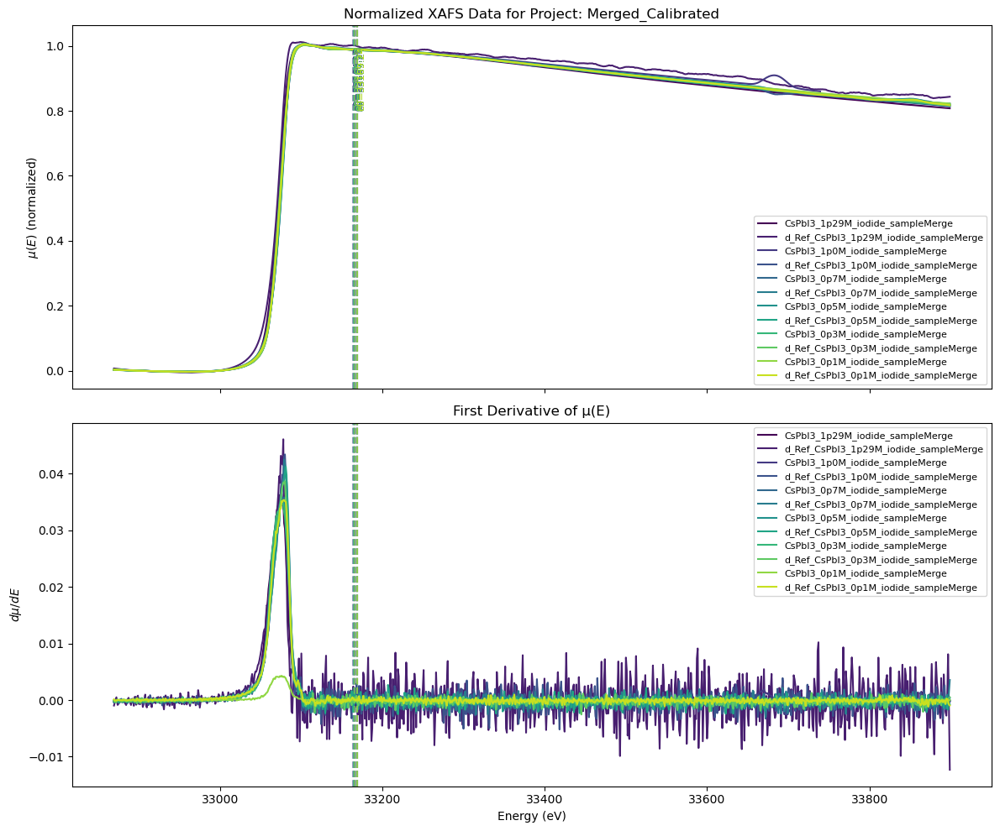


Project: Merged_Calibrated
------------------------------------------------------------
  CsPbI3_1p29M_iodide_sampleMerge:
    energy_shift attribute: 91.2000 eV
    athena_params.bkg.eshift: 91.2000 eV
    Status: NOT APPLIED
  d_Ref_CsPbI3_1p29M_iodide_sampleMerge:
    energy_shift attribute: 91.2000 eV
    athena_params.bkg.eshift: 91.2000 eV
    Status: NOT APPLIED
  CsPbI3_1p0M_iodide_sampleMerge:
    energy_shift attribute: 89.0000 eV
    athena_params.bkg.eshift: 89.0000 eV
    Status: NOT APPLIED
  d_Ref_CsPbI3_1p0M_iodide_sampleMerge:
    energy_shift attribute: 89.0000 eV
    athena_params.bkg.eshift: 89.0000 eV
    Status: NOT APPLIED
  CsPbI3_0p7M_iodide_sampleMerge:
    energy_shift attribute: 90.0000 eV
    athena_params.bkg.eshift: 90.0000 eV
    Status: NOT APPLIED
  d_Ref_CsPbI3_0p7M_iodide_sampleMerge:
    energy_shift attribute: 90.0000 eV
    athena_params.bkg.eshift: 90.0000 eV
    Status: NOT APPLIED
  CsPbI3_0p5M_iodide_sampleMerge:
    energy_shift attribute: 8

In [3]:
# athena_projects_path = r"C:\Users\kwill\Keenan_UCB-O365\OneDrive - UCB-O365\Data\XAS\KW_Cs_EXAXFS_20250511\Iodine_K\Athena"

athena_projects_path = r"./data/I_K"
projects = batch_process_athena_projects(athena_projects_path)
# Check what energy calibration shifts are stored in the loaded projects
if projects:
    show_energy_calibration_info(projects)

In [4]:
# Apply the energy calibration shifts to all groups
# This will shift the energy arrays by the values stored in the Athena project
if projects:
    projects = apply_energy_calibration(projects, verbose=True)
    
    # Re-run pre_edge with the corrected energies and re-apply Savitzky-Golay filter
    from larch.xafs import pre_edge
    from scipy.signal import savgol_filter
    
    window_length = 21
    polyorder = 2
    
    for proj_name, project in projects.items():
        for name, group in project.groups.items():
            if hasattr(group, 'energy') and hasattr(group, 'mu'):
                pre_edge(group)
                
                # Re-apply Savitzky-Golay filter after pre_edge (since pre_edge overwrites norm)
                if hasattr(group, 'norm') and hasattr(group, 'energy'):
                    # Ensure window_length is odd (Savitzky-Golay requires odd window length)
                    window_length_adj = window_length
                    if window_length % 2 == 0:
                        window_length_adj = window_length + 1
                    
                    # Check if data length is sufficient for filtering
                    if len(group.norm) >= window_length_adj:
                        # Apply Savitzky-Golay filter
                        group.norm = savgol_filter(group.norm, window_length_adj, polyorder)
                        print(f"  Re-applied Savitzky-Golay filter (window={window_length_adj}, polyorder={polyorder}) to {name}")
                    else:
                        print(f"  Warning: Data length ({len(group.norm)}) too short for filter (window={window_length_adj}). Skipping filter for {name}.")


Project: Merged_Calibrated
  CsPbI3_1p29M_iodide_sampleMerge: applied energy shift of 91.2000 eV
  d_Ref_CsPbI3_1p29M_iodide_sampleMerge: applied energy shift of 91.2000 eV
  CsPbI3_1p0M_iodide_sampleMerge: applied energy shift of 89.0000 eV
  d_Ref_CsPbI3_1p0M_iodide_sampleMerge: applied energy shift of 89.0000 eV
  CsPbI3_0p7M_iodide_sampleMerge: applied energy shift of 90.0000 eV
  d_Ref_CsPbI3_0p7M_iodide_sampleMerge: applied energy shift of 90.0000 eV
  CsPbI3_0p5M_iodide_sampleMerge: applied energy shift of 88.1000 eV
  d_Ref_CsPbI3_0p5M_iodide_sampleMerge: applied energy shift of 88.1000 eV
  CsPbI3_0p3M_iodide_sampleMerge: applied energy shift of 89.0000 eV
  d_Ref_CsPbI3_0p3M_iodide_sampleMerge: applied energy shift of 89.0000 eV
  CsPbI3_0p1M_iodide_sampleMerge: applied energy shift of 89.8000 eV
  d_Ref_CsPbI3_0p1M_iodide_sampleMerge: applied energy shift of 89.8000 eV
  Re-applied Savitzky-Golay filter (window=21, polyorder=2) to CsPbI3_1p29M_iodide_sampleMerge
  Re-applie

Self-absorption settings: enabled=False, sample=CsPbI3, solvent=DMSO (C2H6OS), density=1.095 g/mL

Processing Project: Merged_Calibrated
  Note: Using 'norm' attribute (Savitzky-Golay filtered) for CsPbI3_1p29M_iodide_sampleMerge as 'norm_corrected'
  Group CsPbI3_1p29M_iodide_sampleMerge: Optimal rbkg = 1.29
  Applied Savitzky-Golay filter (window=21, polyorder=2) to chi(k) for CsPbI3_1p29M_iodide_sampleMerge


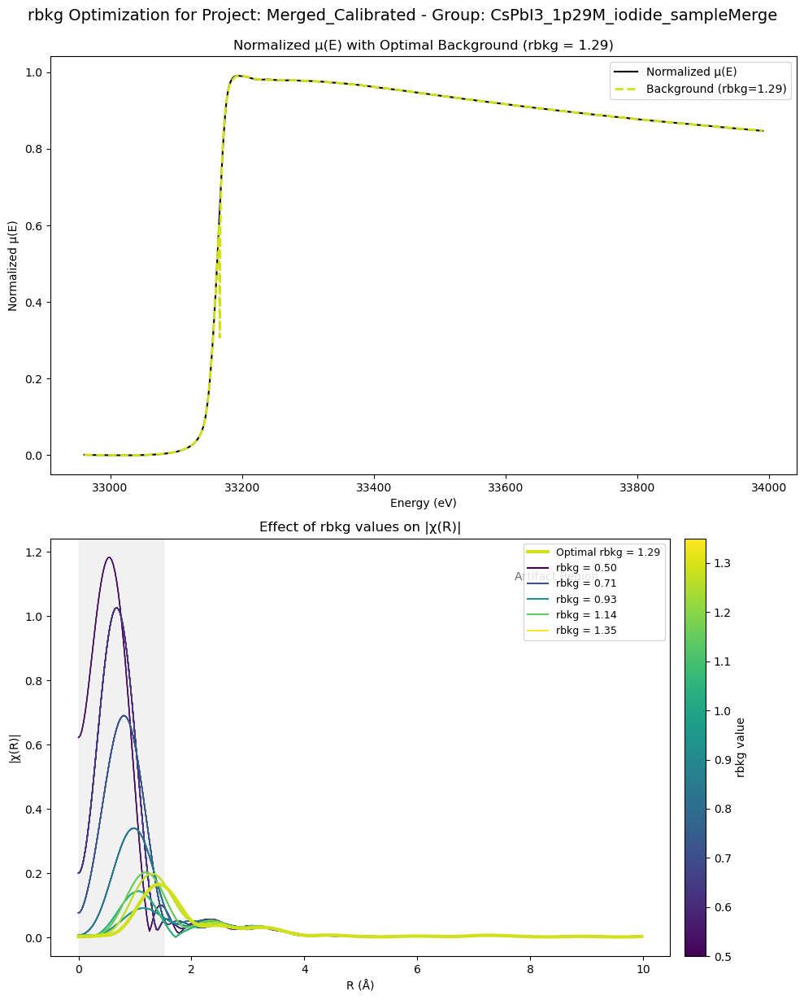

  Note: Using 'norm' attribute (Savitzky-Golay filtered) for d_Ref_CsPbI3_1p29M_iodide_sampleMerge as 'norm_corrected'
  Group d_Ref_CsPbI3_1p29M_iodide_sampleMerge: Optimal rbkg = 1.29
  Applied Savitzky-Golay filter (window=21, polyorder=2) to chi(k) for d_Ref_CsPbI3_1p29M_iodide_sampleMerge


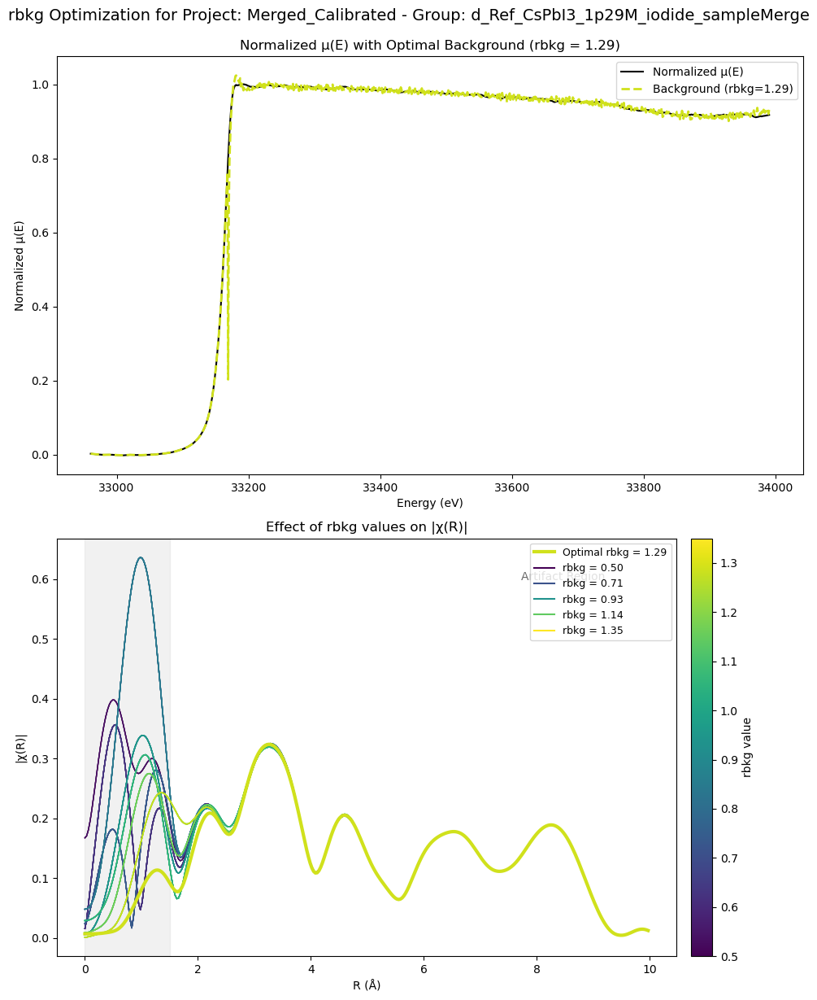

  Note: Using 'norm' attribute (Savitzky-Golay filtered) for CsPbI3_1p0M_iodide_sampleMerge as 'norm_corrected'
  Group CsPbI3_1p0M_iodide_sampleMerge: Optimal rbkg = 1.32
  Applied Savitzky-Golay filter (window=21, polyorder=2) to chi(k) for CsPbI3_1p0M_iodide_sampleMerge


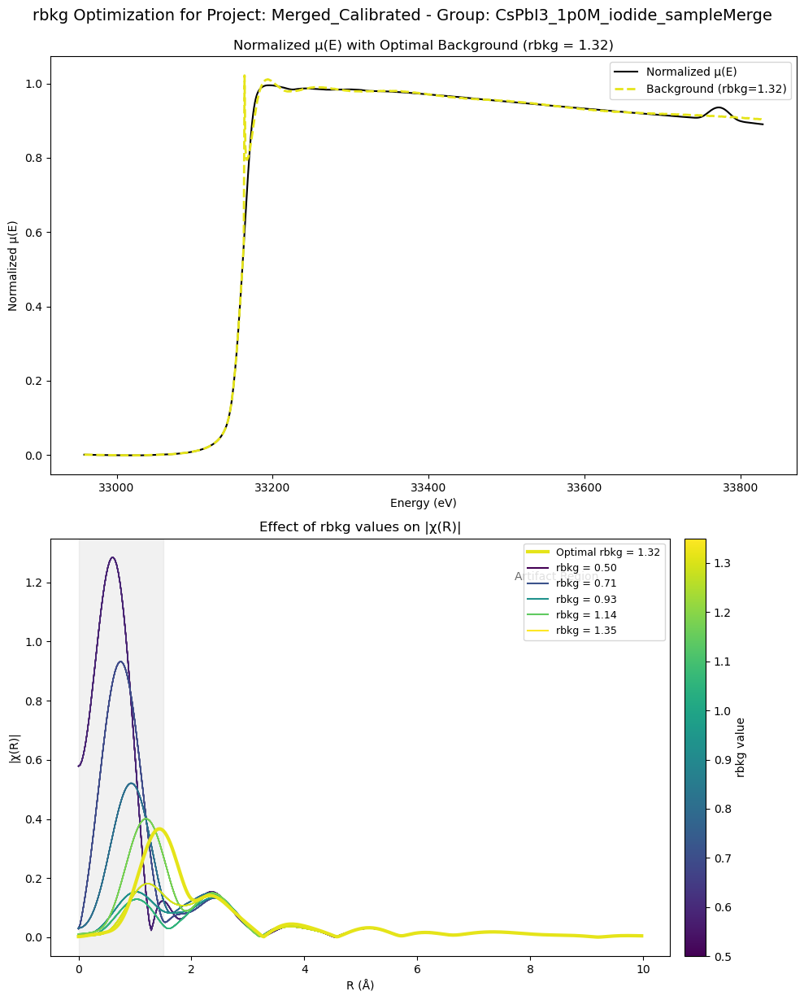

  Note: Using 'norm' attribute (Savitzky-Golay filtered) for d_Ref_CsPbI3_1p0M_iodide_sampleMerge as 'norm_corrected'
  Group d_Ref_CsPbI3_1p0M_iodide_sampleMerge: Optimal rbkg = 1.08
  Applied Savitzky-Golay filter (window=21, polyorder=2) to chi(k) for d_Ref_CsPbI3_1p0M_iodide_sampleMerge


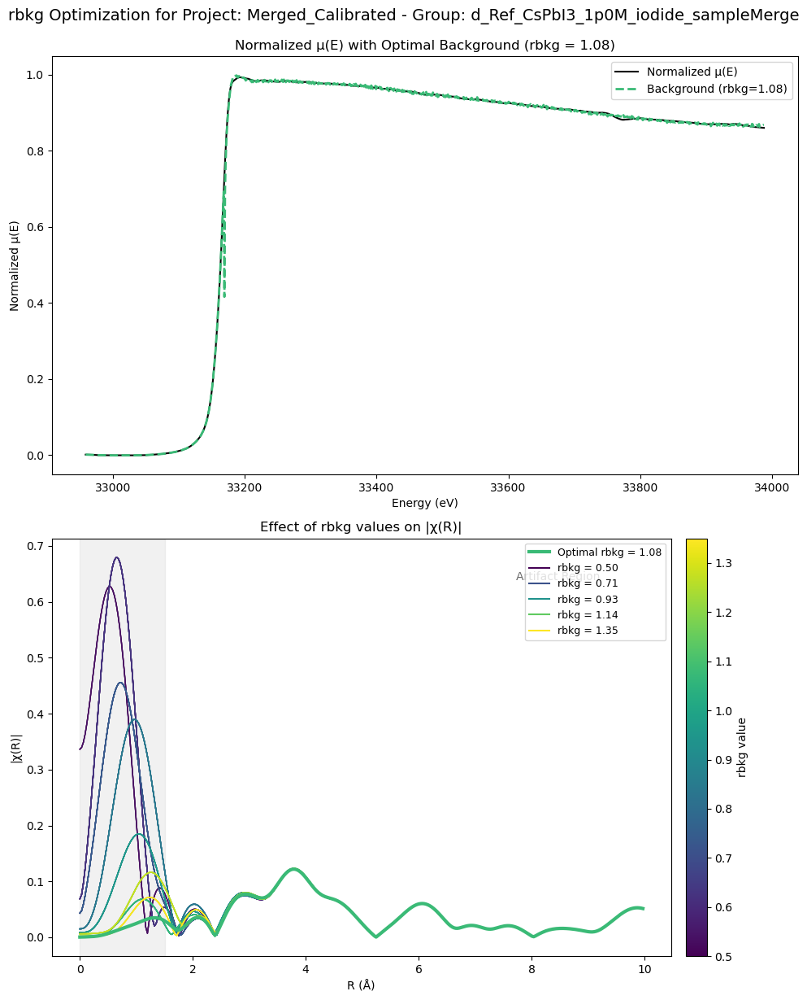

  Note: Using 'norm' attribute (Savitzky-Golay filtered) for CsPbI3_0p7M_iodide_sampleMerge as 'norm_corrected'
  Group CsPbI3_0p7M_iodide_sampleMerge: Optimal rbkg = 1.29
  Applied Savitzky-Golay filter (window=21, polyorder=2) to chi(k) for CsPbI3_0p7M_iodide_sampleMerge


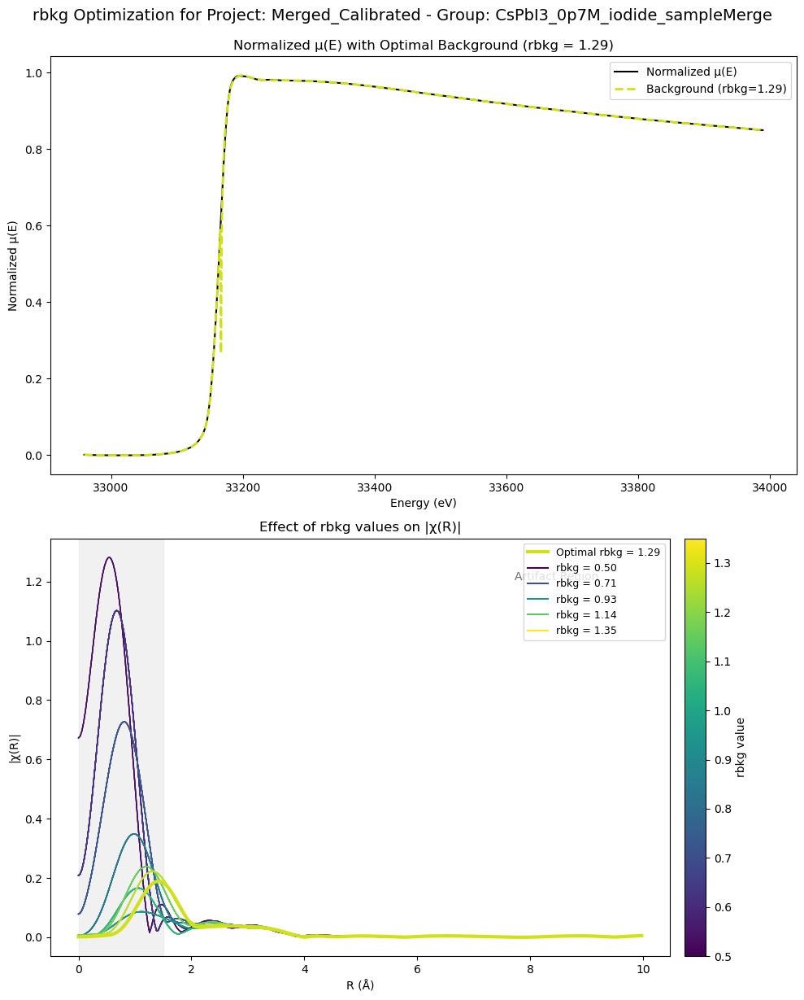

  Note: Using 'norm' attribute (Savitzky-Golay filtered) for d_Ref_CsPbI3_0p7M_iodide_sampleMerge as 'norm_corrected'
  Group d_Ref_CsPbI3_0p7M_iodide_sampleMerge: Optimal rbkg = 1.29
  Applied Savitzky-Golay filter (window=21, polyorder=2) to chi(k) for d_Ref_CsPbI3_0p7M_iodide_sampleMerge


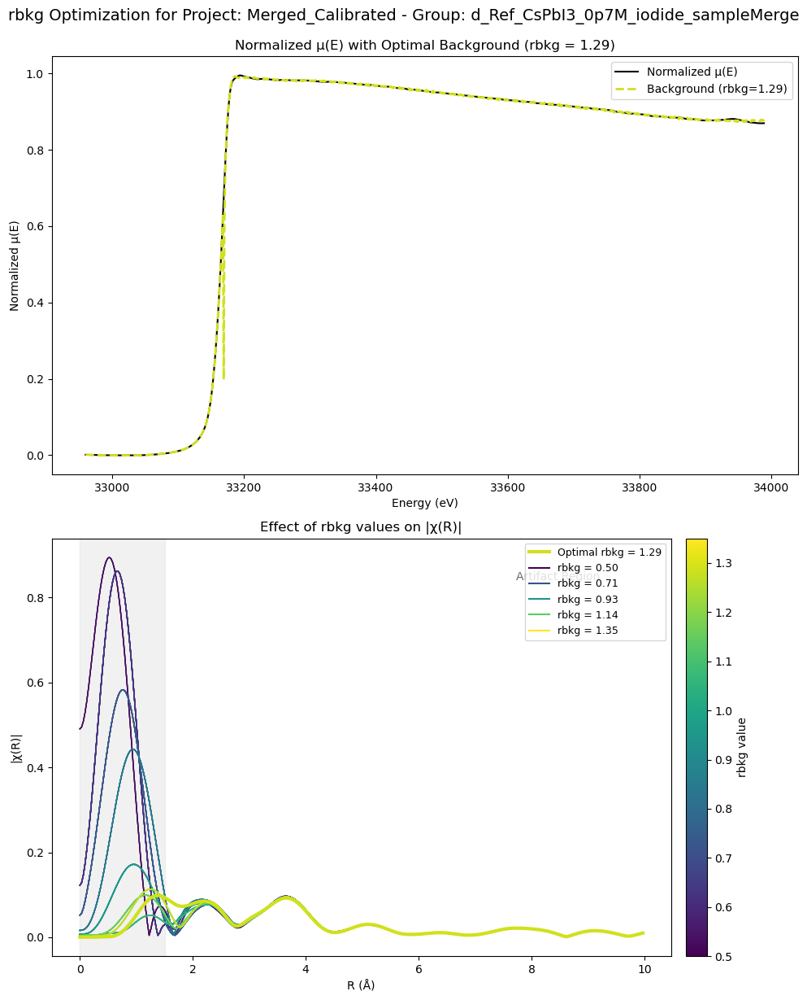

  Note: Using 'norm' attribute (Savitzky-Golay filtered) for CsPbI3_0p5M_iodide_sampleMerge as 'norm_corrected'
  Group CsPbI3_0p5M_iodide_sampleMerge: Optimal rbkg = 1.29
  Applied Savitzky-Golay filter (window=21, polyorder=2) to chi(k) for CsPbI3_0p5M_iodide_sampleMerge


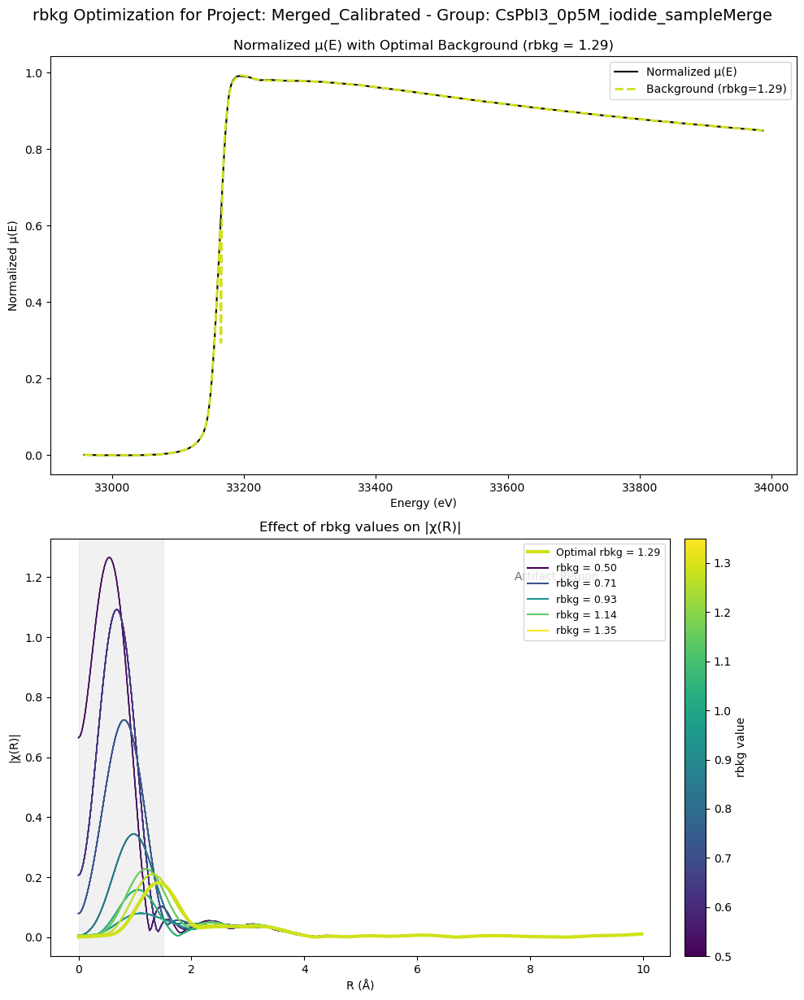

  Note: Using 'norm' attribute (Savitzky-Golay filtered) for d_Ref_CsPbI3_0p5M_iodide_sampleMerge as 'norm_corrected'
  Group d_Ref_CsPbI3_0p5M_iodide_sampleMerge: Optimal rbkg = 1.08
  Applied Savitzky-Golay filter (window=21, polyorder=2) to chi(k) for d_Ref_CsPbI3_0p5M_iodide_sampleMerge


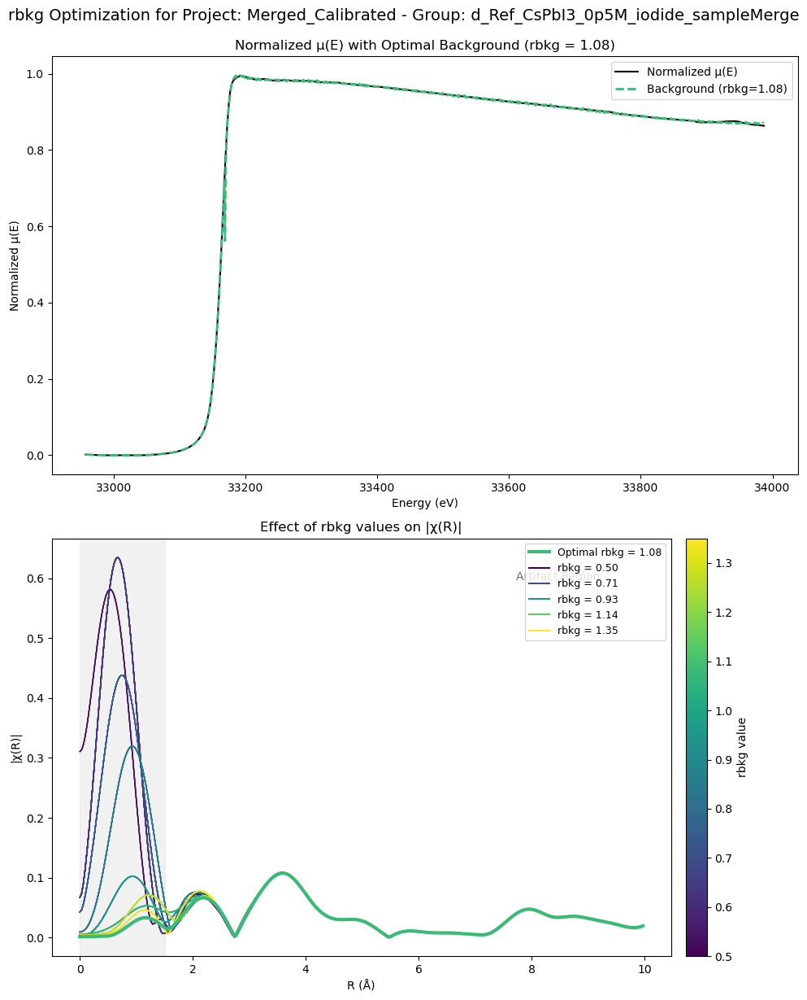

  Note: Using 'norm' attribute (Savitzky-Golay filtered) for CsPbI3_0p3M_iodide_sampleMerge as 'norm_corrected'
  Group CsPbI3_0p3M_iodide_sampleMerge: Optimal rbkg = 1.29
  Applied Savitzky-Golay filter (window=21, polyorder=2) to chi(k) for CsPbI3_0p3M_iodide_sampleMerge


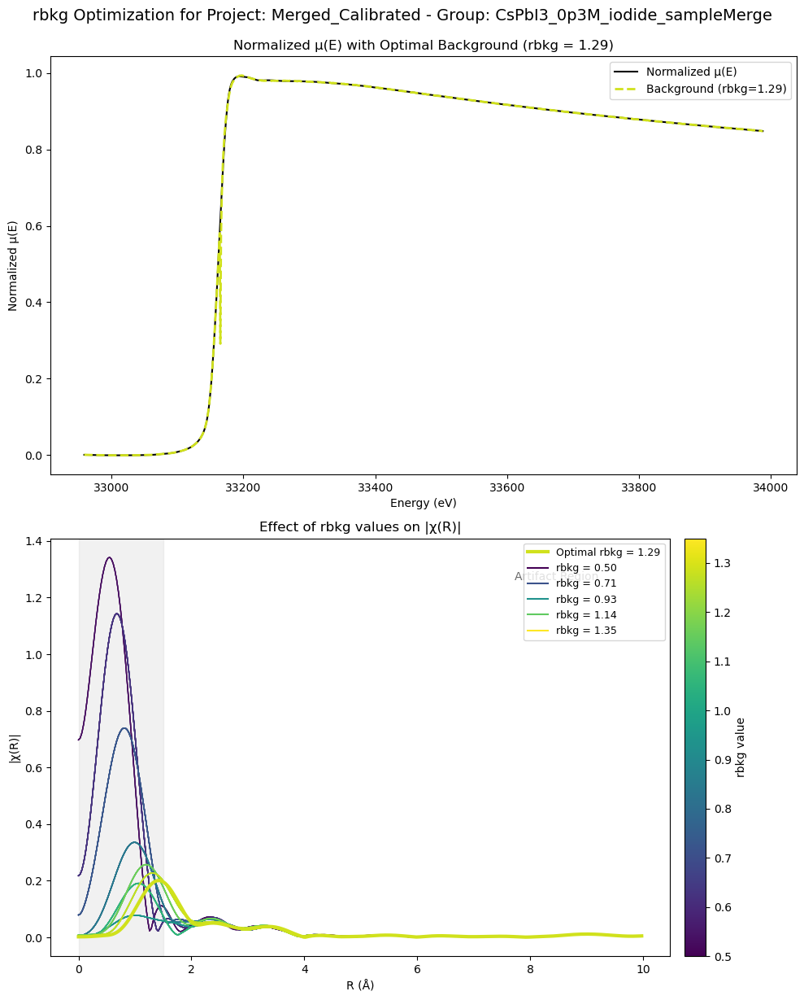

  Note: Using 'norm' attribute (Savitzky-Golay filtered) for d_Ref_CsPbI3_0p3M_iodide_sampleMerge as 'norm_corrected'
  Group d_Ref_CsPbI3_0p3M_iodide_sampleMerge: Optimal rbkg = 1.29
  Applied Savitzky-Golay filter (window=21, polyorder=2) to chi(k) for d_Ref_CsPbI3_0p3M_iodide_sampleMerge


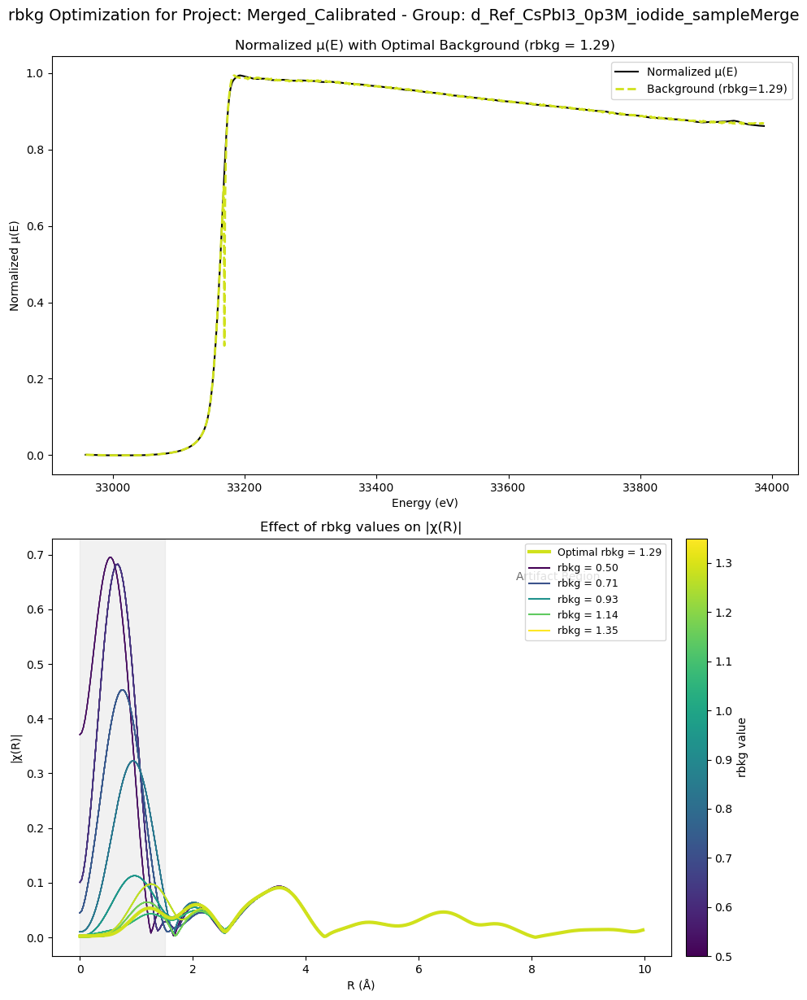

  Note: Using 'norm' attribute (Savitzky-Golay filtered) for CsPbI3_0p1M_iodide_sampleMerge as 'norm_corrected'
  Group CsPbI3_0p1M_iodide_sampleMerge: Optimal rbkg = 1.29
  Applied Savitzky-Golay filter (window=21, polyorder=2) to chi(k) for CsPbI3_0p1M_iodide_sampleMerge


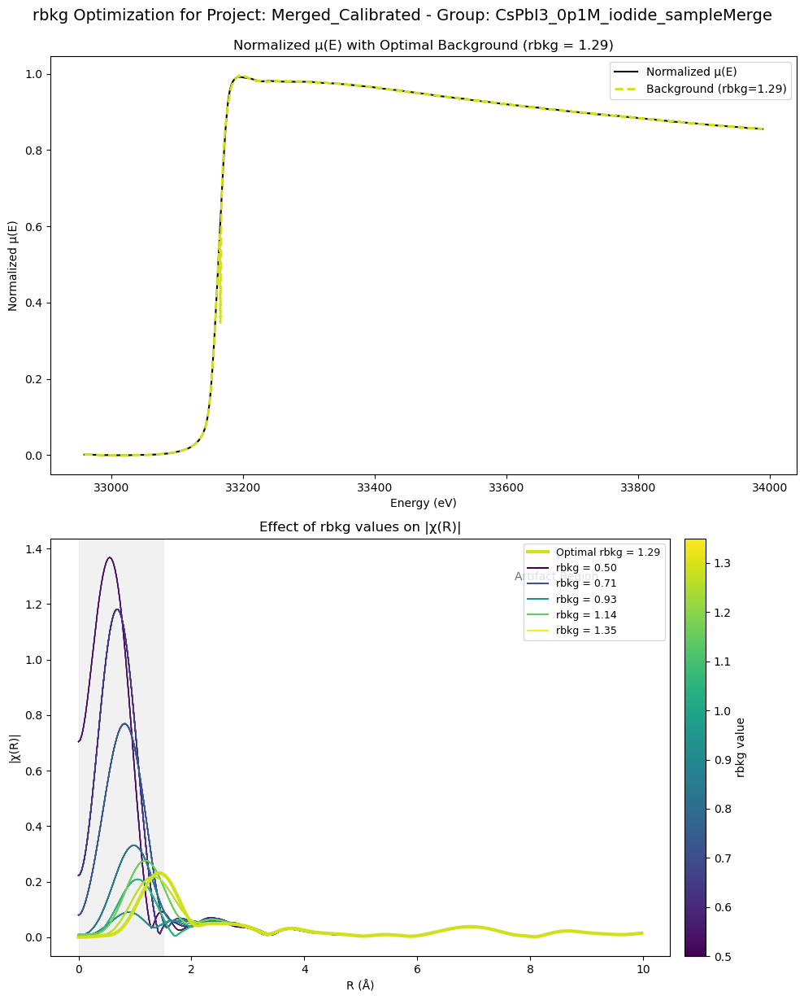

  Note: Using 'norm' attribute (Savitzky-Golay filtered) for d_Ref_CsPbI3_0p1M_iodide_sampleMerge as 'norm_corrected'
  Group d_Ref_CsPbI3_0p1M_iodide_sampleMerge: Optimal rbkg = 0.97
  Applied Savitzky-Golay filter (window=21, polyorder=2) to chi(k) for d_Ref_CsPbI3_0p1M_iodide_sampleMerge


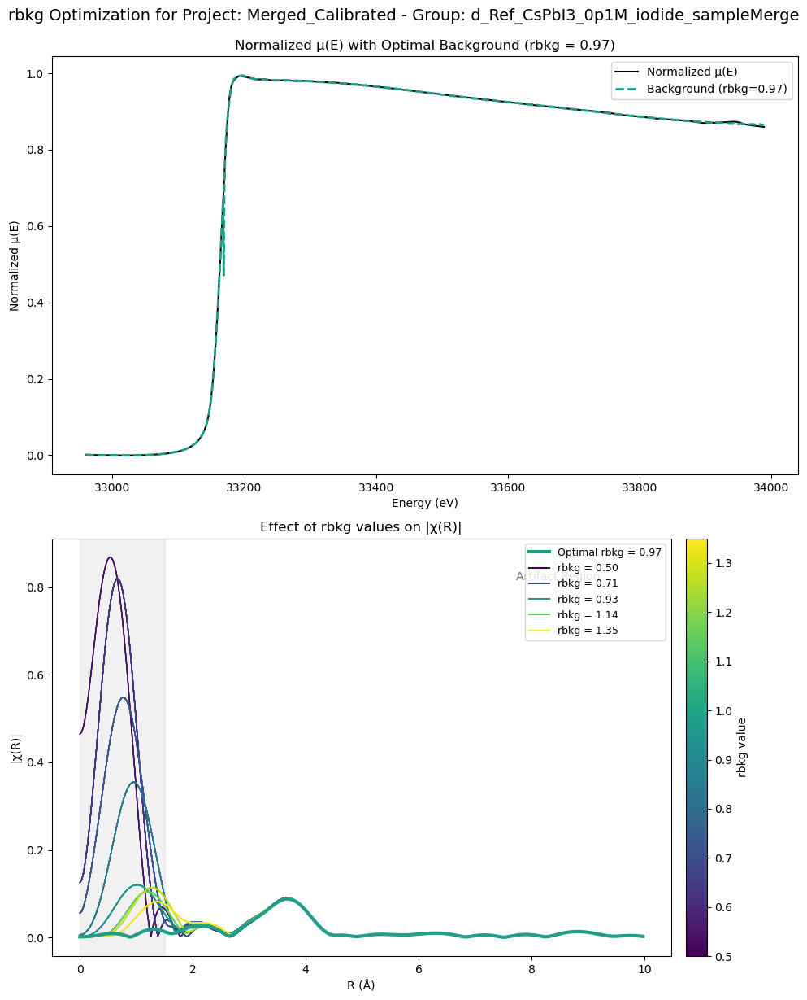


Project: Merged_Calibrated
  CsPbI3_1p29M_iodide_sampleMerge: optimal rbkg = 1.29
  d_Ref_CsPbI3_1p29M_iodide_sampleMerge: optimal rbkg = 1.29
  CsPbI3_1p0M_iodide_sampleMerge: optimal rbkg = 1.32
  d_Ref_CsPbI3_1p0M_iodide_sampleMerge: optimal rbkg = 1.08
  CsPbI3_0p7M_iodide_sampleMerge: optimal rbkg = 1.29
  d_Ref_CsPbI3_0p7M_iodide_sampleMerge: optimal rbkg = 1.29
  CsPbI3_0p5M_iodide_sampleMerge: optimal rbkg = 1.29
  d_Ref_CsPbI3_0p5M_iodide_sampleMerge: optimal rbkg = 1.08
  CsPbI3_0p3M_iodide_sampleMerge: optimal rbkg = 1.29
  d_Ref_CsPbI3_0p3M_iodide_sampleMerge: optimal rbkg = 1.29
  CsPbI3_0p1M_iodide_sampleMerge: optimal rbkg = 1.29
  d_Ref_CsPbI3_0p1M_iodide_sampleMerge: optimal rbkg = 0.97


In [5]:

def background_optimizer(projects, apply_self_absorption=True, sample_formula='CsPbI3',
                         absorber_element='I', absorber_edge='K', fluorescence_line='Ka',
                         solvent='DMSO', solvent_formula=None,
                         solvent_density_g_ml=None, solvent_molar_mass_g_mol=None):
    """
    Perform batch background subtraction and rbkg optimization on projects.
    
    Parameters:
    -----------
    projects : dict
        Dictionary of projects loaded from batch_process_athena_projects()
    
    This function:
    - Uses Savitzky-Golay filtered normalized data (from group.norm, which is filtered)
    - Loops through all groups in all provided projects
    - Tests a range of rbkg values for each group
    - Computes a smoothness metric based on low-R artifacts
    - Selects the optimal rbkg value that minimizes artifacts
    - Applies the optimal background subtraction to each group
    - Creates diagnostic plots for visualization
    - Stores the optimal rbkg value as an attribute on each group
    
    Note: This function uses the noise-filtered normalized data (group.norm) that was
    processed with Savitzky-Golay filter (window=21, polyorder=2) in batch_process_athena_projects.
    Additionally, after autobk calculates chi(k), the filter is applied directly to chi(k)
    to ensure noise reduction is visible in chi(k) visualizations.
    
    Returns:
    --------
    dict
        The modified projects dictionary
    """
    import re
    import matplotlib.cm as cm
    import numpy as np
    import matplotlib.pyplot as plt
    from larch.xafs import autobk, xftf, fluo_corr

    if not projects:
        print("No projects provided for background optimization")
        return None

    solvent_defaults = {
        'DMSO': {'formula': 'C2H6OS', 'density': 1.095, 'molar_mass': 78.13},
        'DMF': {'formula': 'C3H7NO', 'density': 0.944, 'molar_mass': 73.09},
        'ACN': {'formula': 'C2H3N', 'density': 0.786, 'molar_mass': 41.05},
        'GBL': {'formula': 'C4H6O2', 'density': 1.12, 'molar_mass': 86.09},
    }

    solvent_key = str(solvent).upper() if solvent is not None else 'DMSO'
    default_solvent = solvent_defaults.get(solvent_key, solvent_defaults['DMSO'])
    solvent_formula = solvent_formula or default_solvent['formula']
    solvent_density_g_ml = solvent_density_g_ml if solvent_density_g_ml is not None else default_solvent['density']
    solvent_molar_mass_g_mol = solvent_molar_mass_g_mol if solvent_molar_mass_g_mol is not None else default_solvent['molar_mass']

    def _parse_formula(formula):
        tokens = re.findall(r'([A-Z][a-z]?)([0-9]*\.?[0-9]*)', str(formula))
        counts = {}
        for elem, count in tokens:
            val = float(count) if count else 1.0
            counts[elem] = counts.get(elem, 0.0) + val
        return counts

    def _extract_molarity_from_name(name):
        match = re.search(r'(\d+(?:p\d+)?)M', str(name))
        if not match:
            return None
        return float(match.group(1).replace('p', '.'))

    def _format_formula(counts):
        parts = []
        for elem, value in counts.items():
            if value <= 0:
                continue
            rounded = float(f"{value:.6g}")
            if abs(rounded - 1.0) < 1.0e-12:
                parts.append(f"{elem}")
            else:
                parts.append(f"{elem}{rounded:g}")
        return ''.join(parts)

    def _build_mixture_formula(molarity_m):
        if molarity_m is None or molarity_m <= 0:
            return None

        solute_counts = _parse_formula(sample_formula)
        solvent_counts = _parse_formula(solvent_formula)
        if not solute_counts or not solvent_counts:
            return None

        # Assume a 1 L solution basis. Solvent moles are approximated from density and molar mass.
        n_solute = molarity_m
        n_solvent = (float(solvent_density_g_ml) * 1000.0) / float(solvent_molar_mass_g_mol)

        mixture_counts = {}
        for elem, count in solute_counts.items():
            mixture_counts[elem] = mixture_counts.get(elem, 0.0) + count * n_solute
        for elem, count in solvent_counts.items():
            mixture_counts[elem] = mixture_counts.get(elem, 0.0) + count * n_solvent

        absorber_count = mixture_counts.get(absorber_element, 0.0)
        if absorber_count > 0:
            for elem in list(mixture_counts.keys()):
                mixture_counts[elem] = mixture_counts[elem] / absorber_count

        return _format_formula(mixture_counts)

    print(f"Self-absorption settings: enabled={apply_self_absorption}, sample={sample_formula}, "
          f"solvent={solvent_key} ({solvent_formula}), density={solvent_density_g_ml} g/mL")

    for proj_name, project in projects.items():
        print(f"\nProcessing Project: {proj_name}")
        for group_name, group in project.groups.items():
            # First check if we have the required attributes
            if hasattr(group, 'energy') and hasattr(group, 'mu'):
                if apply_self_absorption:
                    molarity_m = _extract_molarity_from_name(group_name)
                    mixture_formula = _build_mixture_formula(molarity_m)
                    if mixture_formula is None:
                        print(f"  Self-absorption skipped for {group_name}: could not determine concentration/composition")
                    else:
                        try:
                            fluo_corr(group.energy, group.mu, formula=mixture_formula,
                                      elem=absorber_element, group=group,
                                      edge=absorber_edge, line=fluorescence_line)
                            if hasattr(group, 'mu_corr'):
                                group.mu = group.mu_corr.copy() if isinstance(group.mu_corr, np.ndarray) else group.mu_corr
                            group.selfabs_formula = mixture_formula
                            group.selfabs_molarity_m = molarity_m
                            print(f"  Applied self-absorption correction for {group_name} using formula: {mixture_formula}")
                        except Exception as e:
                            print(f"  Warning: Self-absorption correction failed for {group_name}: {e}")

                # Check for norm_corrected, preferring corrected normalization when available
                if hasattr(group, 'norm_corr'):
                    group.norm_corrected = group.norm_corr.copy() if isinstance(group.norm_corr, np.ndarray) else group.norm_corr
                    print(f"  Using self-absorption corrected normalization for {group_name}")
                elif not hasattr(group, 'norm_corrected'):
                    if hasattr(group, 'norm'):
                        print(f"  Note: Using 'norm' attribute (Savitzky-Golay filtered) for {group_name} as 'norm_corrected'")
                        if isinstance(group.norm, np.ndarray):
                            group.norm_corrected = group.norm.copy()
                        else:
                            group.norm_corrected = group.norm
                    else:
                        print(f"  Skipping group {group_name}: Missing normalization data")
                        continue
                else:
                    if hasattr(group, 'norm'):
                        if isinstance(group.norm, np.ndarray):
                            group.norm_corrected = group.norm.copy()
                            print(f"  Updated 'norm_corrected' with filtered 'norm' data for {group_name}")
                
                # Set up optimization parameters
                rbkg_values = np.linspace(0.5, 1.35, 100)
                rbkg_results = []
                fig, axs = plt.subplots(2, 1, figsize=(10, 12))
                cmap = cm.viridis
                norm_c = plt.Normalize(rbkg_values.min(), rbkg_values.max())

                # Test different rbkg values
                for rbkg in rbkg_values:
                    color = cmap(norm_c(rbkg))
                    # Create a temporary copy to avoid modifying the original group
                    # IMPORTANT: Make proper copies of numpy arrays to preserve filtered data
                    import numpy as np
                    temp_group = type(group)()
                    for attr in ['energy', 'mu', 'norm_corrected', 'e0', 'edge_step']:
                        if hasattr(group, attr):
                            attr_value = getattr(group, attr)
                            # Make a copy if it's a numpy array
                            if isinstance(attr_value, np.ndarray):
                                setattr(temp_group, attr, attr_value.copy())
                            else:
                                setattr(temp_group, attr, attr_value)
                    # Use the filtered norm_corrected data
                    if isinstance(temp_group.norm_corrected, np.ndarray):
                        temp_group.norm = temp_group.norm_corrected.copy()
                    else:
                        temp_group.norm = temp_group.norm_corrected
                    autobk(temp_group, rbkg=rbkg, kweight=1)
                    xftf(temp_group, kmin=2, kmax=6, dk=4, kwindow='hanning', kweight=3)
                    
                    if hasattr(temp_group, 'chir_mag') and hasattr(temp_group, 'r'):
                        r_mask = (temp_group.r > 0) & (temp_group.r < 1.0)
                        if np.any(r_mask):
                            low_r_intensity = integrate_method(temp_group.chir_mag[r_mask], 
                                                               temp_group.r[r_mask])
                            rbkg_results.append((rbkg, low_r_intensity, temp_group))
                            axs[1].plot(temp_group.r, temp_group.chir_mag, color=color,
                                        alpha=0.7, linewidth=1)
                
                # Process results if we have any
                if rbkg_results:
                    rbkg_results.sort(key=lambda x: x[1])
                    best_rbkg, best_metric, best_temp = rbkg_results[0]
                    best_color = cmap(norm_c(best_rbkg))
                    print(f"  Group {group_name}: Optimal rbkg = {best_rbkg:.2f}")

                    # Create a background copy of the group
                    # IMPORTANT: Make proper copies of numpy arrays to preserve filtered data
                    import numpy as np
                    bkg_group = type(group)()
                    for attr in ['energy', 'mu', 'norm_corrected', 'e0', 'edge_step']:
                        if hasattr(group, attr):
                            attr_value = getattr(group, attr)
                            # Make a copy if it's a numpy array
                            if isinstance(attr_value, np.ndarray):
                                setattr(bkg_group, attr, attr_value.copy())
                            else:
                                setattr(bkg_group, attr, attr_value)
                    # Use the filtered norm_corrected data
                    if isinstance(bkg_group.norm_corrected, np.ndarray):
                        bkg_group.norm = bkg_group.norm_corrected.copy()
                    else:
                        bkg_group.norm = bkg_group.norm_corrected
                    autobk(bkg_group, rbkg=best_rbkg, kweight=2)

                    # Apply optimal background to original group
                    # Use the filtered norm_corrected data (make a copy to avoid reference issues)
                    import numpy as np
                    from scipy.signal import savgol_filter
                    if isinstance(group.norm_corrected, np.ndarray):
                        group.norm = group.norm_corrected.copy()
                    else:
                        group.norm = group.norm_corrected
                    autobk(group, rbkg=best_rbkg, kweight=3)
                    
                    # IMPORTANT: Apply Savitzky-Golay filter directly to chi(k) after autobk
                    # This ensures noise filtering is applied to chi(k) data
                    if hasattr(group, 'chi') and hasattr(group, 'k'):
                        window_length = 21
                        polyorder = 2
                        # Ensure window_length is odd
                        window_length_adj = window_length if window_length % 2 == 1 else window_length + 1
                        
                        # Check if data length is sufficient for filtering
                        if len(group.chi) >= window_length_adj:
                            # Store original chi if not already stored
                            if not hasattr(group, 'chi_original'):
                                group.chi_original = group.chi.copy()
                            
                            # Apply Savitzky-Golay filter to chi(k)
                            group.chi = savgol_filter(group.chi, window_length_adj, polyorder)
                            print(f"  Applied Savitzky-Golay filter (window={window_length_adj}, polyorder={polyorder}) to chi(k) for {group_name}")
                        else:
                            print(f"  Warning: chi(k) data length ({len(group.chi)}) too short for filter (window={window_length_adj}). Skipping filter for {group_name}.")
                    
                    xftf(group, kmin=2, kmax=6, dk=4, kwindow='hanning', kweight=3)
                    
                    # Store the optimal value for future reference
                    group.optimal_rbkg = best_rbkg
                    
                    # Calculate pre-edge contribution for plotting
                    pre_edge_mu = group.mu - group.norm_corrected * group.edge_step

                    # Plot optimized results
                    axs[0].plot(group.energy, group.norm_corrected, label='Normalized μ(E)', 
                                color='black')
                    if hasattr(bkg_group, 'bkg') and (len(bkg_group.bkg) == len(bkg_group.energy)):
                        bkg_norm = (bkg_group.bkg - pre_edge_mu) / group.edge_step
                        if len(bkg_norm) == len(group.energy):
                            axs[0].plot(group.energy, bkg_norm, 
                                        label=f'Background (rbkg={best_rbkg:.2f})', 
                                        linestyle='--', color=best_color, linewidth=2)
                        else:
                            print("  Warning: Shape mismatch between energy and background. Skipping background plot.")
                    else:
                        print("  Warning: Could not generate background curve for plot.")
                    
                    axs[0].set_xlabel('Energy (eV)')
                    axs[0].set_ylabel('Normalized μ(E)')
                    axs[0].set_title(f"Normalized μ(E) with Optimal Background (rbkg = {best_rbkg:.2f})")
                    axs[0].legend()

                    axs[1].plot(best_temp.r, best_temp.chir_mag, 
                                label=f'Optimal rbkg = {best_rbkg:.2f}', color=best_color,
                                linewidth=3, zorder=10)
                    
                    # Add a few representative rbkg values to the legend
                    legend_rbkg_values = [rbkg_values[0],
                                          rbkg_values[len(rbkg_values)//4],
                                          rbkg_values[len(rbkg_values)//2],
                                          rbkg_values[3*len(rbkg_values)//4],
                                          rbkg_values[-1]]
                    for rbkg in legend_rbkg_values:
                        if rbkg != best_rbkg:
                            color = cmap(norm_c(rbkg))
                            axs[1].plot([], [], label=f'rbkg = {rbkg:.2f}', color=color, linewidth=1.5)
                    
                    axs[1].set_xlabel('R (Å)')
                    axs[1].set_ylabel('|χ(R)|')
                    axs[1].set_title("Effect of rbkg values on |χ(R)|")
                    axs[1].axvspan(0, 1.5, color='lightgray', alpha=0.3)
                    axs[1].text(0.75, 0.9, "Artifact Region", color='dimgray',
                                transform=axs[1].transAxes, fontsize=10)
                    
                    sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm_c)
                    sm.set_array([])
                    cbar = fig.colorbar(sm, ax=axs[1], orientation='vertical', pad=0.02)
                    cbar.set_label('rbkg value')
                    
                    axs[1].legend(loc='upper right', fontsize=9)
                    
                    plt.tight_layout()
                    plt.suptitle(f"rbkg Optimization for Project: {proj_name} - Group: {group_name}", 
                                 fontsize=14, y=1.02)
                    plt.show()
                else:
                    print(f"  Couldn't optimize rbkg for {group_name}: No valid results")
            else:
                missing = [attr for attr in ['energy', 'mu'] if not hasattr(group, attr)]
                print(f"  Skipping group {group_name}: Missing required attributes: {', '.join(missing)}")
                
    return projects  # Return the modified projects


# Use the optimized background removal with self-absorption correction
projects = background_optimizer(
    projects,
    apply_self_absorption=False,
    sample_formula='CsPbI3',
    absorber_element='I',
    absorber_edge='K',
    fluorescence_line='Ka',
    solvent='DMSO',
    solvent_density_g_ml=1.095,
    solvent_molar_mass_g_mol=78.13,
)

# Check the results
if projects:
    for proj_name, project in projects.items():
        print(f"\nProject: {proj_name}")
        for group_name, group in project.groups.items():
            if hasattr(group, 'optimal_rbkg'):
                print(f"  {group_name}: optimal rbkg = {group.optimal_rbkg:.2f}")


Processing Project: Merged_Calibrated


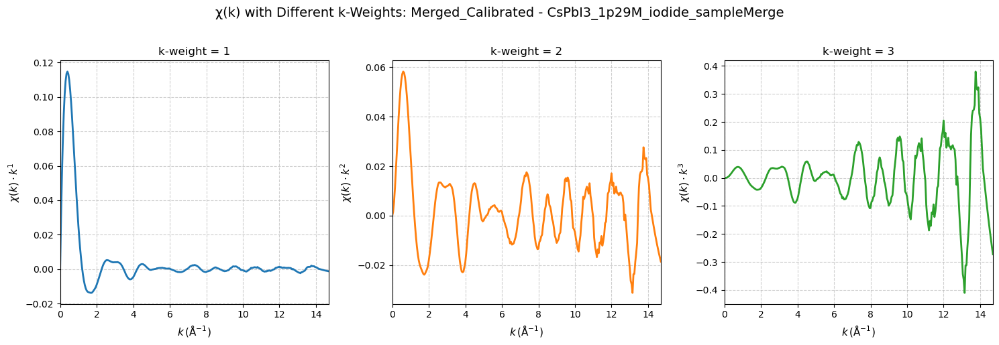

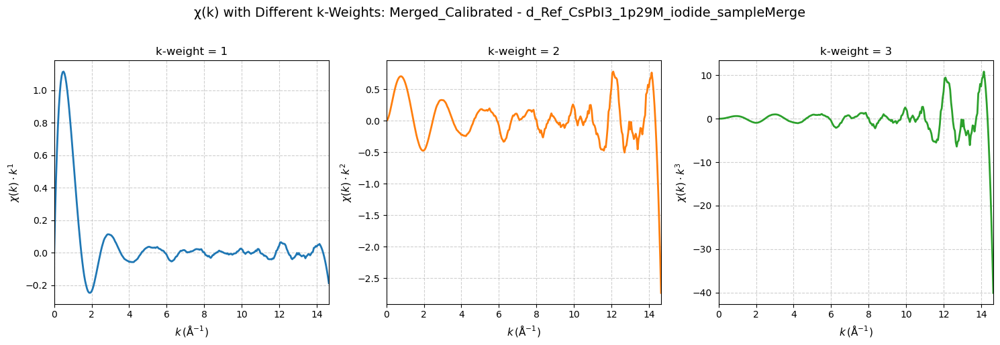

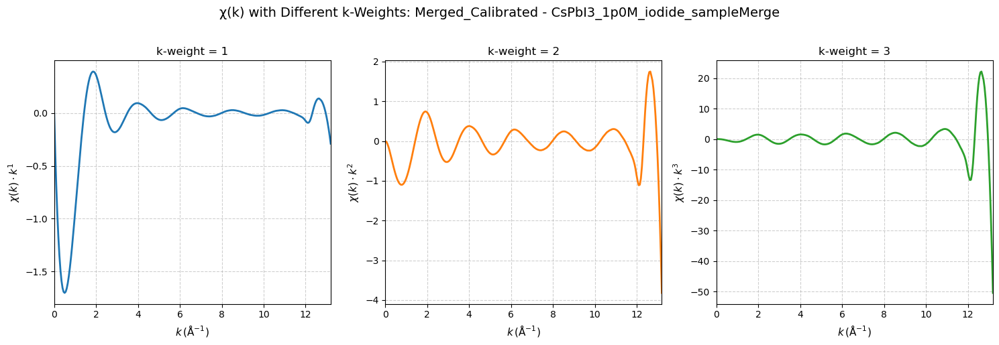

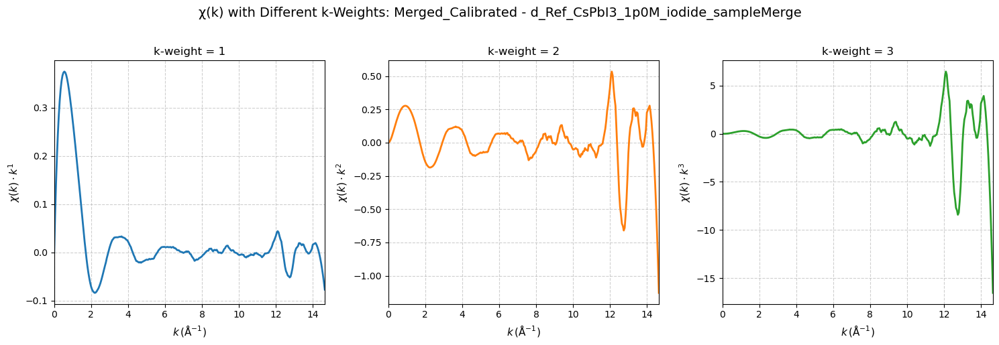

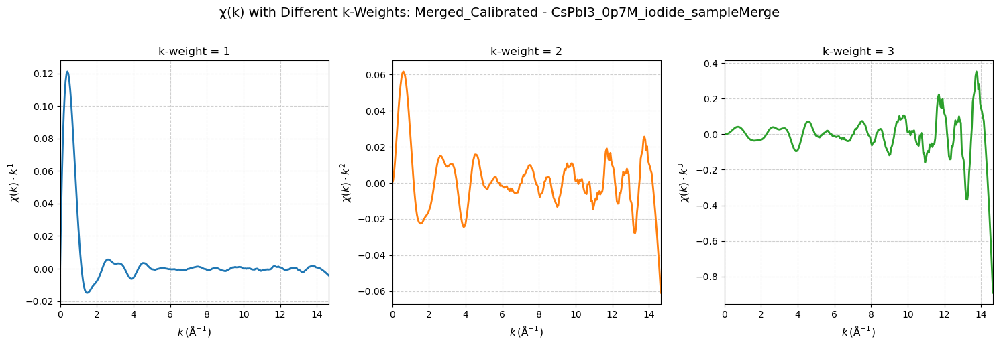

...

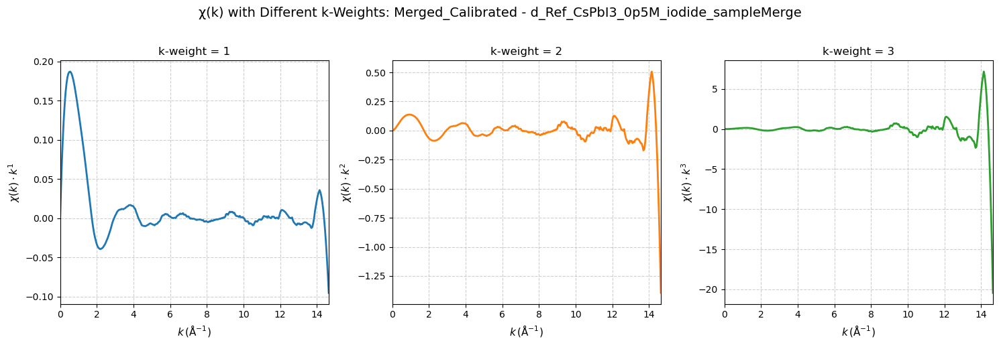

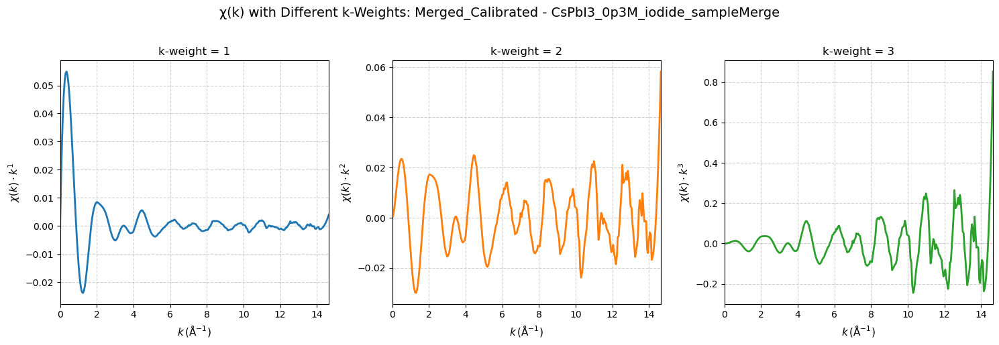

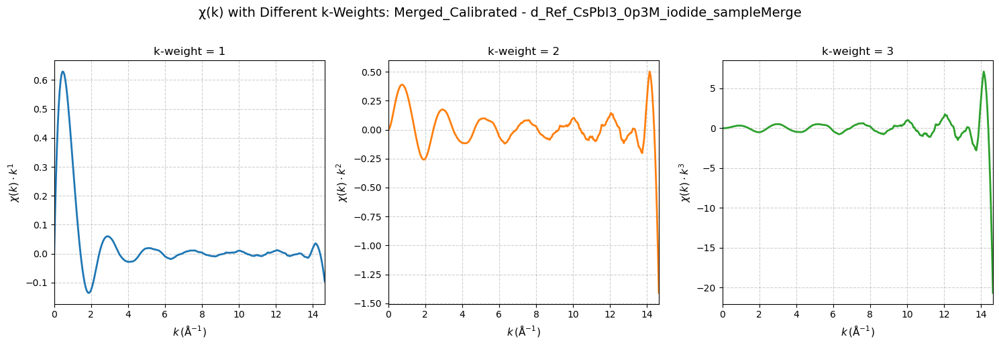

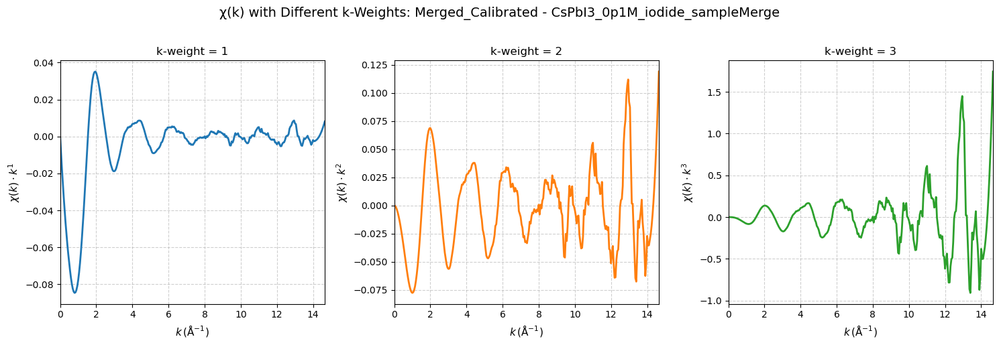

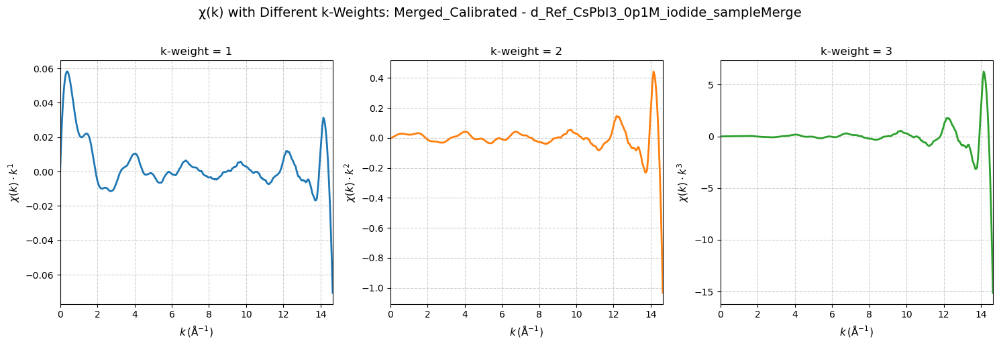


Processing chi(k) smoothing and truncation for Project: Merged_Calibrated
Found 12 groups with chi(k) data
  Processing group: CsPbI3_1p29M_iodide_sampleMerge


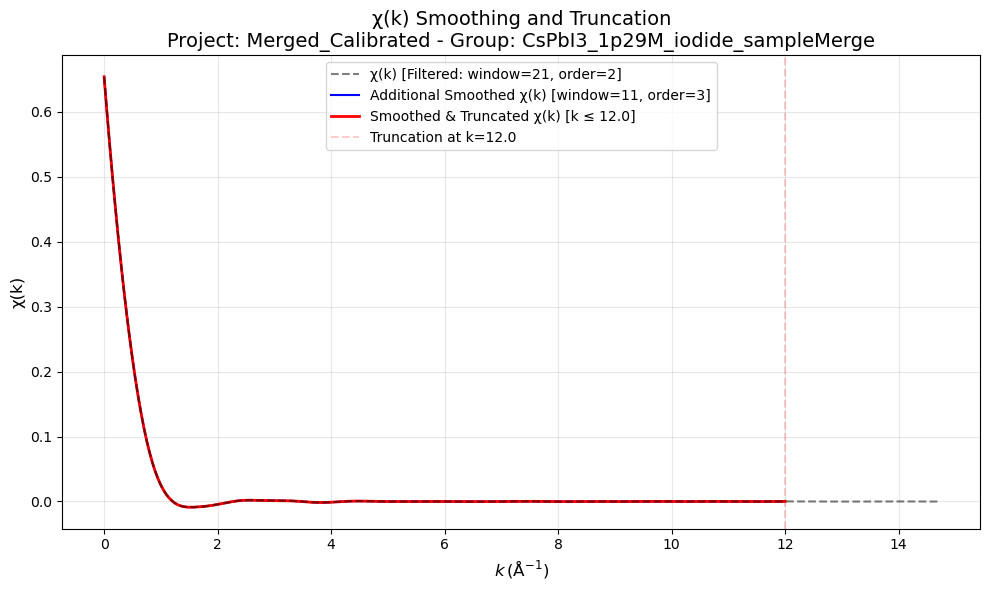

    Max change from smoothing: 0.000170
    Truncation removed 54 points where k > 12.0
  Processing group: d_Ref_CsPbI3_1p29M_iodide_sampleMerge


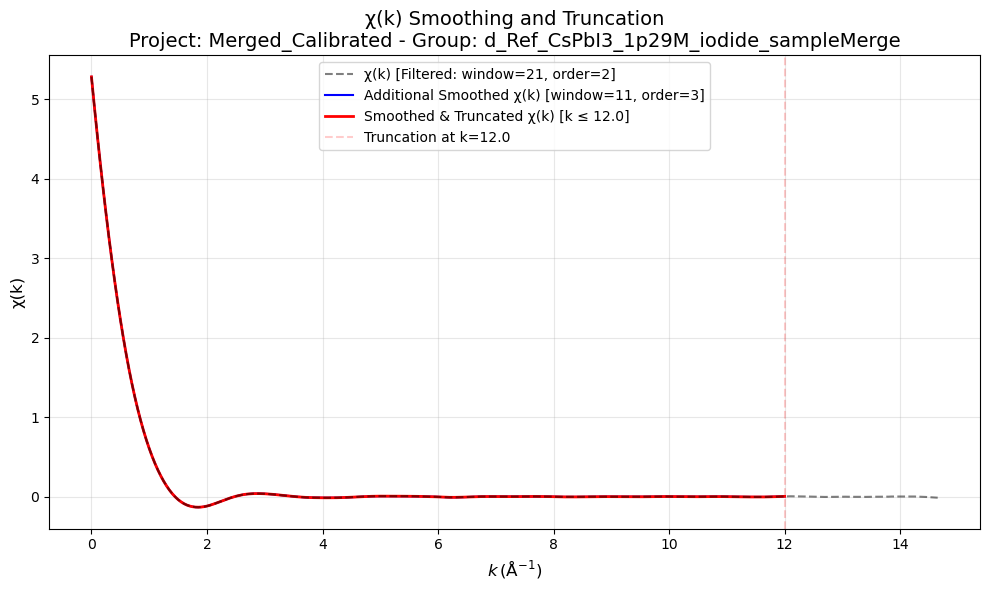

    Max change from smoothing: 0.001050
    Truncation removed 53 points where k > 12.0
  Processing group: CsPbI3_1p0M_iodide_sampleMerge


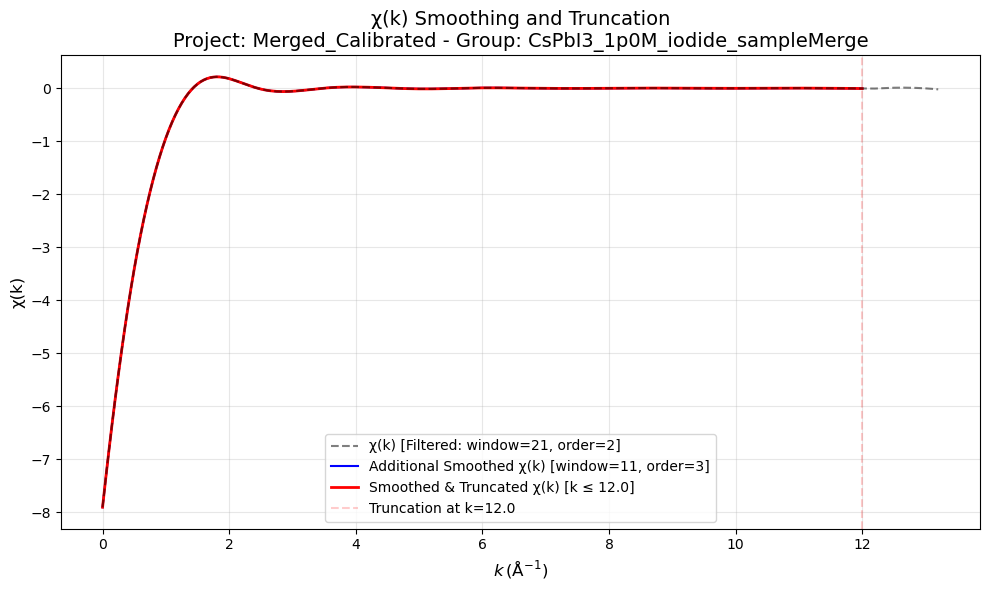

    Max change from smoothing: 0.003890
    Truncation removed 24 points where k > 12.0
  Processing group: d_Ref_CsPbI3_1p0M_iodide_sampleMerge


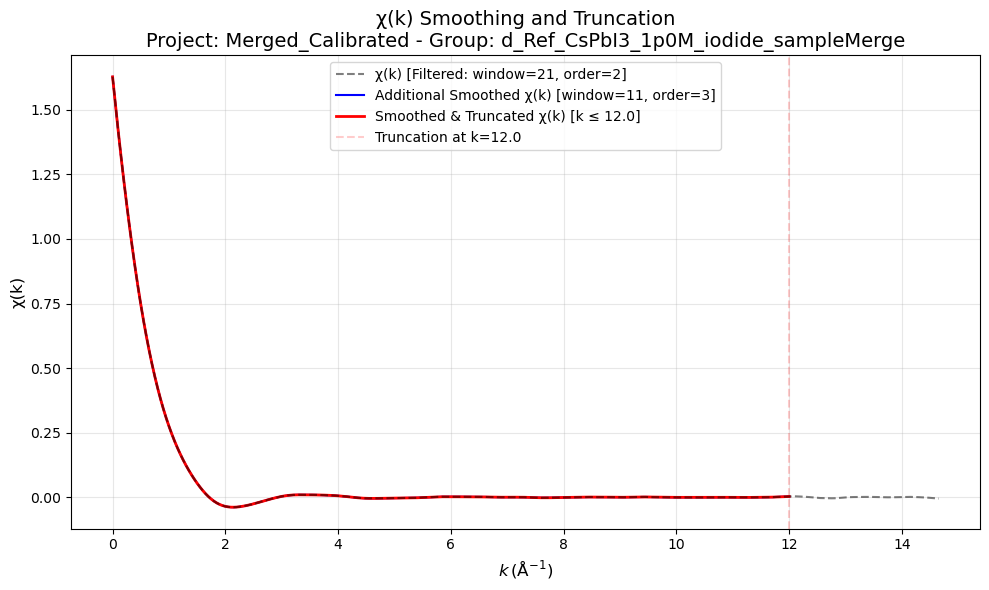

    Max change from smoothing: 0.000856
    Truncation removed 53 points where k > 12.0
  Processing group: CsPbI3_0p7M_iodide_sampleMerge


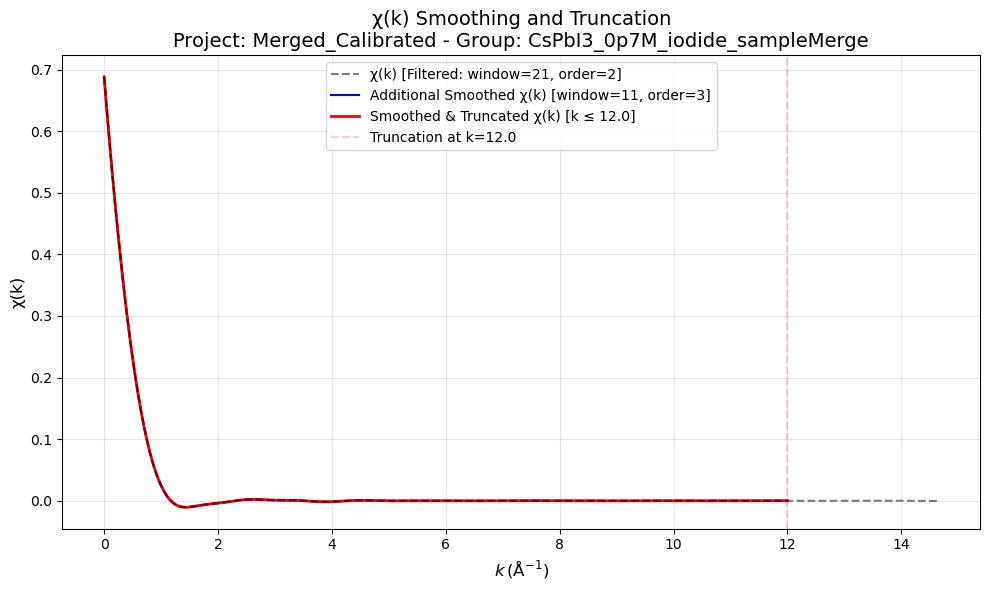

    Max change from smoothing: 0.000168
    Truncation removed 53 points where k > 12.0
  Processing group: d_Ref_CsPbI3_0p7M_iodide_sampleMerge


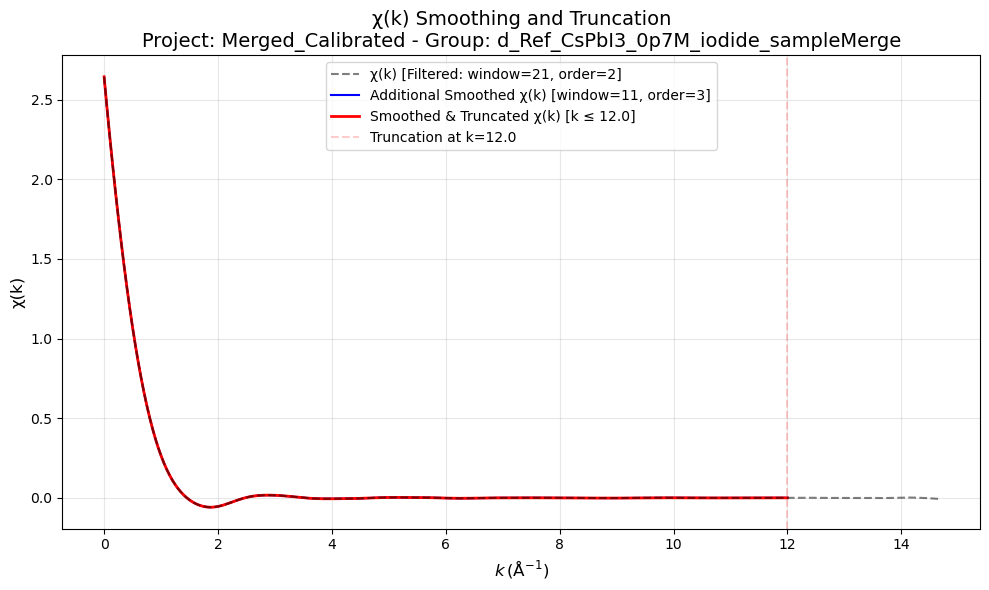

    Max change from smoothing: 0.000844
    Truncation removed 53 points where k > 12.0
  Processing group: CsPbI3_0p5M_iodide_sampleMerge


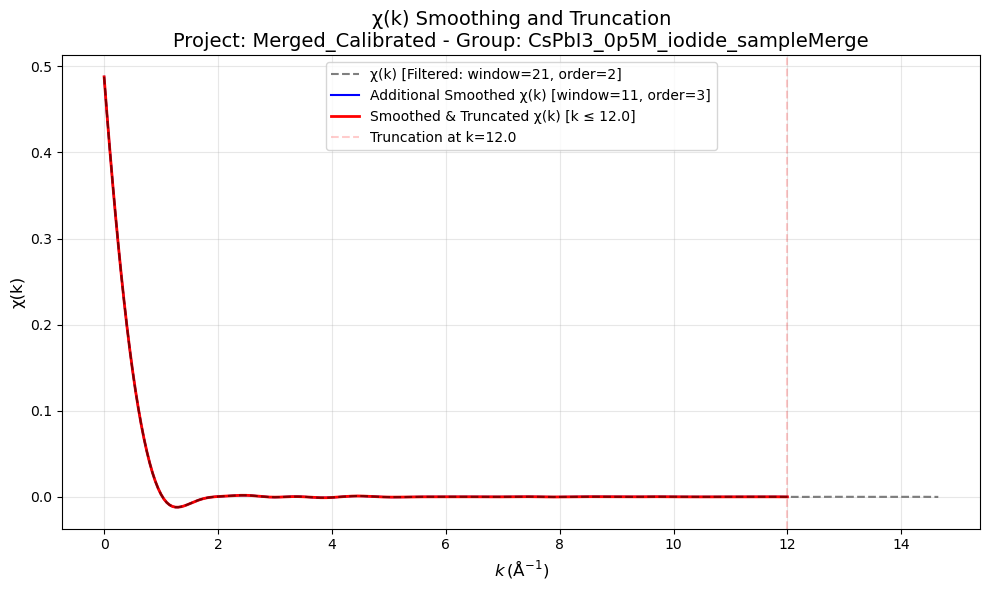

    Max change from smoothing: 0.000385
    Truncation removed 53 points where k > 12.0
  Processing group: d_Ref_CsPbI3_0p5M_iodide_sampleMerge


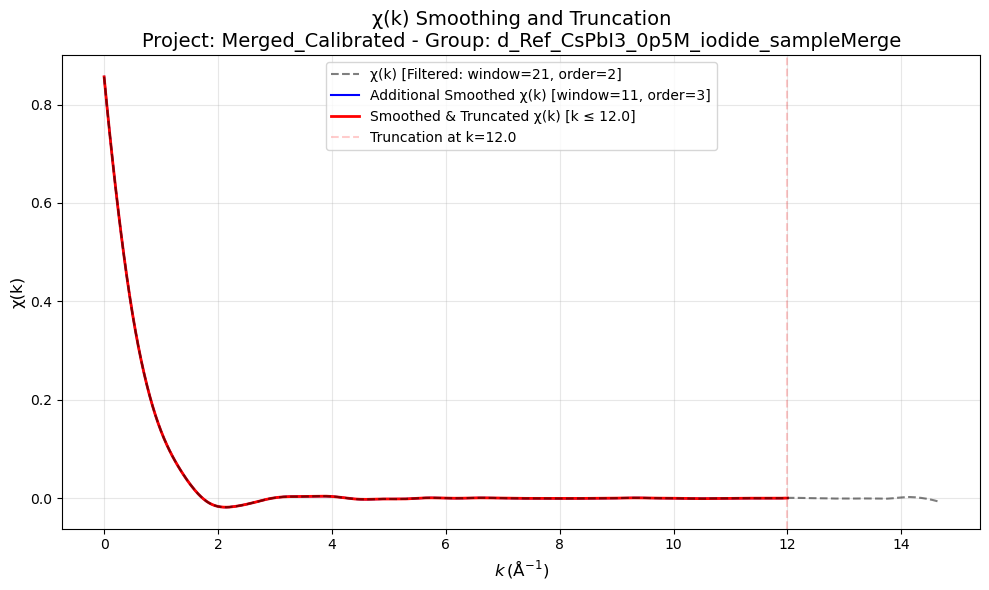

    Max change from smoothing: 0.000760
    Truncation removed 53 points where k > 12.0
  Processing group: CsPbI3_0p3M_iodide_sampleMerge


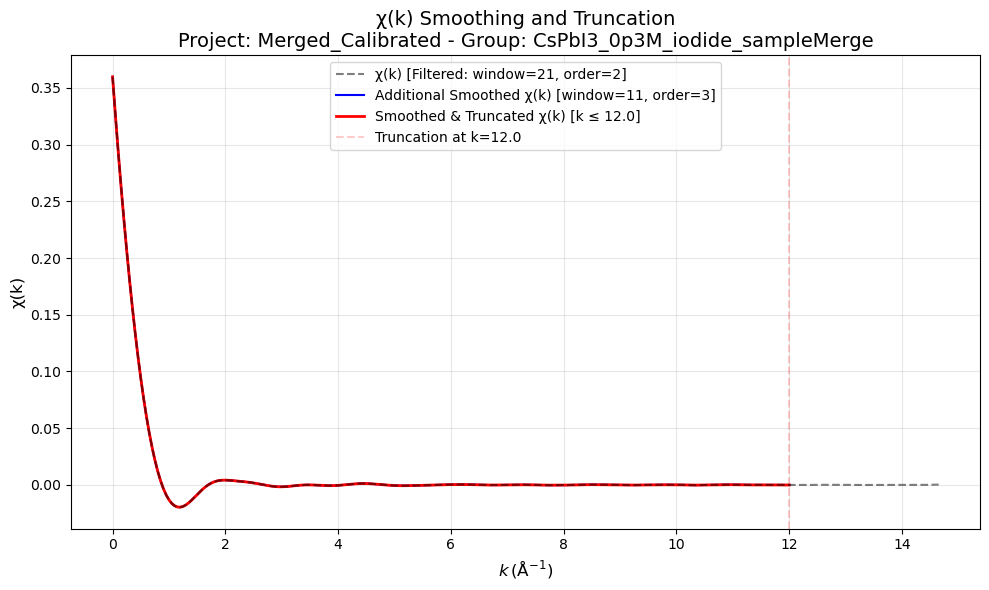

    Max change from smoothing: 0.000127
    Truncation removed 53 points where k > 12.0
  Processing group: d_Ref_CsPbI3_0p3M_iodide_sampleMerge


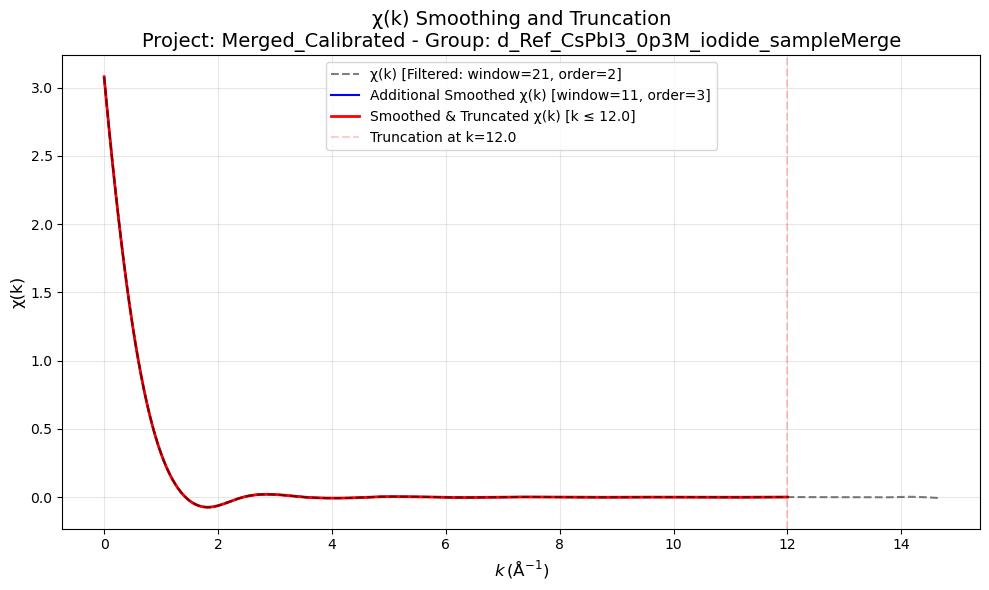

    Max change from smoothing: 0.001307
    Truncation removed 53 points where k > 12.0
  Processing group: CsPbI3_0p1M_iodide_sampleMerge


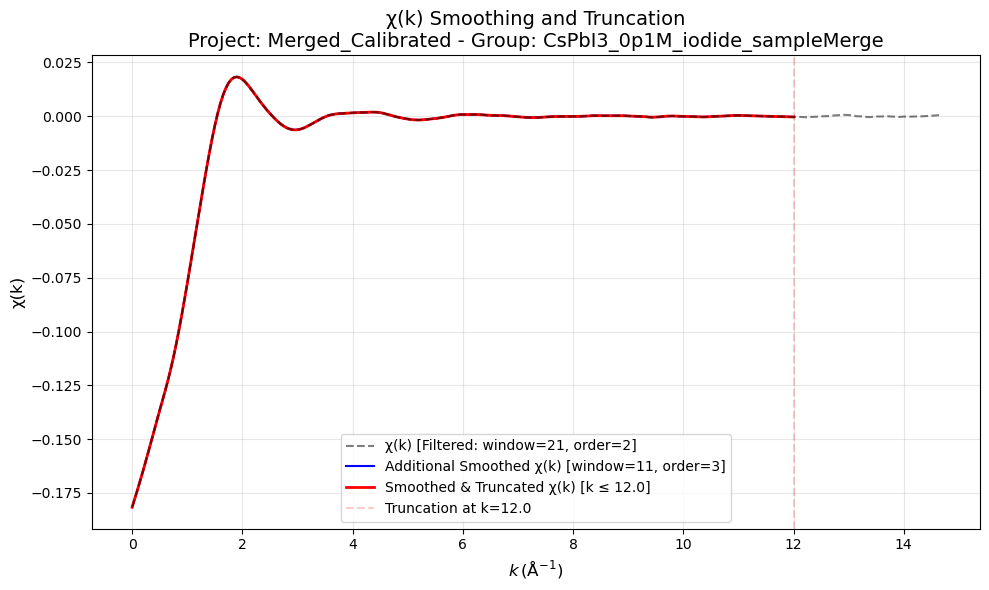

    Max change from smoothing: 0.000530
    Truncation removed 53 points where k > 12.0
  Processing group: d_Ref_CsPbI3_0p1M_iodide_sampleMerge


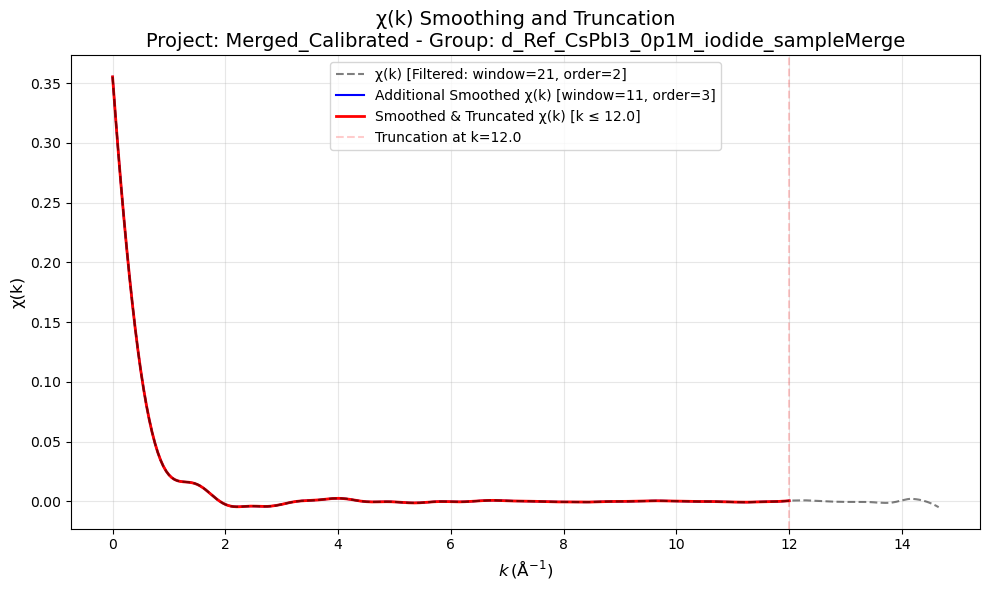

    Max change from smoothing: 0.000377
    Truncation removed 53 points where k > 12.0

Summary of processed groups:
  Merged_Calibrated - CsPbI3_1p29M_iodide_sampleMerge: Processed with smoothing and truncation (k <= 12)
  Merged_Calibrated - d_Ref_CsPbI3_1p29M_iodide_sampleMerge: Processed with smoothing and truncation (k <= 12)
  Merged_Calibrated - CsPbI3_1p0M_iodide_sampleMerge: Processed with smoothing and truncation (k <= 12)
  Merged_Calibrated - d_Ref_CsPbI3_1p0M_iodide_sampleMerge: Processed with smoothing and truncation (k <= 12)
  Merged_Calibrated - CsPbI3_0p7M_iodide_sampleMerge: Processed with smoothing and truncation (k <= 12)
  Merged_Calibrated - d_Ref_CsPbI3_0p7M_iodide_sampleMerge: Processed with smoothing and truncation (k <= 12)
  Merged_Calibrated - CsPbI3_0p5M_iodide_sampleMerge: Processed with smoothing and truncation (k <= 12)
  Merged_Calibrated - d_Ref_CsPbI3_0p5M_iodide_sampleMerge: Processed with smoothing and truncation (k <= 12)
  Merged_Calibrated - Cs

In [6]:
def visualize_kw(projects):
    """
    Visualize χ(k) for different k-weight values (1, 2, and 3) for each group.
    
    Parameters:
    -----------
    projects : dict
        Dictionary of projects loaded from batch_process_athena_projects()
    
    This function creates a figure with three side-by-side subplots for each spectrum,
    showing the k-weighted EXAFS data with k-weights of 1, 2, and 3 for comparison.
    """
    try:
        k_label = plab.k
    except NameError:
        k_label = "k"
    
    if not projects:
        print("No projects provided for k-weight visualization")
        return
        
    for proj_name, project in projects.items():
        print(f"\nProcessing Project: {proj_name}")
        for group_name, group in project.groups.items():
            if hasattr(group, 'k') and hasattr(group, 'chi'):
                fig, axs = plt.subplots(1, 3, figsize=(15, 5), sharey=False, sharex=True)
                for i, kweight in enumerate([1, 2, 3]):
                    axs[i].plot(group.k, group.chi * group.k**kweight, 
                                color=f'C{i}', linewidth=2)
                    axs[i].set_xlabel(k_label, fontsize=11)
                    axs[i].set_ylabel(f"$χ(k) \\cdot k^{kweight}$", fontsize=11)
                    axs[i].set_title(f"k-weight = {kweight}", fontsize=12)
                    axs[i].grid(True, linestyle='--', alpha=0.6)
                    if hasattr(group, 'k') and len(group.k) > 0:
                        axs[i].set_xlim(min(group.k), max(group.k))
                plt.suptitle(f"χ(k) with Different k-Weights: {proj_name} - {group_name}", 
                             fontsize=14, y=1.02)
                plt.tight_layout()
                plt.show()
            else:
                print(f"Skipping group {group_name} in {proj_name}: Missing 'k' or 'chi' attribute")
    
    return projects  # Return the projects for chaining


def smooth_and_taper_chi(projects, window_length=15, polyorder=2, taper_delta=1.0, k_truncation_max=12.0):
    """
    Apply additional smoothing and hard truncation to chi(k) data for all groups in all projects.
    
    Note: This function works with chi(k) that has already been filtered with Savitzky-Golay
    (window=21, polyorder=2) in background_optimizer. This function applies additional smoothing
    with different parameters (typically window=11-15, polyorder=3) for further noise reduction,
    then removes all points where k > k_truncation_max.
    
    Parameters:
    -----------
    projects : dict
        Dictionary of projects loaded from batch_process_athena_projects()
    window_length : int
        Window length for the additional Savitzky–Golay filter (must be odd, default: 15)
    polyorder : int
        Polynomial order for the additional filter (default: 2)
    taper_delta : float
        Retained for backward compatibility; no taper is applied
    k_truncation_max : float
        Maximum k value to keep in chi(k) (default: 12.0)
    
    For each group having attributes 'k' and 'chi', this function:
    - Applies additional smoothing to already-filtered chi(k) using a Savitzky–Golay filter
    - Truncates arrays to k <= k_truncation_max
    - Saves processed arrays (chi_smoothed and chi_tapered) to the group
    - Generates a diagnostic plot comparing original (already filtered), smoothed, and truncated χ(k)
    - Reports maximum changes due to smoothing and truncation
    
    Returns:
    --------
    dict
        The modified projects dictionary with smoothed and truncated data
    """
    import numpy as np
    import matplotlib.pyplot as plt
    from scipy.signal import savgol_filter
    
    if not projects:
        print("No projects provided for smoothing and truncation")
        return None

    # Define an inner helper function to smooth and then truncate a single (k, chi) array pair
    def _smooth_and_truncate_single(k, chi, window_length, polyorder, k_truncation_max):
        # Check if data length is sufficient for smoothing
        if len(chi) < window_length:
            print(f"Warning: Data length ({len(chi)}) is shorter than window length ({window_length}). Using original data.")
            chi_smoothed = chi.copy()
        else:
            chi_smoothed = savgol_filter(chi, window_length, polyorder)

        truncation_mask = k <= k_truncation_max
        if not np.any(truncation_mask):
            print(f"Warning: No data points found at or below k={k_truncation_max}. Returning empty arrays.")
            return np.array([]), np.array([]), np.array([]), truncation_mask

        k_truncated = k[truncation_mask]
        chi_smoothed_truncated = chi_smoothed[truncation_mask]
        chi_truncated = chi_smoothed_truncated.copy()
        return k_truncated, chi_smoothed_truncated, chi_truncated, truncation_mask

    # Process each project and group
    for proj_name, project in projects.items():
        print(f"\nProcessing chi(k) smoothing and truncation for Project: {proj_name}")
        
        # Find groups that have the required chi(k) data
        valid_groups = [name for name, grp in project.groups.items() 
                        if hasattr(grp, 'k') and hasattr(grp, 'chi')]
        print(f"Found {len(valid_groups)} groups with chi(k) data")
        
        for group_name, group in project.groups.items():
            if hasattr(group, 'k') and hasattr(group, 'chi'):
                print(f"  Processing group: {group_name}")
                k_original = group.k
                chi_original = group.chi
                
                try:
                    k_truncated, chi_smoothed, chi_tapered, truncation_mask = _smooth_and_truncate_single(
                        k_original, chi_original, window_length, polyorder, k_truncation_max)

                    if len(k_truncated) == 0:
                        print(f"    Skipping {group_name}: no data remaining after truncation")
                        continue

                    chi_original_truncated = chi_original[truncation_mask]

                    # Store the processed data and parameters in the group
                    group.k = k_truncated
                    group.chi = chi_original_truncated
                    group.chi_smoothed = chi_smoothed
                    group.chi_tapered = chi_tapered
                    group.taper_parameters = {
                        'window_length': window_length,
                        'polyorder': polyorder,
                        'taper_delta': taper_delta,
                        'k_truncation_max': k_truncation_max,
                        'mode': 'hard_truncation'
                    }
                    
                    # Plot the original (already filtered), smoothed, and truncated chi(k)
                    fig, ax = plt.subplots(figsize=(10, 6))
                    ax.plot(k_original, chi_original, label="χ(k) [Filtered: window=21, order=2]", alpha=0.5, color='black', linestyle='--', zorder=3)
                    ax.plot(k_truncated, chi_smoothed, label=f"Additional Smoothed χ(k) [window={window_length}, order={polyorder}]", color='blue', linestyle='-', linewidth=1.5)
                    ax.plot(k_truncated, chi_tapered, label=f"Smoothed & Truncated χ(k) [k ≤ {k_truncation_max}]", color='red', linestyle='-', linewidth=2)
                    ax.axvline(k_truncation_max, alpha=0.2, color='red', linestyle='--', label=f"Truncation at k={k_truncation_max}")
                    
                    # Use plab.k for a nice label if available; otherwise, default to "k"
                    try:
                        k_label = plab.k
                    except NameError:
                        k_label = "k"
                    
                    ax.set_xlabel(k_label, fontsize=12)
                    ax.set_ylabel("χ(k)", fontsize=12)
                    ax.set_title(f"χ(k) Smoothing and Truncation\nProject: {proj_name} - Group: {group_name}", fontsize=14)
                    ax.grid(True, alpha=0.3)
                    ax.legend(loc='best')
                    plt.tight_layout()
                    plt.show()
                    
                    # Print out diagnostic information
                    chi_max_diff = np.max(np.abs(chi_original_truncated - chi_smoothed))
                    removed_points = int(np.count_nonzero(~truncation_mask))
                    print(f"    Max change from smoothing: {chi_max_diff:.6f}")
                    print(f"    Truncation removed {removed_points} points where k > {k_truncation_max}")
                except Exception as e:
                    print(f"    Error processing {group_name}: {str(e)}")
            else:
                print(f"  Skipping group {group_name}: Missing 'k' or 'chi' attribute")
                
    return projects  # Return the modified projects

# Visualize k-weighted EXAFS data
projects = visualize_kw(projects)

# Apply smoothing and hard truncation to the EXAFS data 
projects = smooth_and_taper_chi(projects, window_length=11, polyorder=3, taper_delta=1.0, k_truncation_max=12.0)

# Check results
if projects:
    print("\nSummary of processed groups:")
    for proj_name, project in projects.items():
        for group_name, group in project.groups.items():
            if hasattr(group, 'chi_tapered'):
                print(f"  {proj_name} - {group_name}: Processed with smoothing and truncation (k <= 12)")


Comparing chi(k) processing for Project: Merged_Calibrated
Found 12 processed groups


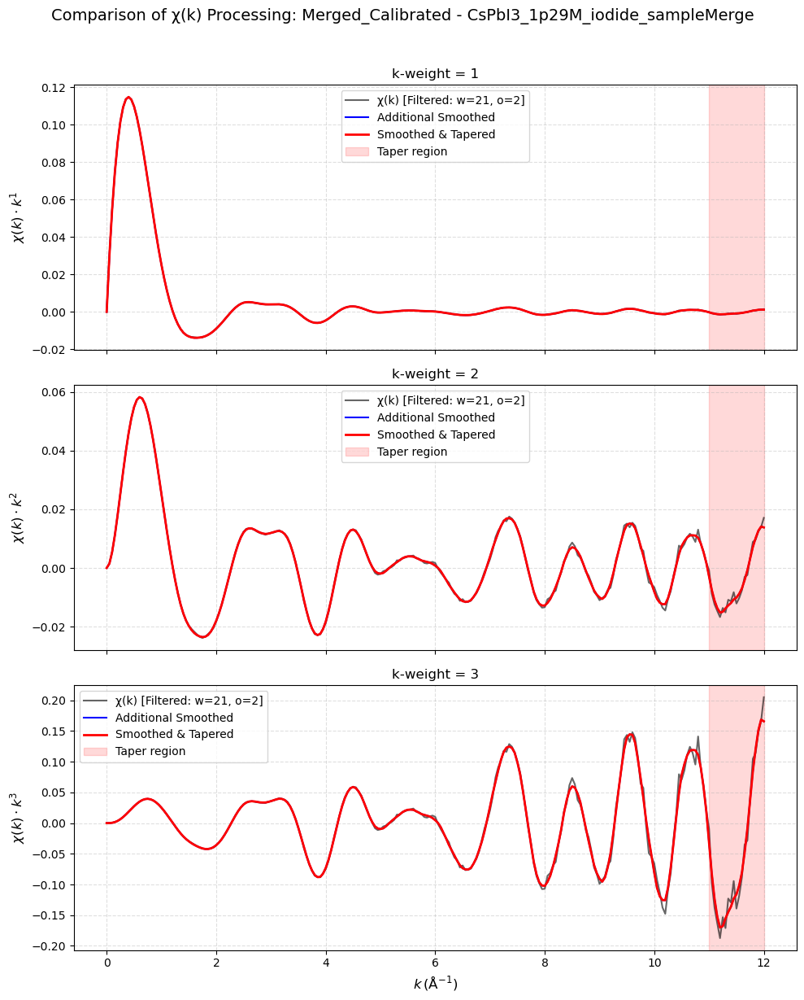

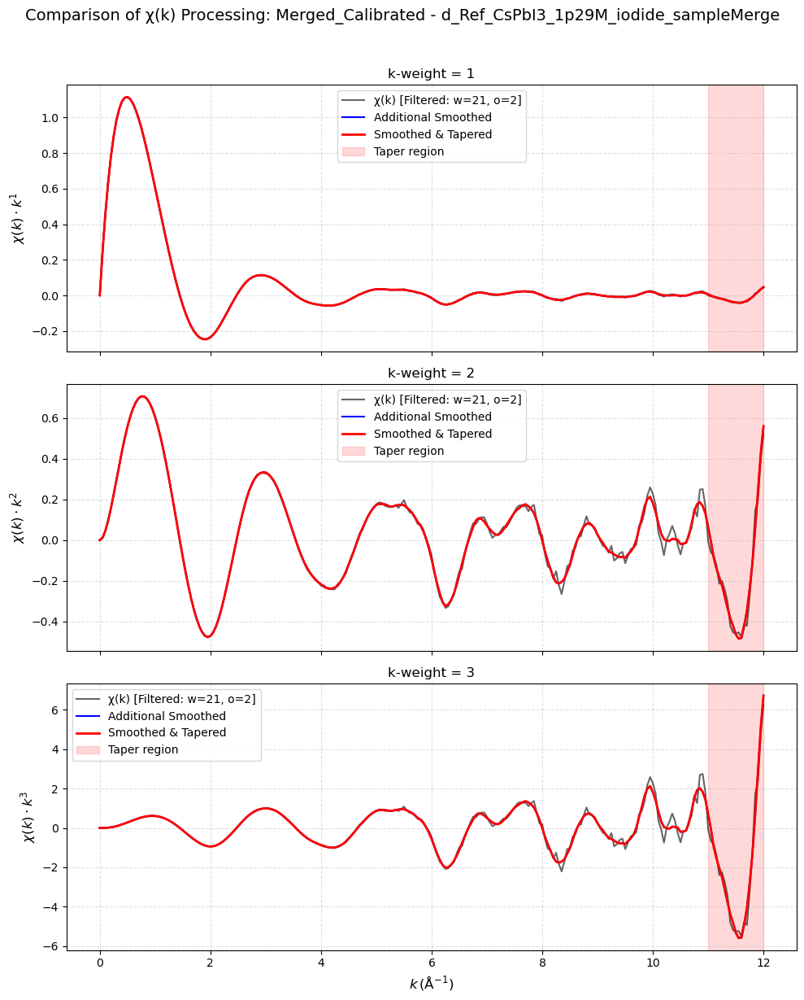

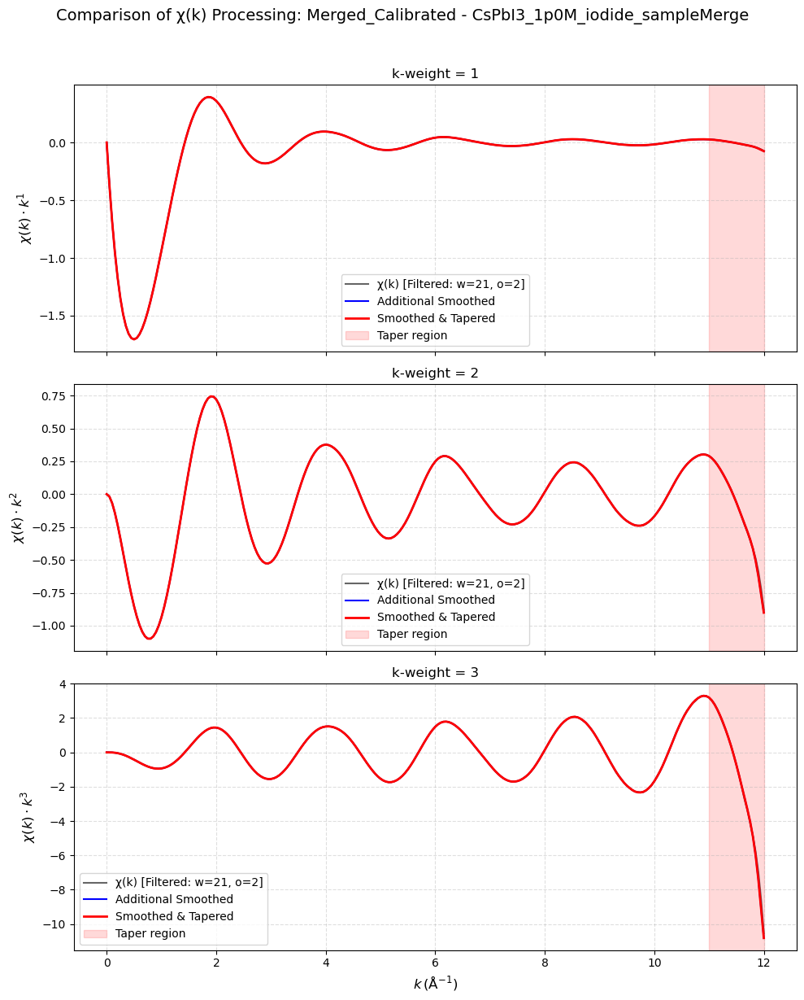

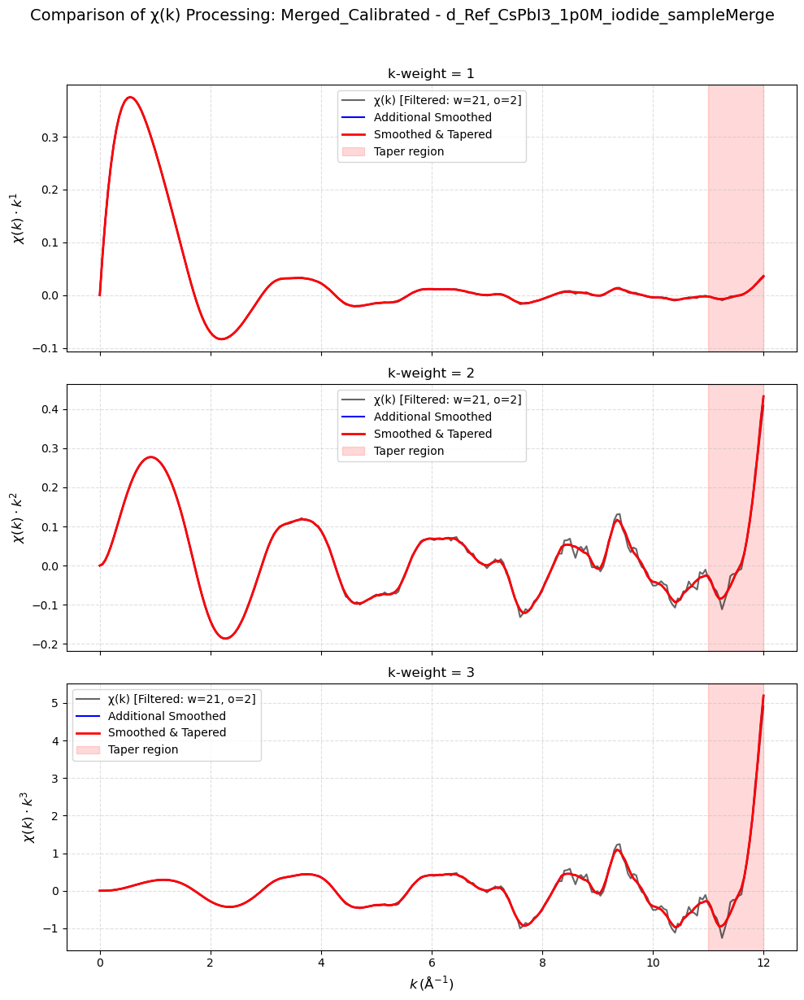

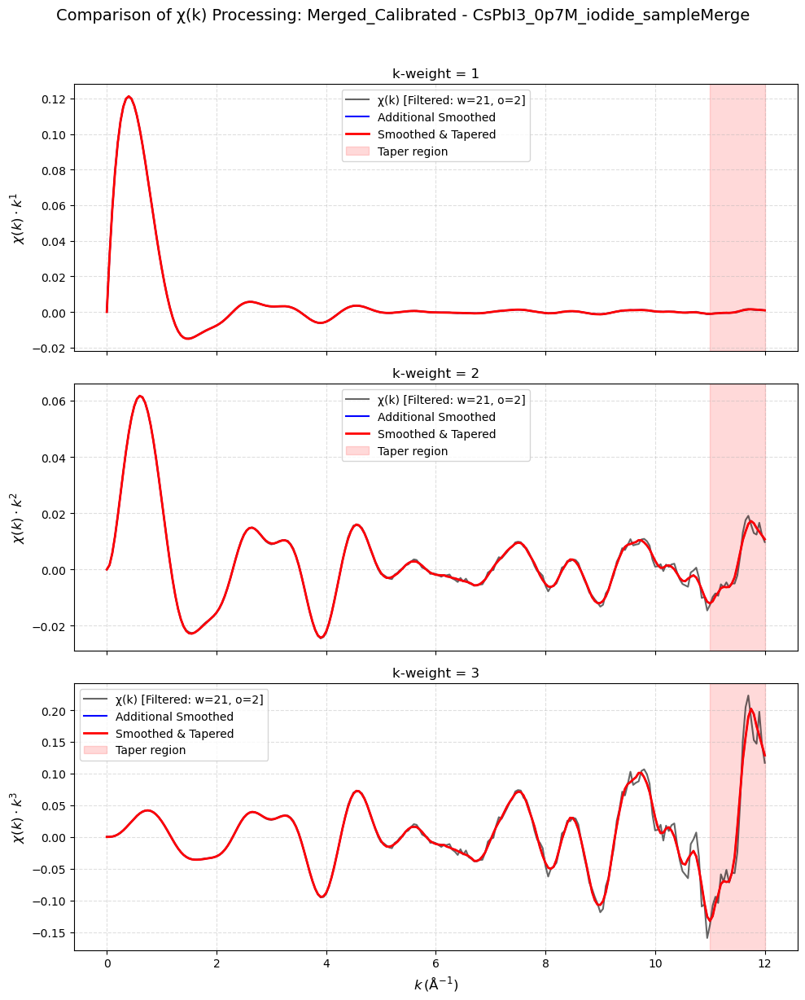

...

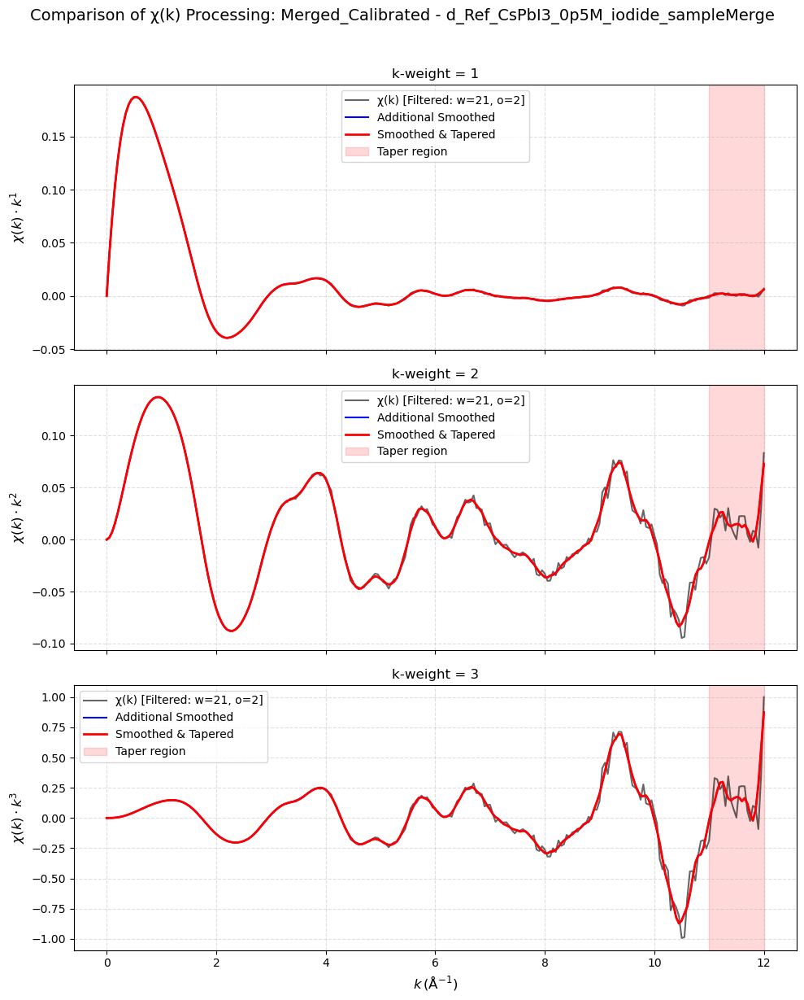

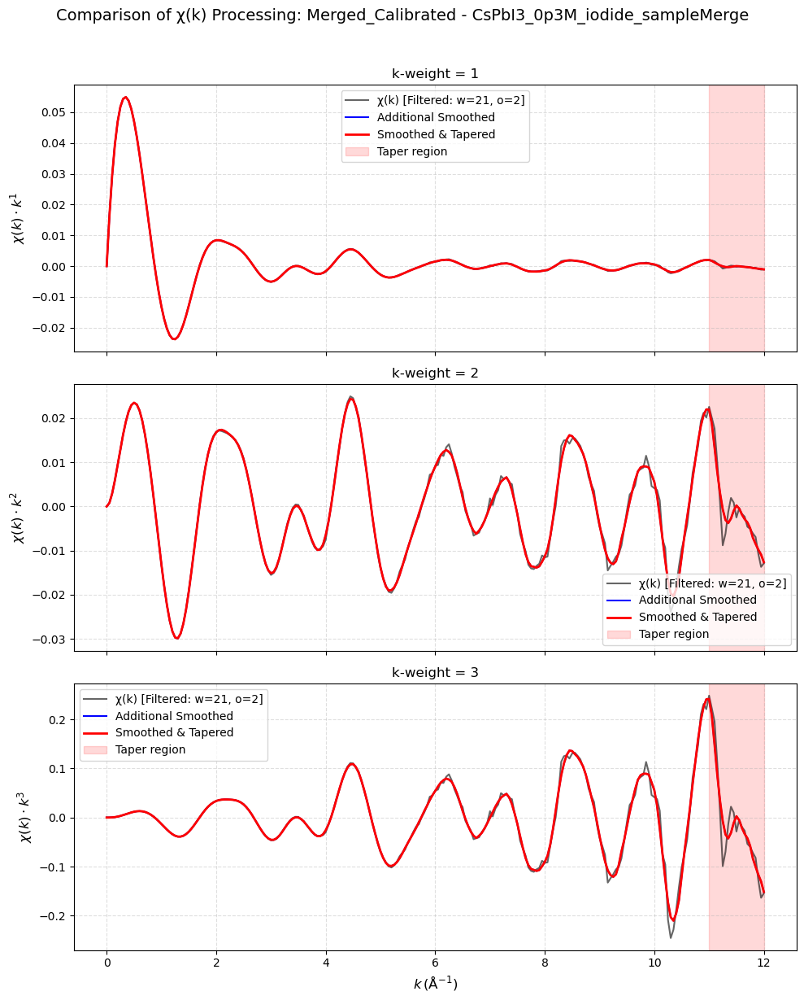

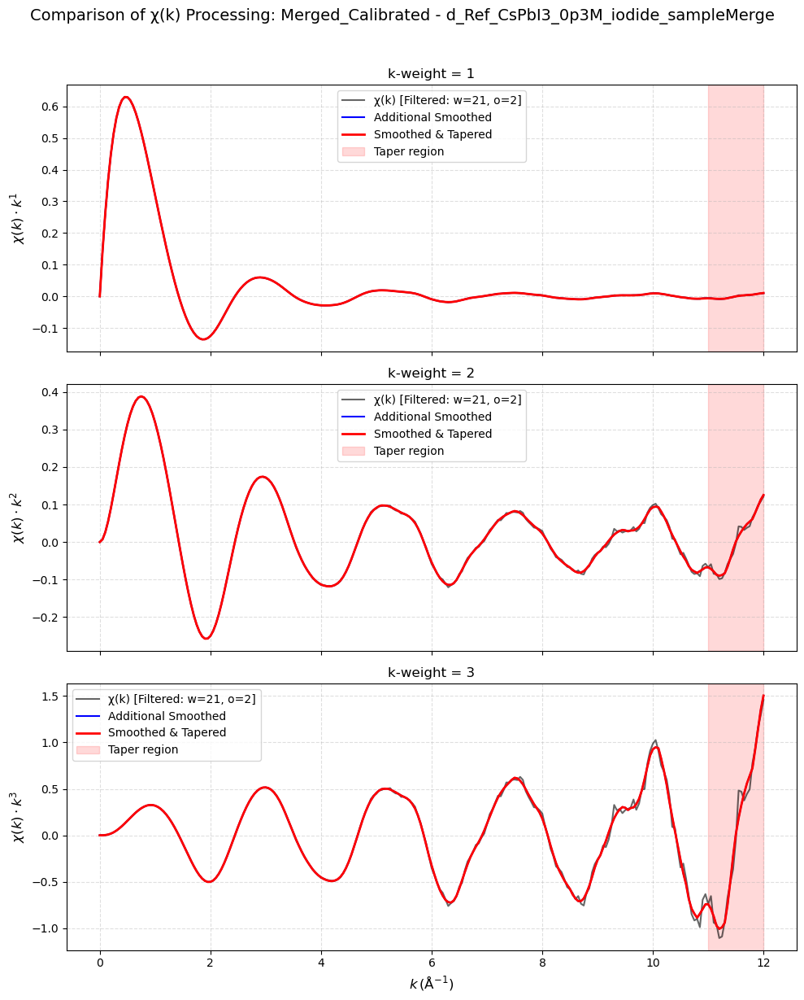

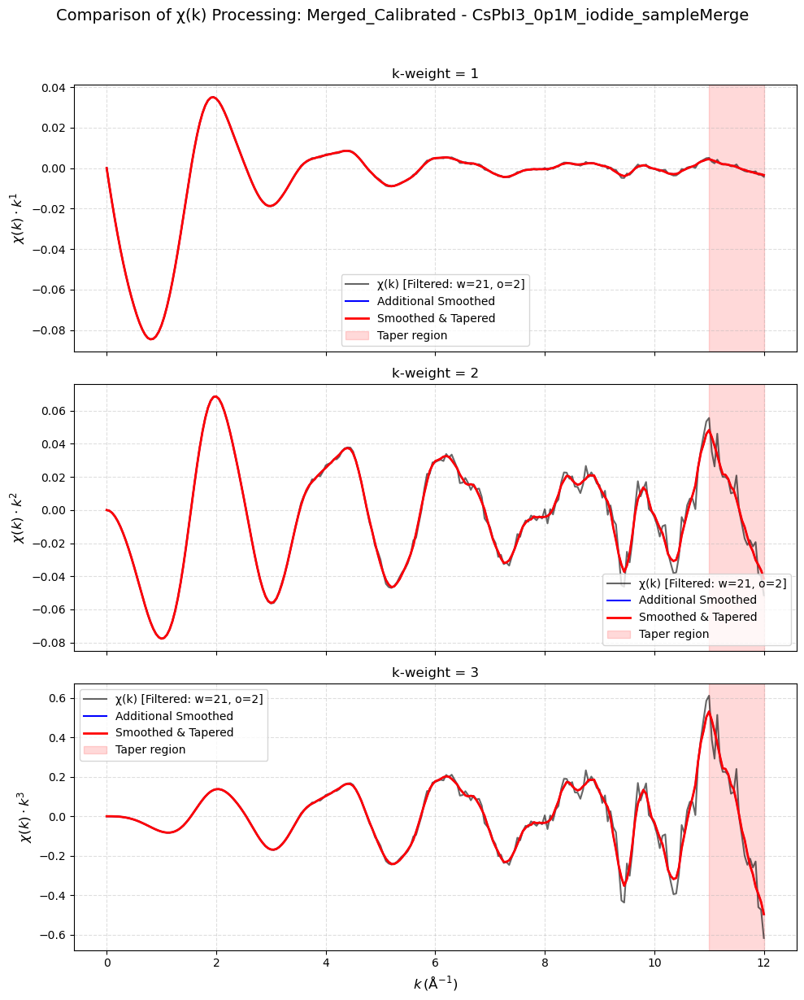

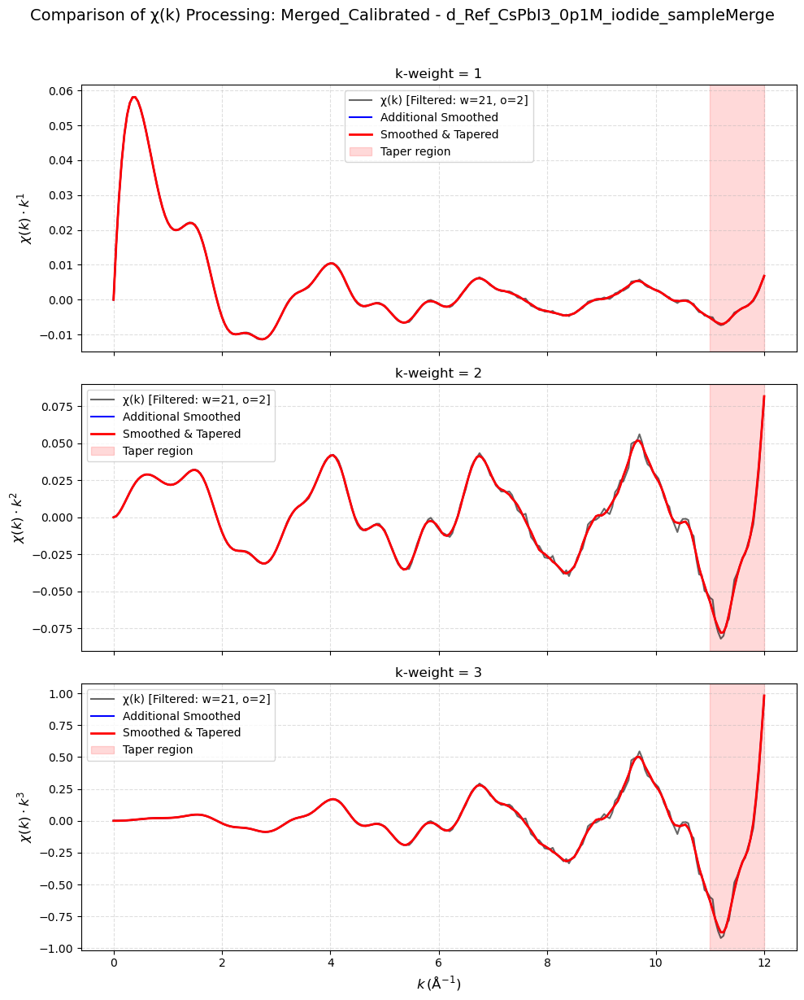

In [7]:
def compare_chi_processing(projects, k_weights=[1, 2, 3]):
    """
    Create overlay plots comparing original and processed chi(k) data for different k weightings.
    
    Parameters:
    -----------
    projects : dict
        Dictionary of projects loaded and processed with background_optimizer and smooth_and_taper_chi
    k_weights : list
        List of k-weight values to use for plotting (default: [1, 2, 3])
    
    This function creates plots that overlay:
    - Original chi(k) × k^weight (already filtered with window=21, order=2 from background_optimizer)
    - Additional smoothed chi(k) × k^weight (from smooth_and_taper_chi)
    - Tapered & smoothed chi(k) × k^weight
    for visual comparison of the effects of processing.
    
    Returns:
    --------
    dict
        The projects dictionary (for chaining)
    """
    try:
        k_label = plab.k
    except NameError:
        k_label = "k"
    
    if not projects:
        print("No projects provided for comparison")
        return projects
    
    # Loop through all projects and groups
    for proj_name, project in projects.items():
        print(f"\nComparing chi(k) processing for Project: {proj_name}")
        
        # Check which groups have all required data
        processed_groups = [name for name, grp in project.groups.items() 
                            if hasattr(grp, 'k') and hasattr(grp, 'chi') 
                            and hasattr(grp, 'chi_smoothed') and hasattr(grp, 'chi_tapered')]
        
        if not processed_groups:
            print(f"No processed groups found in project {proj_name}")
            continue
            
        print(f"Found {len(processed_groups)} processed groups")
        
        # For each group with processed data, create comparison plots
        for group_name, group in project.groups.items():
            if (hasattr(group, 'k') and hasattr(group, 'chi') 
                and hasattr(group, 'chi_smoothed') and hasattr(group, 'chi_tapered')):
                
                # Create a figure with subplots for each k-weight
                fig, axs = plt.subplots(len(k_weights), 1, figsize=(10, 4*len(k_weights)), sharex=True)
                if len(k_weights) == 1:
                    axs = [axs]  # Ensure axs is always a list
                
                # Plot each k-weight in its own subplot
                for i, kw in enumerate(k_weights):
                    # Get the k-weighted data
                    chi_orig_kw = group.chi * group.k**kw
                    chi_smooth_kw = group.chi_smoothed * group.k**kw
                    chi_taper_kw = group.chi_tapered * group.k**kw
                    
                    # Plot the original (already filtered), smoothed, and tapered data
                    axs[i].plot(group.k, chi_orig_kw, label="χ(k) [Filtered: w=21, o=2]", 
                               color='black', linestyle='-', alpha=0.6, linewidth=1.5)
                    axs[i].plot(group.k, chi_smooth_kw, label="Additional Smoothed", 
                               color='blue', linestyle='-', linewidth=1.5)
                    axs[i].plot(group.k, chi_taper_kw, label="Smoothed & Tapered", 
                               color='red', linestyle='-', linewidth=2)
                    
                    # Add a shaded region for the taper area if taper parameters exist
                    if hasattr(group, 'taper_parameters') and 'taper_delta' in group.taper_parameters:
                        taper_delta = group.taper_parameters['taper_delta']
                        kmax = np.max(group.k)
                        taper_start = kmax - taper_delta
                        axs[i].axvspan(taper_start, kmax, alpha=0.15, color='red', label="Taper region")
                    
                    # Set labels and grid
                    axs[i].set_ylabel(f"$χ(k) \\cdot k^{kw}$", fontsize=12)
                    axs[i].set_title(f"k-weight = {kw}", fontsize=12)
                    axs[i].grid(True, linestyle='--', alpha=0.4)
                    
                    # Add legend to each subplot
                    axs[i].legend(loc='best', fontsize=10)
                
                # Set common labels
                axs[-1].set_xlabel(k_label, fontsize=12)
                
                # Set the global title
                plt.suptitle(f"Comparison of χ(k) Processing: {proj_name} - {group_name}", 
                             fontsize=14, y=1.02)
                plt.tight_layout()
                plt.show()
            else:
                # Check which data is missing
                missing = []
                for attr in ['k', 'chi', 'chi_smoothed', 'chi_tapered']:
                    if not hasattr(group, attr):
                        missing.append(attr)
                
                if missing:
                    print(f"  Skipping group {group_name}: Missing attributes: {', '.join(missing)}")
    
    return projects  # Return projects for chaining

projects = compare_chi_processing(projects)

FT export enabled. Saving files to: C:\Users\Keenan Wyatt\OneDrive - UCB-O365\GitHub_Repos\xraylarch\ft_outputs

Processing FT for Project 'Merged_Calibrated', Group 'CsPbI3_1p29M_iodide_sampleMerge'
  Using rbkg = 1.29 Å

  Analyzing with k-weight 2:
  Found 17 zero crossings
  All zero crossings: [ 0.    1.2   2.25  3.45  4.2   4.85  5.15  6.05  6.9   7.65  8.3   8.7
  9.25  9.85 10.35 10.95 11.7 ]
  Selected kmin candidates: [2.25]
  Selected kmax candidates: [6.05 6.9  7.65 8.3  8.7  9.25 9.85]


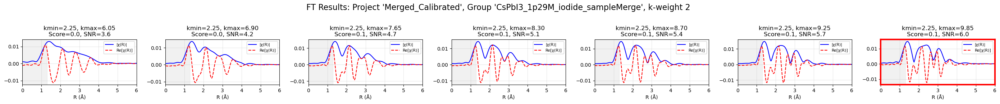

  Saved FT data: kspace_kw2_Merged_Calibrated_CsPbI3_1p29M_iodide_sampleMerge.csv, rspace_kw2_Merged_Calibrated_CsPbI3_1p29M_iodide_sampleMerge.csv
  Best parameters (k-weight 2):
    kmin = 2.250
    kmax = 9.850
    SNR = 6.0
    Quality Score = 0.07525441182687943


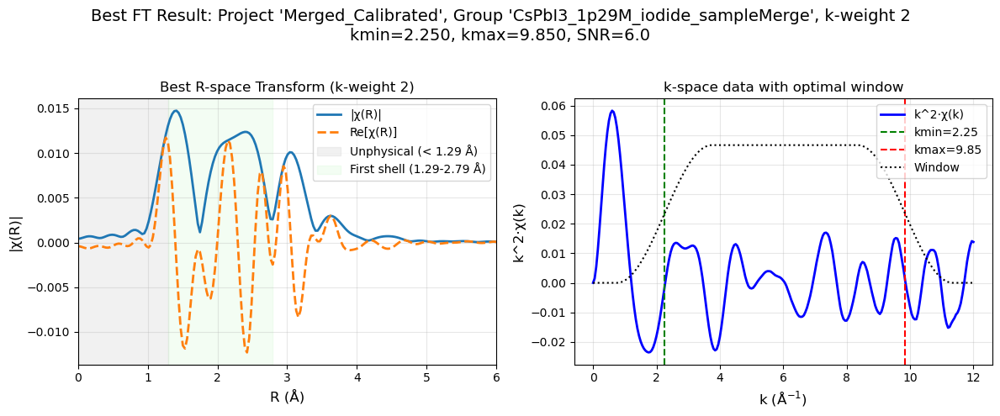


Processing FT for Project 'Merged_Calibrated', Group 'd_Ref_CsPbI3_1p29M_iodide_sampleMerge'
  Using rbkg = 1.29 Å

  Analyzing with k-weight 2:
  Found 17 zero crossings
  All zero crossings: [ 0.    1.4   2.45  3.5   4.65  5.9   6.65  7.95  8.6   9.05  9.65 10.2
 10.3  10.45 10.6  11.   11.8 ]
  Selected kmin candidates: [2.45]
  Selected kmax candidates: [ 6.65  7.95  8.6   9.05  9.65 10.2  10.3 ]


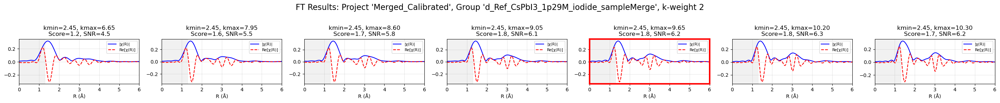

  Saved FT data: kspace_kw2_Merged_Calibrated_d_Ref_CsPbI3_1p29M_iodide_sampleMerge.csv, rspace_kw2_Merged_Calibrated_d_Ref_CsPbI3_1p29M_iodide_sampleMerge.csv
  Best parameters (k-weight 2):
    kmin = 2.450
    kmax = 9.650
    SNR = 6.2
    Quality Score = 1.7891297381041003


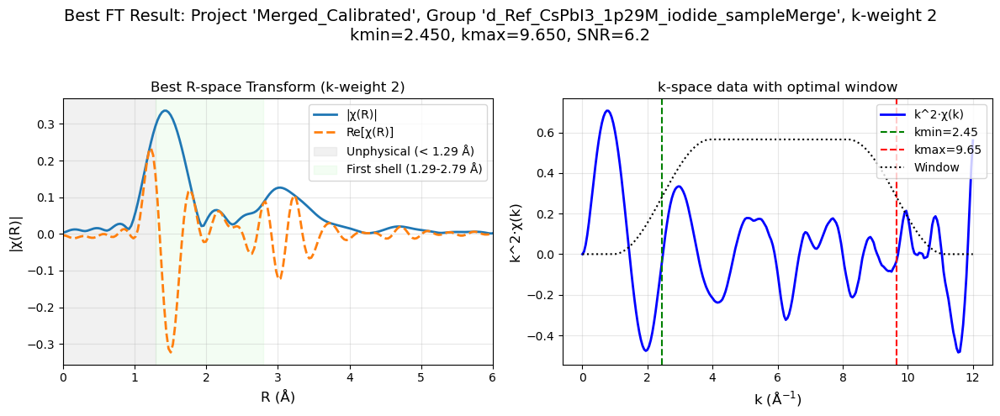


Processing FT for Project 'Merged_Calibrated', Group 'CsPbI3_1p0M_iodide_sampleMerge'
  Using rbkg = 1.32 Å

  Analyzing with k-weight 2:
  Found 11 zero crossings
  All zero crossings: [ 0.    1.4   2.4   3.45  4.6   5.65  6.8   7.95  9.05 10.25 11.4 ]
  Selected kmin candidates: [2.4]
  Selected kmax candidates: [ 6.8   7.95  9.05 10.25 11.4 ]


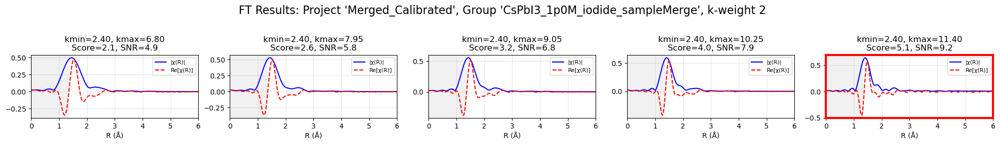

  Saved FT data: kspace_kw2_Merged_Calibrated_CsPbI3_1p0M_iodide_sampleMerge.csv, rspace_kw2_Merged_Calibrated_CsPbI3_1p0M_iodide_sampleMerge.csv
  Best parameters (k-weight 2):
    kmin = 2.400
    kmax = 11.400
    SNR = 9.2
    Quality Score = 5.060985601011523


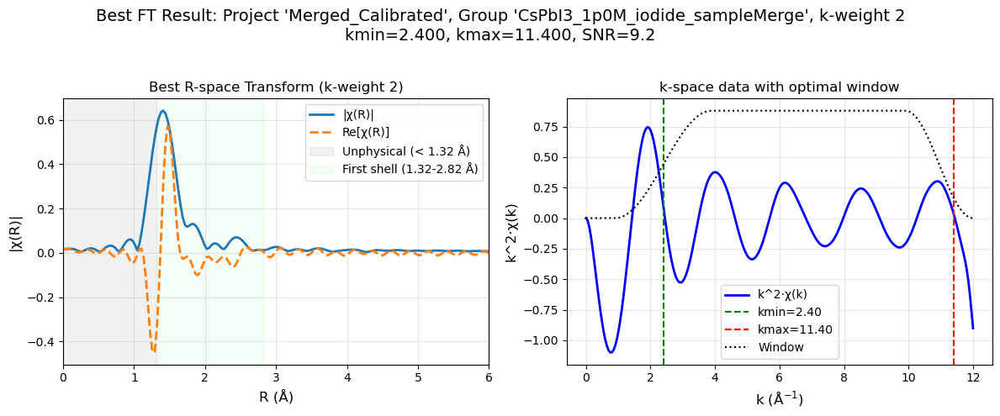


Processing FT for Project 'Merged_Calibrated', Group 'd_Ref_CsPbI3_1p0M_iodide_sampleMerge'
  Using rbkg = 1.08 Å

  Analyzing with k-weight 2:
  Found 11 zero crossings
  All zero crossings: [ 0.    1.7   2.9   4.25  5.55  7.25  8.15  8.9   9.05  9.8  11.55]
  Selected kmin candidates: [1.7 2.9]
  Selected kmax candidates: [ 7.25  8.15  8.9   9.05  9.8  11.55]


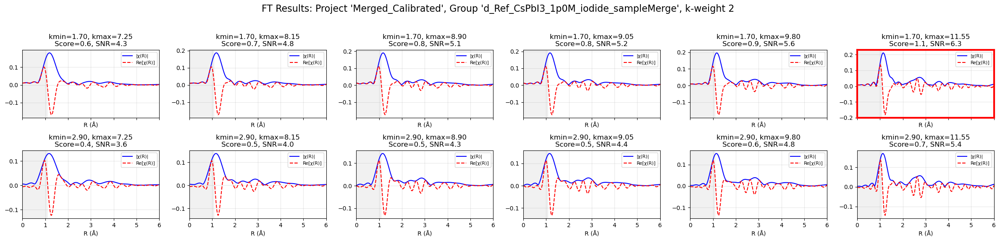

  Saved FT data: kspace_kw2_Merged_Calibrated_d_Ref_CsPbI3_1p0M_iodide_sampleMerge.csv, rspace_kw2_Merged_Calibrated_d_Ref_CsPbI3_1p0M_iodide_sampleMerge.csv
  Best parameters (k-weight 2):
    kmin = 1.700
    kmax = 11.550
    SNR = 6.3
    Quality Score = 1.0933214006599892


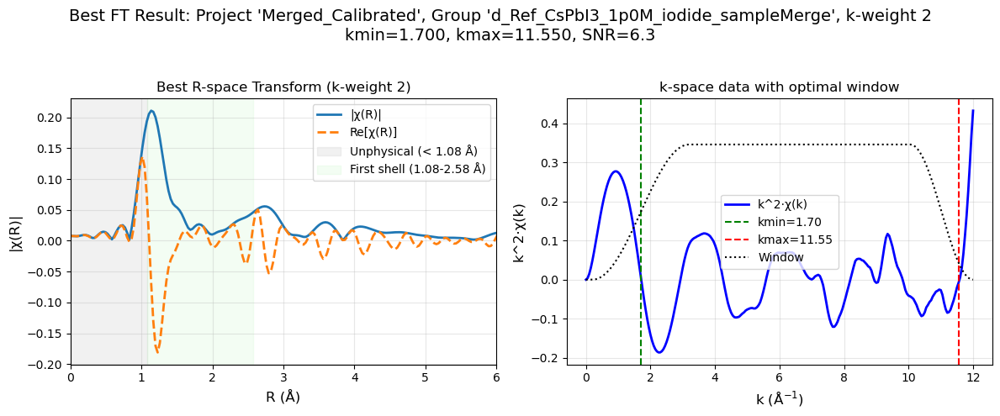


Processing FT for Project 'Merged_Calibrated', Group 'CsPbI3_0p7M_iodide_sampleMerge'
  Using rbkg = 1.29 Å

  Analyzing with k-weight 2:
  Found 15 zero crossings
  All zero crossings: [ 0.    1.15  2.25  3.5   4.25  4.95  5.35  5.8   7.    7.85  8.3   8.6
  9.25 10.35 11.45]
  Selected kmin candidates: [2.25]
  Selected kmax candidates: [ 7.    7.85  8.3   8.6   9.25 10.35 11.45]


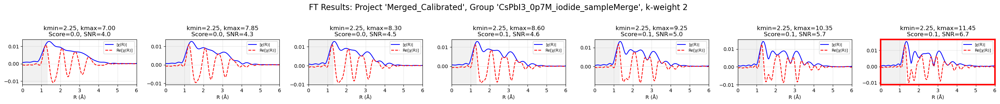

  Saved FT data: kspace_kw2_Merged_Calibrated_CsPbI3_0p7M_iodide_sampleMerge.csv, rspace_kw2_Merged_Calibrated_CsPbI3_0p7M_iodide_sampleMerge.csv
  Best parameters (k-weight 2):
    kmin = 2.250
    kmax = 11.450
    SNR = 6.7
    Quality Score = 0.08812471302557703


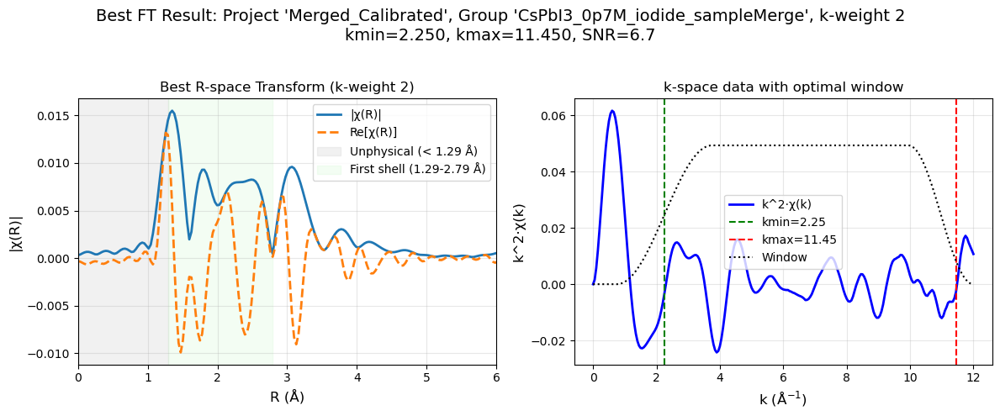


Processing FT for Project 'Merged_Calibrated', Group 'd_Ref_CsPbI3_0p7M_iodide_sampleMerge'
  Using rbkg = 1.29 Å

  Analyzing with k-weight 2:
  Found 11 zero crossings
  All zero crossings: [ 0.    1.45  2.45  3.5   4.7   5.85  6.8   8.35  9.3  10.25 11.7 ]
  Selected kmin candidates: [2.45]
  Selected kmax candidates: [ 6.8   8.35  9.3  10.25 11.7 ]


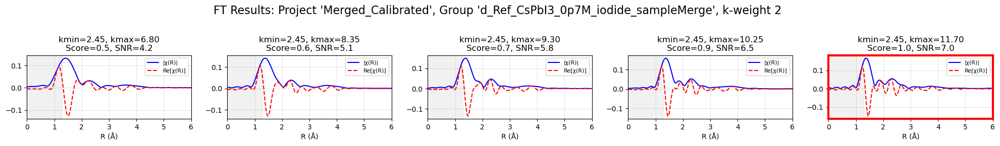

  Saved FT data: kspace_kw2_Merged_Calibrated_d_Ref_CsPbI3_0p7M_iodide_sampleMerge.csv, rspace_kw2_Merged_Calibrated_d_Ref_CsPbI3_0p7M_iodide_sampleMerge.csv
  Best parameters (k-weight 2):
    kmin = 2.450
    kmax = 11.700
    SNR = 7.0
    Quality Score = 1.0010639033761115


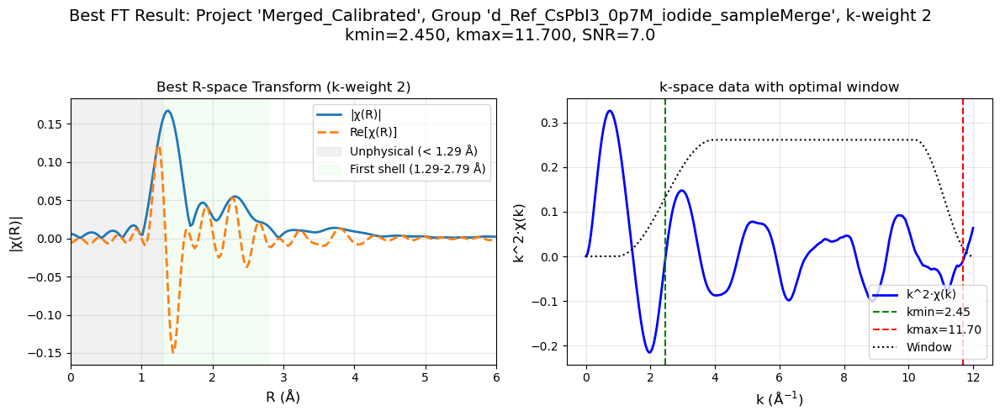


Processing FT for Project 'Merged_Calibrated', Group 'CsPbI3_0p5M_iodide_sampleMerge'
  Using rbkg = 1.29 Å

  Analyzing with k-weight 2:
  Found 18 zero crossings
  All zero crossings: [ 0.    1.    1.9   2.8   3.15  3.5   4.15  4.8   5.75  6.5   7.    7.6
  8.2   8.85  9.4  10.05 10.8  11.8 ]
  Selected kmin candidates: [1.9 2.8]
  Selected kmax candidates: [ 6.5   7.    7.6   8.2   8.85  9.4  10.05]


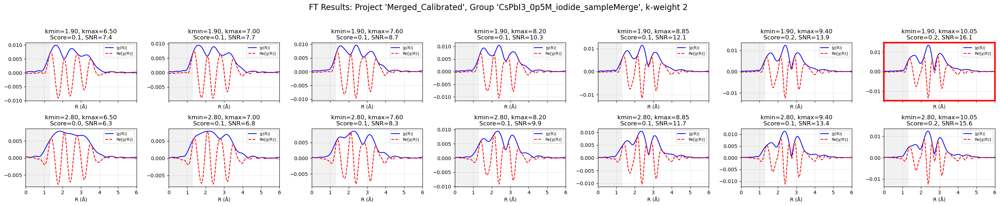

  Saved FT data: kspace_kw2_Merged_Calibrated_CsPbI3_0p5M_iodide_sampleMerge.csv, rspace_kw2_Merged_Calibrated_CsPbI3_0p5M_iodide_sampleMerge.csv
  Best parameters (k-weight 2):
    kmin = 1.900
    kmax = 10.050
    SNR = 16.1
    Quality Score = 0.21446916822584916


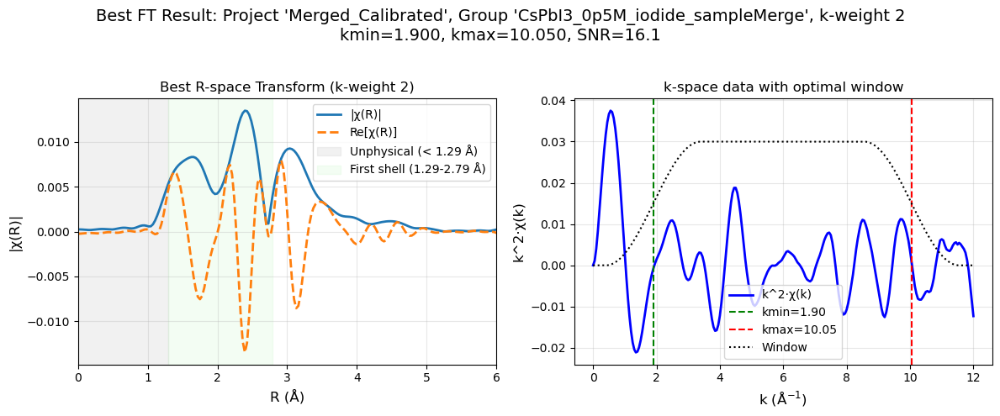


Processing FT for Project 'Merged_Calibrated', Group 'd_Ref_CsPbI3_0p5M_iodide_sampleMerge'
  Using rbkg = 1.08 Å

  Analyzing with k-weight 2:
  Found 11 zero crossings
  All zero crossings: [ 0.    1.7   2.9   4.25  5.5   7.1   8.8   9.95 11.   11.75 11.8 ]
  Selected kmin candidates: [1.7 2.9]
  Selected kmax candidates: [ 7.1   8.8   9.95 11.   11.75 11.8 ]


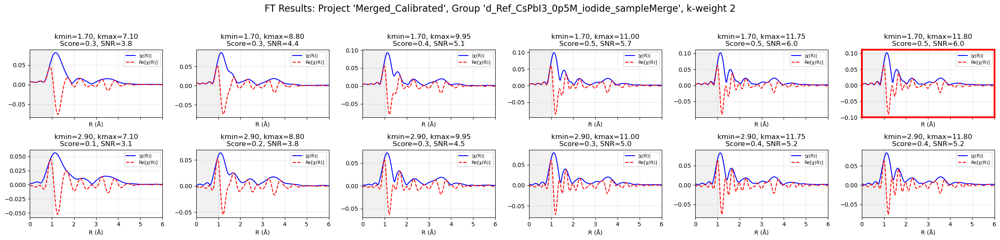

  Saved FT data: kspace_kw2_Merged_Calibrated_d_Ref_CsPbI3_0p5M_iodide_sampleMerge.csv, rspace_kw2_Merged_Calibrated_d_Ref_CsPbI3_0p5M_iodide_sampleMerge.csv
  Best parameters (k-weight 2):
    kmin = 1.700
    kmax = 11.800
    SNR = 6.0
    Quality Score = 0.5029290873441207


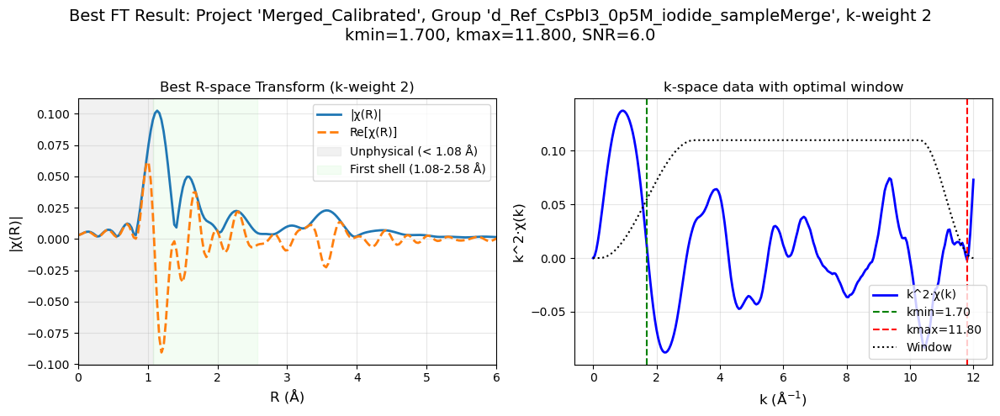


Processing FT for Project 'Merged_Calibrated', Group 'CsPbI3_0p3M_iodide_sampleMerge'
  Using rbkg = 1.29 Å

  Analyzing with k-weight 2:
  Found 20 zero crossings
  All zero crossings: [ 0.    0.85  1.65  2.65  3.4   3.5   4.05  4.8   5.7   6.5   7.    7.45
  8.15  8.9   9.5  10.05 10.6  11.2  11.45 11.5 ]
  Selected kmin candidates: [1.65 2.65]
  Selected kmax candidates: [ 6.5   7.    7.45  8.15  8.9   9.5  10.05]


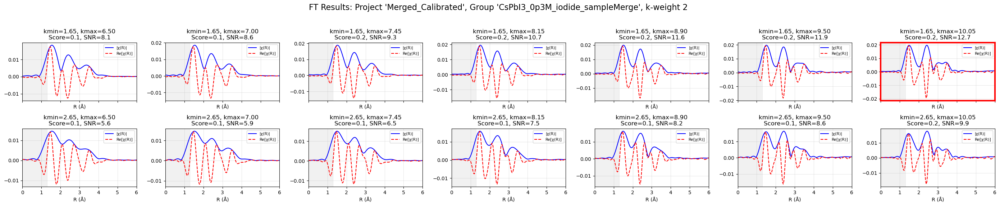

  Saved FT data: kspace_kw2_Merged_Calibrated_CsPbI3_0p3M_iodide_sampleMerge.csv, rspace_kw2_Merged_Calibrated_CsPbI3_0p3M_iodide_sampleMerge.csv
  Best parameters (k-weight 2):
    kmin = 1.650
    kmax = 10.050
    SNR = 12.7
    Quality Score = 0.24872766900820167


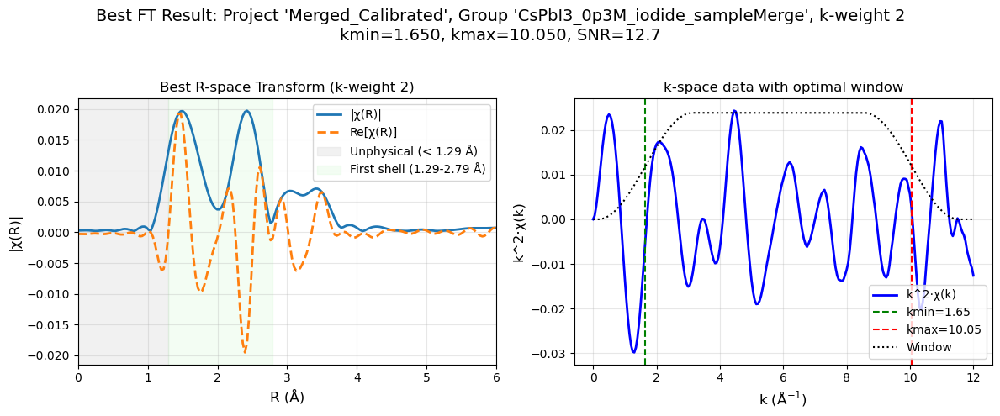


Processing FT for Project 'Merged_Calibrated', Group 'd_Ref_CsPbI3_0p3M_iodide_sampleMerge'
  Using rbkg = 1.29 Å

  Analyzing with k-weight 2:
  Found 11 zero crossings
  All zero crossings: [ 0.    1.4   2.4   3.5   4.65  5.85  6.9   8.05  9.15 10.4  11.45]
  Selected kmin candidates: [2.4]
  Selected kmax candidates: [ 6.9   8.05  9.15 10.4  11.45]


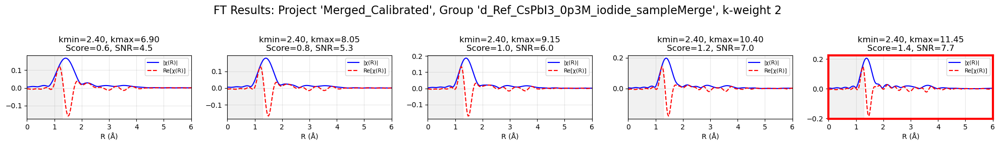

  Saved FT data: kspace_kw2_Merged_Calibrated_d_Ref_CsPbI3_0p3M_iodide_sampleMerge.csv, rspace_kw2_Merged_Calibrated_d_Ref_CsPbI3_0p3M_iodide_sampleMerge.csv
  Best parameters (k-weight 2):
    kmin = 2.400
    kmax = 11.450
    SNR = 7.7
    Quality Score = 1.3534931781426165


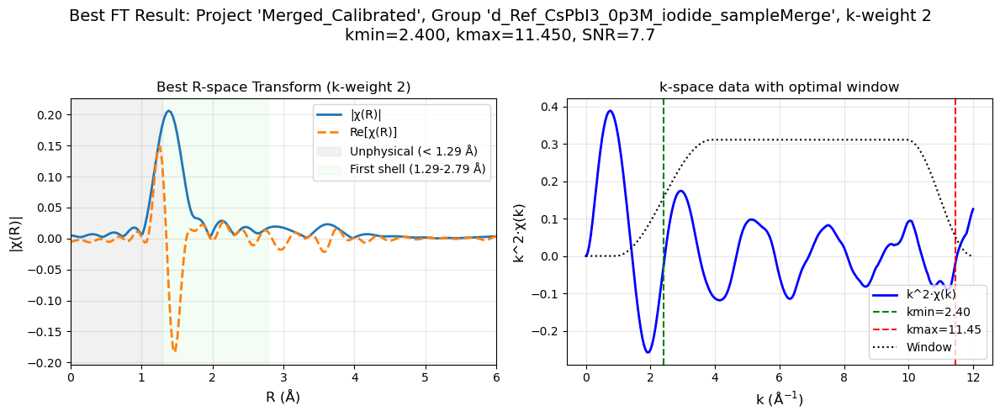


Processing FT for Project 'Merged_Calibrated', Group 'CsPbI3_0p1M_iodide_sampleMerge'
  Using rbkg = 1.29 Å

  Analyzing with k-weight 2:
  Found 13 zero crossings
  All zero crossings: [ 0.    1.5   2.5   3.5   4.75  5.7   6.9   8.1   9.15  9.65  9.9  10.6
 11.55]
  Selected kmin candidates: [1.5 2.5]
  Selected kmax candidates: [ 6.9   8.1   9.15  9.65  9.9  10.6  11.55]


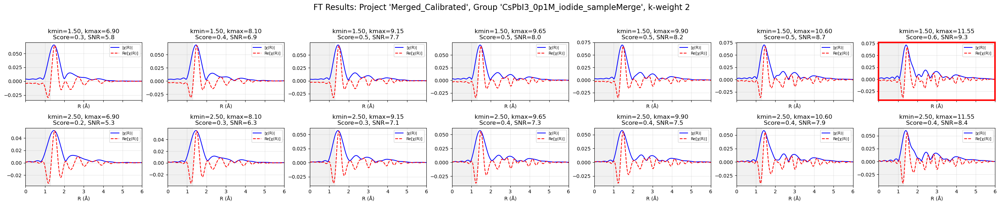

  Saved FT data: kspace_kw2_Merged_Calibrated_CsPbI3_0p1M_iodide_sampleMerge.csv, rspace_kw2_Merged_Calibrated_CsPbI3_0p1M_iodide_sampleMerge.csv
  Best parameters (k-weight 2):
    kmin = 1.500
    kmax = 11.550
    SNR = 9.3
    Quality Score = 0.5692424938438494


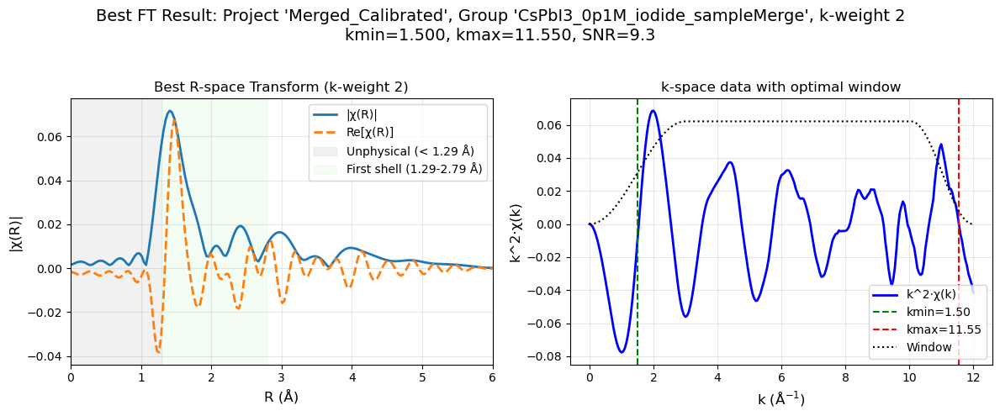


Processing FT for Project 'Merged_Calibrated', Group 'd_Ref_CsPbI3_0p1M_iodide_sampleMerge'
  Using rbkg = 0.97 Å

  Analyzing with k-weight 2:
  Found 9 zero crossings
  All zero crossings: [ 0.    1.9   3.25  4.45  6.3   7.55  8.85 10.25 11.8 ]
  Selected kmin candidates: [1.9]
  Selected kmax candidates: [ 6.3   7.55  8.85 10.25 11.8 ]


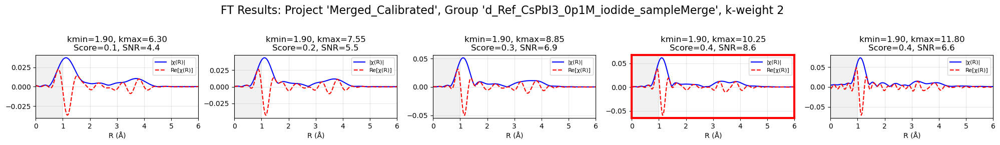

  Saved FT data: kspace_kw2_Merged_Calibrated_d_Ref_CsPbI3_0p1M_iodide_sampleMerge.csv, rspace_kw2_Merged_Calibrated_d_Ref_CsPbI3_0p1M_iodide_sampleMerge.csv
  Best parameters (k-weight 2):
    kmin = 1.900
    kmax = 10.250
    SNR = 8.6
    Quality Score = 0.43247230252509145


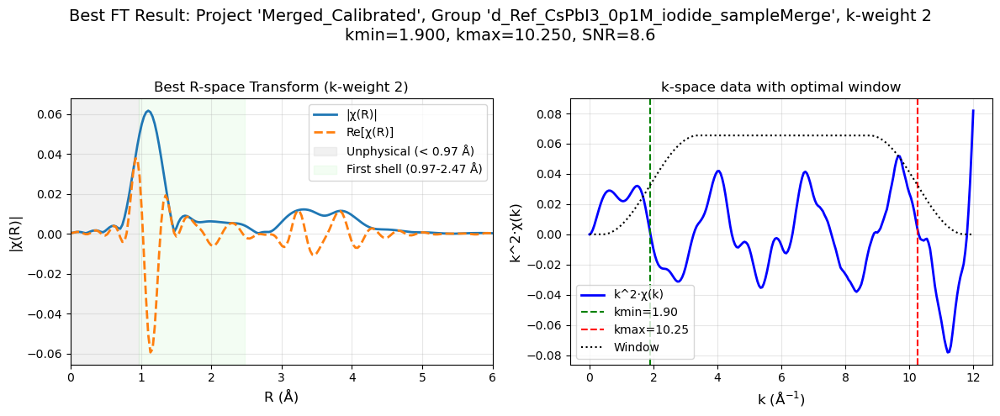


Summary of FT optimization results:


In [8]:
def ft_processing_batch(projects, k_weights=[2], dk=4, window='hanning', save_ft_data=True, output_dir='ft_outputs'):
    """
    Perform batch Fourier Transform (FT) processing with automated kmin/kmax optimization.
    
    Parameters:
    -----------
    projects : dict
        Dictionary of projects loaded and processed with background_optimizer and smooth_and_taper_chi
    k_weights : list
        List of k-weights to use for FT processing (default: [3])
    dk : float
        Window sill width parameter for the FT window function
    window : str
        Window type to use ('hanning', 'kaiser', 'gaussian', etc.)
    
    For each group (with attributes 'k' and 'chi_tapered'), this function:
    - Determines candidate kmin/kmax values (using zero crossings)
    - Performs FT processing on each candidate pair
    - Evaluates quality metrics and identifies the optimal parameters
    - Generates diagnostic plots for comparison
    - Stores the optimal parameters and results in the group
    
    Returns:
    --------
    dict
        The modified projects dictionary with FT results
    """
    import numpy as np
    import matplotlib.pyplot as plt
    from pathlib import Path
    from larch.xafs import xftf
    from larch import Group
    
    if not projects:
        print("No projects provided for FT processing")
        return projects

    export_base = None
    if save_ft_data:
        export_base = Path(output_dir)
        export_base.mkdir(parents=True, exist_ok=True)
        print(f"FT export enabled. Saving files to: {export_base.resolve()}")
    
    for proj_name, project in projects.items():
        for group_name, group in project.groups.items():
            if hasattr(group, 'k') and hasattr(group, 'chi_tapered'):
                k = group.k
                chi_tapered = group.chi_tapered
                rbkg_value = getattr(group, 'optimal_rbkg', getattr(group, 'rbkg', 1.2))
                
                print(f"\nProcessing FT for Project '{proj_name}', Group '{group_name}'")
                print(f"  Using rbkg = {rbkg_value:.2f} Å")
                
                for kw in k_weights:
                    print(f"\n  Analyzing with k-weight {kw}:")
                    weighted_chi = chi_tapered * k**kw
                    zc_indices = np.where(np.diff(np.sign(weighted_chi)))[0]
                    if zc_indices.size > 0:
                        candidates_all = np.sort(k[zc_indices])
                        print(f"  Found {len(candidates_all)} zero crossings")
                        print(f"  All zero crossings: {np.round(candidates_all, 2)}")
                    else:
                        candidates_all = np.array([])
                        print("  No zero crossings found! Using default values.")
                    
                    # Determine kmin candidates
                    kmin_region = candidates_all[(candidates_all >= 1.5) & (candidates_all <= 3)]
                    if len(kmin_region) > 0:
                        candidate_kmin_list = kmin_region[:3]
                    elif len(candidates_all) > 0:
                        first_zc = candidates_all[0]
                        candidate_kmin_list = np.array([first_zc]) if first_zc > 1.0 else np.array([3.0])
                    else:
                        candidate_kmin_list = np.array([3.0])
                    
                    # Determine kmax candidates
                    high_k_region = candidates_all[(candidates_all > 6.0)]
                    if len(high_k_region) > 0:
                        candidate_kmax_list = np.sort(high_k_region[:7])  # selecting the first 6 candidates
                    else:
                        # If no candidates found above 11, use a reasonable default range
                        max_k = np.max(k)
                        candidate_kmax_list = np.array([max_k - 1])

                    print(f"  Selected kmin candidates: {np.round(candidate_kmin_list, 2)}")
                    print(f"  Selected kmax candidates: {np.round(candidate_kmax_list, 2)}")
                    
                    ft_results = []
                    best_score = -float('inf')
                    best_kmin = None
                    best_kmax = None
                    best_temp = None
                    
                    n_rows = len(candidate_kmin_list)
                    n_cols = len(candidate_kmax_list)
                    
                    if n_rows * n_cols > 1:
                        fig, axs = plt.subplots(n_rows, n_cols, figsize=(4 * n_cols, 3 * n_rows), sharex=True)
                        # Ensure axs is 2D even if one dimension is 1
                        if n_rows == 1 and n_cols == 1:
                            axs = np.array([[axs]])
                        elif n_rows == 1:
                            axs = np.expand_dims(axs, axis=0)
                        elif n_cols == 1:
                            axs = np.expand_dims(axs, axis=1)
                        
                        for i, cand_kmin in enumerate(candidate_kmin_list):
                            for j, cand_kmax in enumerate(candidate_kmax_list):
                                ax = axs[i, j]
                                if cand_kmin < cand_kmax:
                                    temp = Group()
                                    temp.k = k.copy()
                                    temp.chi = chi_tapered.copy()
                                    xftf(temp, kweight=kw, kmin=cand_kmin, kmax=cand_kmax, 
                                         dk=dk, kwindow=window)
                                    ax.plot(temp.r, temp.chir_mag, label="|χ(R)|", color='blue')
                                    ax.plot(temp.r, temp.chir_re, label="Re[χ(R)]", 
                                            linestyle='--', color='red')
                                    
                                    first_shell_mask = (temp.r > rbkg_value) & (temp.r < rbkg_value + 1.5)
                                    if np.any(first_shell_mask):
                                        first_shell_height = np.max(temp.chir_mag[first_shell_mask])
                                        first_shell_pos = temp.r[first_shell_mask][np.argmax(temp.chir_mag[first_shell_mask])]
                                        noise_mask = (temp.r > 0) & (temp.r < rbkg_value)
                                        noise = np.mean(temp.chir_mag[noise_mask]) if np.any(noise_mask) else 0.001
                                        snr = first_shell_height / noise if noise > 0 else 0
                                        position_factor = 1.0 - 0.2 * abs(first_shell_pos - 2.5) / 1.5
                                        quality_score = snr * position_factor * first_shell_height

                                        ft_results.append({
                                            'kmin': cand_kmin,
                                            'kmax': cand_kmax,
                                            'snr': snr,
                                            'quality_score': quality_score,
                                            'temp': temp
                                        })

                                        if quality_score > best_score:
                                            best_score = quality_score
                                            best_kmin = cand_kmin
                                            best_kmax = cand_kmax
                                            best_temp = Group()
                                            best_temp.k = temp.k.copy()
                                            best_temp.chi = temp.chi.copy()
                                            best_temp.r = temp.r.copy()
                                            best_temp.chir_mag = temp.chir_mag.copy()
                                            best_temp.chir_re = temp.chir_re.copy()
                                            best_temp.chir_im = temp.chir_im.copy() if hasattr(temp, 'chir_im') else None

                                        ax.set_title(f"kmin={cand_kmin:.2f}, kmax={cand_kmax:.2f}\n"
                                                     f"Score={quality_score:.1f}, SNR={snr:.1f}")
                                    else:
                                        ax.set_title(f"kmin={cand_kmin:.2f}, kmax={cand_kmax:.2f}")
                                    
                                    ax.axvspan(0, rbkg_value, color='lightgray', alpha=0.3)
                                    ax.set_xlabel('R (Å)')
                                    ax.grid(True, alpha=0.3)
                                    ax.legend(fontsize=8)
                                    ax.set_xlim(0, 6)
                                else:
                                    ax.text(0.5, 0.5, "Invalid combination\nkmin ≥ kmax", 
                                            ha='center', va='center')
                                    ax.set_title(f"kmin={cand_kmin:.2f}, kmax={cand_kmax:.2f}")
                        
                        if best_kmin is not None and best_kmax is not None:
                            try:
                                best_i = np.where(candidate_kmin_list == best_kmin)[0][0]
                                best_j = np.where(candidate_kmax_list == best_kmax)[0][0]
                                for spine in axs[best_i, best_j].spines.values():
                                    spine.set_edgecolor('red')
                                    spine.set_linewidth(3)
                            except Exception as e:
                                print(f"  Warning: Couldn't highlight best parameter pair: {e}")
                        
                        fig.suptitle(f"FT Results: Project '{proj_name}', Group '{group_name}', k-weight {kw}", 
                                     fontsize=16)
                        plt.tight_layout(rect=[0, 0.03, 1, 0.95])
                        plt.show()
                    
                    if ft_results:
                        ft_results.sort(key=lambda x: x.get('quality_score', x.get('snr', 0)), reverse=True)
                        best_result = ft_results[0]
                        setattr(group, f"best_kmin_kw{kw}", best_result['kmin'])
                        setattr(group, f"best_kmax_kw{kw}", best_result['kmax'])
                        if kw == 2:
                            group.best_kmin = best_result['kmin']
                            group.best_kmax = best_result['kmax']
                        
                        best_temp = best_result['temp']
                        setattr(group, f"best_r_kw{kw}", best_temp.r)
                        setattr(group, f"best_chir_mag_kw{kw}", best_temp.chir_mag)
                        setattr(group, f"best_chir_re_kw{kw}", best_temp.chir_re)
                        if hasattr(best_temp, 'chir_im'):
                            setattr(group, f"best_chir_im_kw{kw}", best_temp.chir_im)

                        if save_ft_data and export_base is not None:
                            safe_proj = ''.join(ch if ch.isalnum() or ch in ('-', '_') else '_' for ch in proj_name)
                            safe_group = ''.join(ch if ch.isalnum() or ch in ('-', '_') else '_' for ch in group_name)
                            group_export_dir = export_base / safe_proj / safe_group
                            group_export_dir.mkdir(parents=True, exist_ok=True)

                            k2_weighted = chi_tapered * (k ** 2)
                            k_file = group_export_dir / f"kspace_kw2_{safe_proj}_{safe_group}.csv"
                            np.savetxt(
                                k_file,
                                np.column_stack((k, k2_weighted)),
                                delimiter=',',
                                header='k,k2_chi',
                                comments=''
                            )

                            r_file = group_export_dir / f"rspace_kw{kw}_{safe_proj}_{safe_group}.csv"
                            np.savetxt(
                                r_file,
                                np.column_stack((best_temp.r, best_temp.chir_mag, best_temp.chir_re)),
                                delimiter=',',
                                header='R,chiR_mag,chiR_re',
                                comments=''
                            )
                            print(f"  Saved FT data: {k_file.name}, {r_file.name}")
                        
                        print(f"  Best parameters (k-weight {kw}):")
                        print(f"    kmin = {best_result['kmin']:.3f}")
                        print(f"    kmax = {best_result['kmax']:.3f}")
                        print(f"    SNR = {best_result['snr']:.1f}")
                        print(f"    Quality Score = {best_result.get('quality_score', 'N/A')}")
                        
                        plt.figure(figsize=(12, 5))
                        plt.subplot(1, 2, 1)
                        plt.plot(best_temp.r, best_temp.chir_mag, label="|χ(R)|", linewidth=2)
                        plt.plot(best_temp.r, best_temp.chir_re, label="Re[χ(R)]", linestyle='--', linewidth=2)
                        plt.axvspan(0, rbkg_value, color='lightgray', alpha=0.3, 
                                    label=f"Unphysical (< {rbkg_value:.2f} Å)")
                        plt.axvspan(rbkg_value, rbkg_value + 1.5, color='lightgreen', alpha=0.1, 
                                    label=f"First shell ({rbkg_value:.2f}-{rbkg_value+1.5:.2f} Å)")
                        plt.xlabel('R (Å)', fontsize=12)
                        plt.ylabel('|χ(R)|', fontsize=12)
                        plt.title(f"Best R-space Transform (k-weight {kw})")
                        plt.grid(True, alpha=0.3)
                        plt.legend()
                        plt.xlim(0, 6)
                        
                        plt.subplot(1, 2, 2)
                        plt.plot(k, chi_tapered * k**kw, 'b-', lw=2, label=f'k^{kw}·χ(k)')
                        plt.axvline(x=best_result['kmin'], color='g', linestyle='--', 
                                    label=f'kmin={best_result["kmin"]:.2f}')
                        plt.axvline(x=best_result['kmax'], color='r', linestyle='--', 
                                    label=f'kmax={best_result["kmax"]:.2f}')
                        
                        try:
                            from larch.xafs.xafsft import ftwindow
                            win = ftwindow(k, xmin=best_result['kmin'], xmax=best_result['kmax'], 
                                           dx=dk, window=window)
                            plt.plot(k, win * np.max(np.abs(chi_tapered * k**kw)) * 0.8, 
                                     'k:', label='Window')
                        except Exception as e:
                            print(f"  Warning: Could not generate window function: {e}")
                        
                        plt.xlabel('k (Å$^{-1}$)', fontsize=12)
                        plt.ylabel(f'k^{kw}·χ(k)', fontsize=12)
                        plt.title('k-space data with optimal window')
                        plt.legend()
                        plt.grid(True, alpha=0.3)
                        
                        plt.suptitle(
                            f"Best FT Result: Project '{proj_name}', Group '{group_name}', k-weight {kw}\n"
                            f"kmin={best_result['kmin']:.3f}, kmax={best_result['kmax']:.3f}, SNR={best_result['snr']:.1f}",
                            fontsize=14
                        )
                        plt.tight_layout(rect=[0, 0, 1, 0.95])
                        plt.show()
            else:
                print(f"Skipping group '{group_name}' in Project '{proj_name}': Missing 'k' or 'chi_tapered' attribute")
    
    return projects  # Return the modified projects for chaining

projects = ft_processing_batch(projects, k_weights=[2], dk=3, window='hanning')

# Verify results
if projects:
    print("\nSummary of FT optimization results:")
    for proj_name, project in projects.items():
        for group_name, group in project.groups.items():
            if hasattr(group, 'best_kmin_kw3'):
                print(f"  {proj_name} - {group_name}: kmin={group.best_kmin_kw3:.2f}, kmax={group.best_kmax_kw3:.2f}")

In [ ]:
import inspect
print("all_abs in function source?", "all_abs" in inspect.getsource(enhanced_iteration1_fit))
print("feff path in function source?", "./data/feff_calculations/feff/" in inspect.getsource(enhanced_iteration1_fit))

all_abs in function source? False
feff path in function source? False


In [ ]:
def build_params_for_iteration(iteration, prev_result=None, So_2=0.788):
    """
    Build a parameter group for the given EXAFS fitting iteration.
    
    Now set up parameters for evaluating a Pb-O feff path first.
    
    Parameters:
    -----------
    iteration : int
        The iteration number.
    prev_result : object, optional
        Previous fit result with parameters to use as starting points.
    So_2 : float, optional
        Amplitude reduction factor (default: 0.78).
        
    Returns:
    --------
    param_group
        Group of parameters configured for fitting.
    """
    from larch.fitting import param, param_group

    print(f"Building parameter group for iteration {iteration} (I-centered path model)...")

    # Create parameters group with a descriptive name.
    params = param_group(name=f"fit_params_iter{iteration}")

    # Core parameters.
    params.amp = param(So_2, vary=False, min=0.5, max=1.2)
    params.del_e0 = param(0.0, vary=True, min=-15, max=15)

    # I-centered path families: I-Pb, I-I, I-C, I-O, I-S, I-Cs.
    iodine_path_defaults = {
        'n_IPb': (2.0, 0.0, 12.0),
        'ipb_sig2': (0.01, 0.001, 0.03),
        'ipb_delr': (0.0, -0.3, 0.3),
        'n_II': (2.0, 0.0, 12.0),
        'ii_sig2': (0.01, 0.001, 0.03),
        'ii_delr': (0.0, -0.3, 0.3),
        'n_IC': (1.0, 0.0, 12.0),
        'ic_sig2': (0.01, 0.001, 0.03),
        'ic_delr': (0.0, -0.3, 0.3),
        'n_IO': (1.0, 0.0, 12.0),
        'io_sig2': (0.01, 0.001, 0.03),
        'io_delr': (0.0, -0.3, 0.3),
        'n_IS': (1.0, 0.0, 12.0),
        'is_sig2': (0.01, 0.001, 0.03),
        'is_delr': (0.0, -0.3, 0.3),
        'n_ICs': (1.0, 0.0, 12.0),
        'ics_sig2': (0.01, 0.001, 0.03),
        'ics_delr': (0.0, -0.3, 0.3),
    }

    for pname, (val, pmin, pmax) in iodine_path_defaults.items():
        params.__dict__[pname] = param(val, vary=True, min=pmin, max=pmax)

    # Update from a previous result, if available.
    if prev_result is not None and hasattr(prev_result, 'params'):
        print("  Using values from previous fit result")
        for name in ['amp', 'del_e0'] + list(iodine_path_defaults.keys()):
            if name in prev_result.params and hasattr(params, name):
                getattr(params, name).value = prev_result.params[name].value

    print(f"  Created parameters for iteration {iteration}")
    return params




def enhanced_iteration1_fit(projects, feff_base_dir=None):
    """
    Enhanced Iteration 1 – Evaluate and select optimal Pb-O path for all groups with residual analysis.
    
    Parameters:
    -----------
    projects : dict
        Dictionary of projects loaded and processed from Athena
    feff_base_dir : str or Path, optional
        Directory containing FEFF calculation files 
        (default: 'C:/Users/<user>/.larch/feff/relaxed')
    
    This function:
    - Walks the FEFF base directory to collect and analyze FEFF .dat files
    - Filters for relevant Pb-O paths
    - For each group with required data (k and chi_tapered):
        - Creates a transform
        - Evaluates each filtered FEFF path by performing test fits
        - Performs residual analysis in k-space within the FT window
        - Selects the best path using comprehensive quality metrics
        - Performs a final fit with detailed residual analysis
        - Stores results on the group and displays diagnostics
    
    Returns:
    --------
    dict
        The modified projects dictionary
    """
    import os
    from pathlib import Path
    import copy
    import numpy as np
    import matplotlib.pyplot as plt
    from larch.xafs import feffpath, feffit_dataset, feffit, TransformGroup
    from larch.fitting import param, param_group
    from larch import Group
    
    # Check if projects is valid
    if not projects:
        print("ERROR: No projects provided or projects is None/empty")
        return projects  # Return the original projects (even if None) instead of None
    
    print(f"Starting enhanced_iteration1_fit with {len(projects)} projects")
    
    # Use default FEFF directory if not provided
    if feff_base_dir is None:
        feff_base_dir = r'./data/feff_calculations/feff/'
    
    print(f"Searching for and analyzing Pb-O FEFF paths in {feff_base_dir}")
    
    # --- Inner helper: analyze a FEFF path file ---
    def analyze_feff_path(file_path):
        path_info = {'is_pbo': False, 'path': file_path, 'filename': os.path.basename(file_path)}
        try:
            fp_obj = feffpath(filename=file_path)
            if hasattr(fp_obj._feffdat, 'absorber') and fp_obj._feffdat.absorber != 'I':
                return path_info
            scatterers = []
            oxygen_atoms = []
            for atom in fp_obj._feffdat.geom:
                atom_symbol = atom[0]
                if atom[2] != 0:  # not the absorber
                    scatterers.append(atom_symbol)
                    if atom_symbol == 'O':
                        oxygen_atoms.append(atom)
            if 'O' in scatterers:
                path_info['is_pbo'] = True
                path_info['reff'] = fp_obj._feffdat.reff
                path_info['nleg'] = fp_obj._feffdat.nleg
                path_info['degen'] = fp_obj._feffdat.degen
                path_info['geometry'] = fp_obj._feffdat.geom
                path_info['n_oxygen'] = scatterers.count('O')
                path_info['feffpath'] = fp_obj
                if fp_obj._feffdat.nleg == 2 and len(oxygen_atoms) == 1:
                    path_info['path_type'] = 'ss'
                elif fp_obj._feffdat.nleg > 2:
                    path_info['path_type'] = 'ms'
                if path_info.get('path_type') == 'ss':
                    path_info['label'] = f"Pb-O SS: {path_info['reff']:.3f}Å"
                else:
                    atoms_count = {}
                    for atom in scatterers:
                        atoms_count[atom] = atoms_count.get(atom, 0) + 1
                    atom_string = '-'.join([f"{cnt}{atom}" for atom, cnt in atoms_count.items()])
                    path_info['label'] = f"Pb-{atom_string} MS: {path_info['reff']:.3f}Å"
            return path_info
        except Exception as e:
            print(f"Error analyzing {file_path}: {e}")
            return path_info
    
    # --- New helper: calculate residual metrics ---
    def calculate_residuals(dset, kweight=2):
        """Calculate residuals and metrics between data and model in k-space."""
        try:
            # Extract k, data chi and model chi
            k = dset.data.k
            chi_data = dset.data.chi
            chi_model = dset.model.chi
            
            # Get mask for points within the FT window
            ft_mask = (k >= dset.transform.kmin) & (k <= dset.transform.kmax)
            k_in_range = k[ft_mask]
            
            # Apply k-weighting to make residuals match visual assessment
            kw_factor = k_in_range**kweight
            data_weighted = chi_data[ft_mask] * kw_factor
            model_weighted = chi_model[ft_mask] * kw_factor
            
            # Calculate residuals and metrics
            residuals = data_weighted - model_weighted
            residuals_raw = chi_data[ft_mask] - chi_model[ft_mask]
            
            rmse = np.sqrt(np.mean(residuals**2))
            mean_abs_error = np.mean(np.abs(residuals))
            max_error = np.max(np.abs(residuals))
            
            return {
                'k': k_in_range,
                'residuals': residuals,
                'residuals_raw': residuals_raw,
                'rmse': rmse,
                'mean_abs_error': mean_abs_error,
                'max_error': max_error,
                'data_weighted': data_weighted,
                'model_weighted': model_weighted
            }
        except Exception as e:
            print(f"Error calculating residuals: {e}")
            return {
                'k': np.array([]),
                'residuals': np.array([]),
                'residuals_raw': np.array([]),
                'rmse': 999.0,
                'mean_abs_error': 999.0,
                'max_error': 999.0,
                'data_weighted': np.array([]),
                'model_weighted': np.array([])
            }
    
    # --- Collect all available Pb-O paths ---
    try:
        feff_base_dir = Path(feff_base_dir)
        if not feff_base_dir.exists():
            print(f"ERROR: FEFF directory {feff_base_dir} does not exist")
            return projects
            
        pbo_path_infos = []
        for root, dirs, files in os.walk(feff_base_dir):
            for file in files:
                if file.lower().startswith('feff') and file.lower().endswith('.dat'):
                    full_path = os.path.join(root, file)
                    info = analyze_feff_path(full_path)
                    if info.get('is_pbo'):
                        pbo_path_infos.append(info)
        pbo_path_infos.sort(key=lambda x: x.get('reff', 0))
        print(f"Found {len(pbo_path_infos)} Pb-O FEFF paths.")
        
        # Display basic summary of paths
        if pbo_path_infos:
            print("\nDetailed information about Pb-O paths:")
            print(f"{'Index':6} {'Type':6} {'Reff':8} {'Deg':6} {'n-leg':6} {'Label'}")
            print("-"*80)
            for i, info in enumerate(pbo_path_infos):
                ptype = info.get('path_type', 'unk')
                reff = info.get('reff', 0)
                deg = info.get('degen', 0)
                nleg = info.get('nleg', 0)
                label = info.get('label', info.get('filename', 'unknown'))
                print(f"{i+1:6d} {ptype:6s} {reff:.3f} Å {deg:6g} {nleg:6d}  {label}")
        else:
            print("WARNING: No Pb-O paths found in FEFF directory")
            return projects  # Return original projects if no paths found
    except Exception as e:
        print(f"ERROR collecting FEFF paths: {e}")
        return projects
    
    # Filter to relevant single-scattering paths with reff < 4.0 Å
    filtered_paths = [p for p in pbo_path_infos if p.get('path_type')=='ss' and p.get('reff',0) < 3.5]
    if len(filtered_paths) == 0:
        ms_paths = [p for p in pbo_path_infos if p.get('path_type')=='ms' and p.get('reff',0) < 4.0]
        if ms_paths:
            filtered_paths.append(ms_paths[0])
    print(f"\nFiltered to {len(filtered_paths)} most relevant Pb-O paths for testing with each group.")
    
    if not filtered_paths:
        print("ERROR: No suitable Pb-O paths found after filtering")
        return projects
    
    # Helper function to get transform for a group
    def get_transform_for_group(data_group):
        """Create and return a TransformGroup for the given data_group."""
        kw = 3
        kmin = 3.0
        kmax = 12.0
        if hasattr(data_group, 'best_kmin_kw3'):
            kmin = data_group.best_kmin_kw3
            print(f"  Found optimized kmin = {kmin:.2f} for kw=3")
        else:
            print(f"  Using default kmin = {kmin:.2f}")
        if hasattr(data_group, 'best_kmax_kw3'):
            kmax = data_group.best_kmax_kw3
            print(f"  Found optimized kmax = {kmax:.2f} for kw=3")
        else:
            print(f"  Using default kmax = {kmax:.2f}")
            
        rbkg = getattr(data_group, 'optimal_rbkg', getattr(data_group, 'rbkg', 0.9))
        if rbkg is None:
            print("  Warning: No rbkg value found, using default 0.9")
            rbkg = 0.9
        trans = TransformGroup(kmin=kmin, kmax=kmax, kweight=kw, dk=3, window='hanning', rmin=rbkg, rmax=4.0)
        print(f"  Created transform with k-range: {kmin:.2f} to {kmax:.2f} Å⁻¹, kw={kw}")
        return trans
    
    # --- Inner helper: process a single group ---
    def process_group(group, group_name):
        """Process a single group to find and fit the best Pb-O path."""
        print("\n" + "="*50)
        print(f"Processing group: {group_name}")
        print("="*50)
        if not (hasattr(group, 'k') and hasattr(group, 'chi_tapered')):
            print(f"Skipping {group_name} - missing required k and chi_tapered data")
            return False
        try:
            trans = get_transform_for_group(group)
            temp_data = Group(k=group.k, chi=group.chi_tapered)
        except Exception as e:
            print(f"Error creating transform for {group_name}: {e}")
            return False
            
        print(f"Evaluating {len(filtered_paths)} Pb-O paths for {group_name}...")
        single_path_results = []
        for i, path_info in enumerate(filtered_paths):
            try:
                fp_obj = path_info['feffpath']
                reff = path_info.get('reff', 0)
                path_label = path_info.get('label', 'unknown')
                
                # Create test path
                test_path = feffpath(fp_obj.filename)
                test_path.degen = 1.0
                test_path.s02 = 'amp * n_PbO'
                test_path.e0 = 'del_e0'
                test_path.sigma2 = 'pbo_sig2'
                test_path.deltar = 'pbo_delr'
                test_path.label = path_label
                
                # Create parameters
                test_params = build_params_for_iteration(1)
                
                # Create dataset and perform fit
                dset = feffit_dataset(data=temp_data, pathlist=[test_path], transform=trans)
                fit_result = feffit(test_params, [dset])
                
                # Calculate residuals and metrics
                residual_analysis = calculate_residuals(dset, kweight=trans.kweight)
                
                # Calculate quality metrics (including residual information)
                delr_abs = abs(fit_result.params['pbo_delr'].value)
                rmse_factor = residual_analysis['rmse'] / 50  # Scale RMSE to be comparable with other factors
                quality_metric = (delr_abs + fit_result.rfactor + rmse_factor)**2
                
                # Store result
                single_path_results.append({
                    'path_info': path_info,
                    'path': test_path,
                    'reff': reff,
                    'rfactor': fit_result.rfactor,
                    'n_PbO': fit_result.params['n_PbO'].value,
                    'pbo_sig2': fit_result.params['pbo_sig2'].value,
                    'pbo_delr': fit_result.params['pbo_delr'].value,
                    'chi_square': fit_result.chi_square,
                    'fit_result': fit_result,
                    'label': path_label,
                    'path_type': path_info.get('path_type', 'unk'),
                    'delr_abs': delr_abs,
                    'residual_analysis': residual_analysis,
                    'rmse': residual_analysis['rmse'],
                    'quality_metric': quality_metric,
                    'dataset': dset
                })
                print(f"  Path {i+1}: {path_label} - |ΔR|: {delr_abs:.3f}, R-factor: {fit_result.rfactor:.6f}, RMSE: {residual_analysis['rmse']:.3e}, Quality: {quality_metric:.6f}")
            except Exception as e:
                print(f"  Error testing path {path_info.get('label', 'unknown')} with {group_name}: {e}")
        
        if not single_path_results:
            print(f"No successful path fits for {group_name}")
            return False
            
        # Sort by quality metric and get best result
        single_path_results.sort(key=lambda x: x['quality_metric'])
        best_path_result = single_path_results[0]
        print("\nBest path results for", group_name)
        print(f"Path: {best_path_result['label']}")
        print(f"Quality metric: {best_path_result['quality_metric']:.6f}")
        print(f"|ΔR|: {best_path_result['delr_abs']:.6f}")
        print(f"R-factor: {best_path_result['rfactor']:.8f}")
        print(f"RMSE in k-space: {best_path_result['rmse']:.3e}")
        print(f"N(Pb-O): {best_path_result['n_PbO']:.2f}")
        print(f"Pb-O sigma2: {best_path_result['pbo_sig2']:.6f}")
        
        # Perform final fit with the best path
        path_info = best_path_result['path_info']
        fp_obj = path_info['feffpath']
        pbo_path = feffpath(fp_obj.filename)
        pbo_path.degen = 1.0
        pbo_path.s02 = 'amp * n_PbO'
        pbo_path.e0 = 'del_e0'
        pbo_path.sigma2 = 'pbo_sig2'
        pbo_path.deltar = 'pbo_delr'
        pbo_path.label = best_path_result['label']
        
        final_params = param_group(
            amp = param(0.78, vary=False, min=0.5, max=1.2),
            del_e0 = param(best_path_result['fit_result'].params['del_e0'].value, vary=True, min=-15, max=15),
            n_PbO = param(best_path_result['n_PbO'], vary=True, min=0.0, max=8.0),
            pbo_sig2 = param(best_path_result['pbo_sig2'], vary=True, min=0.001, max=0.03),
            pbo_delr = param(best_path_result['pbo_delr'], vary=True, min=-0.2, max=0.2)
        )
        
        final_dset = feffit_dataset(data=temp_data, pathlist=[pbo_path], transform=trans)
        fit_result_iter1 = feffit(final_params, final_dset)
        pbo_r_eff = pbo_path.reff + fit_result_iter1.params['pbo_delr'].value
        
        # Calculate final residuals
        final_residuals = calculate_residuals(final_dset, kweight=trans.kweight)
        
        print(f"Final fit results:")
        print(f"  R-factor = {fit_result_iter1.rfactor:.6f}")
        print(f"  N(Pb-O) = {fit_result_iter1.params['n_PbO'].value:.2f}")
        print(f"  |ΔR| = {abs(fit_result_iter1.params['pbo_delr'].value):.6f}")
        print(f"  Effective R = {pbo_r_eff:.3f} Å")
        print(f"  RMSE in k-space = {final_residuals['rmse']:.3e}")
        print(f"  Mean absolute error = {final_residuals['mean_abs_error']:.3e}")
        print(f"  Maximum error = {final_residuals['max_error']:.3e}")
        
        # Store results in the group
        group.fit_result_iter1 = fit_result_iter1
        group.paths_iter1 = [pbo_path]
        group.residual_analysis_iter1 = final_residuals
        
        # Extract and store k-space and r-space data for visualization
        dset0 = fit_result_iter1.datasets[0]
        k = dset0.data.k
        chi_data = dset0.data.chi * k**3
        chi_fit = dset0.model.chi * k**3
        r = dset0.data.r
        chir_data_mag = np.sqrt(dset0.data.chir_re**2 + dset0.data.chir_im**2)
        chir_fit_mag = np.sqrt(dset0.model.chir_re**2 + dset0.model.chir_im**2)
        
        group.k_space_iter1 = {'k': k, 'data': chi_data, 'fit': chi_fit}
        group.r_space_iter1 = {'r': r, 'data': chir_data_mag, 'fit': chir_fit_mag}
        
        # Create visualization with residuals
        create_visualizations(
            group, group_name, pbo_path, fit_result_iter1, dset0, 
            k, r, chi_data, chi_fit, chir_data_mag, chir_fit_mag,
            final_residuals
        )
        return True
    
# visualization function

    def create_visualizations(group, group_name, pbo_path, fit_result, dset, k, r, 
                          chi_data, chi_fit, chir_data_mag, chir_fit_mag, 
                          residual_analysis):
        """Create standard visualizations for the group fit including residual analysis."""
        try:
            # Create a figure with 3 panels in a single row: k-space, r-space, and residuals
            fig, (ax_k, ax_r, ax_res) = plt.subplots(1, 3, figsize=(18, 6), sharex=False)

            # k-space plot (left)
            ax_k.plot(k, chi_data, 'b-', label='Data')
            ax_k.plot(k, chi_fit, 'r--', label='Fit (Pb-O)')
            ax_k.set_xlabel('$k$ ($\AA^{-1}$)')
            ax_k.set_ylabel('$k^3\chi(k)$ ($\AA^{-3}$)')
            ax_k.set_title(f'{group_name} - k-space (Iteration 1)')
            ax_k.axvline(dset.transform.kmin, color='gray', linestyle=':', label=f'kmin={dset.transform.kmin:.2f}')
            ax_k.axvline(dset.transform.kmax, color='gray', linestyle=':', label=f'kmax={dset.transform.kmax:.2f}')
            ax_k.axvspan(dset.transform.kmin, dset.transform.kmax, color='green', alpha=0.1, label='FT window')
            ax_k.legend(loc='best')

            # R-space plot (middle)
            ax_r.plot(r, chir_data_mag, 'b-', label='Data')
            ax_r.plot(r, chir_fit_mag, 'r--', label='Fit (Pb-O)')
            ax_r.axvline(dset.transform.rmin, color='gray', linestyle=':')
            ax_r.axvline(dset.transform.rmax, color='gray', linestyle=':')
            reff = pbo_path.reff
            ax_r.axvline(reff, color='green', linestyle='--', alpha=0.6)
            y_pos = 0.8 * ax_r.get_ylim()[1]
            ax_r.text(reff, y_pos, pbo_path.label, ha='center', rotation=90, fontsize=8,
                    color='green', bbox=dict(facecolor='white', alpha=0.5, pad=1))
            ax_r.set_xlabel('$R$ ($\AA$)')
            ax_r.set_ylabel('$|\chi(R)|$ ($\AA^{-3}$)')
            ax_r.set_title(f'{group_name} - R-space (Iteration 1)')
            ax_r.legend(loc='best')

            # Residuals plot (right)
            k_range = residual_analysis['k']
            residuals = residual_analysis['residuals_raw']
            weighted_residuals = residual_analysis['residuals']

            if len(residuals) > 0:
                ax_res.plot(k_range, residuals, 'g-', label='Raw Residuals')
                ax_res2 = ax_res.twinx()
                ax_res2.plot(k_range, weighted_residuals, 'r-', alpha=0.7,
                            label=f'k^{dset.transform.kweight}-weighted Residuals')
                ax_res.axhline(0, color='k', linestyle='-', alpha=0.3)
                ax_res.set_xlabel('$k$ ($\AA^{-1}$)')
                ax_res.set_ylabel('Residuals: $\chi_{data}(k) - \chi_{model}(k)$')
                ax_res2.set_ylabel(f'$k^{dset.transform.kweight}$-weighted Residuals')
                ax_res.set_title('Residual Analysis')
                lines, labels = ax_res.get_legend_handles_labels()
                lines2, labels2 = ax_res2.get_legend_handles_labels()
                ax_res.legend(lines + lines2, labels + labels2, loc='best')
            else:
                ax_res.text(0.5, 0.5, 'No residual data available', ha='center', va='center')
                ax_res.set_title('Residual Analysis - No Data')

            # Add fit information textbox
            pbo_r_eff = pbo_path.reff + fit_result.params['pbo_delr'].value
            quality_metric = (abs(fit_result.params['pbo_delr'].value) + fit_result.rfactor + residual_analysis['rmse']/50)**2
            fit_info = (
                f"Best Pb-O path: {pbo_path.label}\n"
                f"Quality Metric: {quality_metric:.6f}\n"
                f"R-factor: {fit_result.rfactor:.6f}\n"
                f"χ²: {fit_result.chi_square:.2f}\n"
                f"RMSE: {residual_analysis['rmse']:.3e}\n"
                f"k-range: {dset.transform.kmin:.1f}-{dset.transform.kmax:.1f} Å⁻¹\n"
                f"N(Pb-O) = {fit_result.params['n_PbO'].value:.2f} ± {fit_result.params['n_PbO'].stderr:.2f}\n"
                f"|ΔR| = {abs(fit_result.params['pbo_delr'].value):.6f}\n"
                f"Effective R = {pbo_r_eff:.3f} Å (reff = {pbo_path.reff:.3f} Å)"
            )
            fig.text(0.01, 0.02, fit_info, fontsize=9, va='bottom',
                    bbox=dict(boxstyle='round', facecolor='white', alpha=0.7))

            # Adjust layout and suptitle
            fig.tight_layout(rect=[0, 0, 1, 0.93])
            fig.suptitle(f"EXAFS Analysis for {group_name} - Pb-O Path Fitting with Residual Analysis", fontsize=16, y=0.97)
            plt.show()

        except Exception as e:
            print(f"Error creating visualizations for {group_name}: {e}")



    # --- Main loop: process each group in each project ---
    processed_count = 0
    results_summary = []
    
    try:
        for proj_name, project in projects.items():
            print(f"\nProcessing Project: {proj_name}")
            for group_name, group in project.groups.items():
                full_name = f"{proj_name}.{group_name}"
                print(f"\nProcessing Group: {full_name}")
                if not (hasattr(group, 'chi_tapered') and hasattr(group, 'k')):
                    print(f"  Skipping {full_name} - missing required k and chi_tapered data")
                    continue
                try:
                    success = process_group(group, full_name)
                    if success:
                        processed_count += 1
                        fit_result = group.fit_result_iter1
                        path_used = group.paths_iter1[0]
                        delr_abs = abs(fit_result.params['pbo_delr'].value)
                        residual_rmse = group.residual_analysis_iter1['rmse']
                        quality_metric = (delr_abs + fit_result.rfactor + residual_rmse/50)**2
                        results_summary.append({
                            'group': full_name,
                            'path': path_used.label,
                            'reff': path_used.reff,
                            'delr_abs': delr_abs,
                            'n_PbO': fit_result.params['n_PbO'].value,
                            'effective_r': path_used.reff + fit_result.params['pbo_delr'].value,
                            'rfactor': fit_result.rfactor,
                            'rmse': residual_rmse,
                            'quality_metric': quality_metric
                        })
                except Exception as e:
                    import traceback
                    print(f"Error processing {full_name}: {e}")
                    traceback.print_exc()
    except Exception as e:
        print(f"Error in main processing loop: {e}")
        import traceback
        traceback.print_exc()
    
    # Print summary
    print("\n" + "="*100)
    print("ITERATION 1 SUMMARY: BEST Pb-O PATHS FOR ALL GROUPS WITH RESIDUAL ANALYSIS")
    print("="*100)
    print(f"Successfully processed {processed_count} groups")
    print("-"*100)
    if results_summary:
        results_summary.sort(key=lambda x: x['group'])
        print(f"{'Group':30} {'Path':25} {'Reff':7} {'|ΔR|':7} {'N(Pb-O)':7} {'Eff. R':7} {'R-factor':10} {'RMSE':10} {'Quality':10}")
        print("-"*120)
        for res in results_summary:
            print(f"{res['group']:30} {res['path']:25} {res['reff']:.3f} {res['delr_abs']:.3f} "
                  f"{res['n_PbO']:.2f} {res['effective_r']:.3f} {res['rfactor']:.8f} {res['rmse']:.3e} {res['quality_metric']:.6f}")
    



# Run iteration 1 with residual analysis
feff_base_dir=r'./data/feff_calculations/feff/'
projects = enhanced_iteration1_fit(projects, feff_base_dir)

# Check the results ONLY if projects is not None
if projects is not None:
    for proj_name, project in projects.items():
        for group_name, group in project.groups.items():
            if hasattr(group, 'fit_result_iter1'):
                fit = group.fit_result_iter1
                print(f"{proj_name}.{group_name}: ")
                print(f"  R-factor = {fit.rfactor:.6f}")
                print(f"  N(Pb-O) = {fit.params['n_PbO'].value:.2f} ± {fit.params['n_PbO'].stderr:.2f}")
                print(f"  Pb-O Effective R = {group.paths_iter1[0].reff + fit.params['pbo_delr'].value:.3f} Å")
else:
    print("ERROR: enhanced_iteration1_fit returned None, cannot proceed with results checking")

Starting enhanced_iteration1_fit with 1 projects
Searching for and analyzing Pb-O FEFF paths in ./data/feff_calculations/all_abs/
Found 0 Pb-O FEFF paths.


In [ ]:
def iterative_fit_all(projects, feff_category, iteration, feff_base_dir, previous_params=None):
    """
    Perform an iterative EXAFS fit for all groups by evaluating candidate FEFF paths
    and adding the best ones to the fit model if they improve the R-factor.
    
    Parameters:
    -----------
    projects : dict
        Dictionary of projects loaded and processed from Athena
    feff_category : str
        The FEFF path category to evaluate (e.g., "I-Pb", "I-I", "I-C", "I-O", "I-S", "I-Cs")
    iteration : int
        The current iteration number (e.g., 2)
    feff_base_dir : str or Path
        The directory where FEFF files are stored
    previous_params : dict, optional
        Dictionary of previous iteration parameters keyed by group_id
    
    Returns:
    --------
    dict
        Dictionary of fit parameters for all groups, keyed by group_id.
        Each entry contains refined parameter values, R-factors, and path info.
    """
    import os
    import re
    from pathlib import Path
    import copy
    import numpy as np
    import matplotlib.pyplot as plt
    from larch.xafs import feffpath, feffit_dataset, feffit, TransformGroup
    from larch.fitting import param as create_param, param_group
    from larch import Group
    
    # Initialize return dictionary to store parameters for next iteration
    return_params = {}

    allowed_categories = {'I-Pb', 'I-I', 'I-C', 'I-O', 'I-S', 'I-Cs'}
    if feff_category not in allowed_categories:
        print(f"ERROR: Unsupported feff_category '{feff_category}'.")
        print(f"Allowed categories: {sorted(allowed_categories)}")
        return return_params

    def format_param_with_error(value, stderr, decimal_places=3):
        """Format a parameter value with its standard error."""
        if stderr is not None and not np.isnan(stderr):
            return f"{value:.{decimal_places}f} ± {stderr:.{decimal_places}f}"
        else:
            return f"{value:.{decimal_places}f} ± N/A"
   
    # Define a helper to analyze a FEFF file for a given category
    def analyze_feff_path(file_path, category):
        path_info = {f'is_{category.lower().replace("-", "")}': False, 'path': file_path,
                    'filename': os.path.basename(file_path)}
        try:
            fp_obj = feffpath(filename=file_path)
            # Check that the absorber is I for iodine-centered fitting
            if hasattr(fp_obj._feffdat, 'absorber') and fp_obj._feffdat.absorber != 'I':
                return path_info
            
            # Extract target element from category (e.g., "Pb" from "I-Pb")
            target_element = None
            if '-' in category:
                parts = category.split('-')
                if len(parts) >= 2:
                    target_element = parts[1]  # Second part after hyphen
            else:
                target_element = category
                
            if not target_element:
                return path_info
                
            scatterers = []
            target_atoms = []
            for atom in fp_obj._feffdat.geom:
                atom_symbol = atom[0]
                if atom[2] != 0:  # not the absorber
                    scatterers.append(atom_symbol)
                    if atom_symbol.lower() == target_element.lower():
                        target_atoms.append(atom)
                        
            if target_atoms:
                path_info[f'is_{category.lower().replace("-", "")}'] = True
                path_info['reff'] = fp_obj._feffdat.reff
                path_info['nleg'] = fp_obj._feffdat.nleg
                path_info['degen'] = fp_obj._feffdat.degen
                path_info['geometry'] = fp_obj._feffdat.geom
                path_info[f'n_{target_element.lower()}'] = scatterers.count(target_element)
                path_info['feffpath'] = fp_obj
                path_info['target_element'] = target_element
                if fp_obj._feffdat.nleg == 2 and len(target_atoms) == 1:
                    path_info['path_type'] = 'ss'
                elif fp_obj._feffdat.nleg > 2:
                    path_info['path_type'] = 'ms'
                if path_info.get('path_type') == 'ss':
                    path_info['label'] = f"I-{target_element} SS: {path_info['reff']:.3f}Å"
                else:
                    atoms_count = {}
                    for a in scatterers:
                        atoms_count[a] = atoms_count.get(a, 0) + 1
                    atom_string = '-'.join([f"{cnt}{atom}" for atom, cnt in atoms_count.items()])
                    path_info['label'] = f"I-{atom_string} MS: {path_info['reff']:.3f}Å"
            return path_info
        except Exception as e:
            print(f"Error analyzing {file_path}: {e}")
            return path_info
    
    # Helper to get transform for a group
    def get_transform_for_group(group):
        """Create and return a TransformGroup for the given data_group."""
        kw = 3
        kmin = 3.0
        kmax = 12.0
        if hasattr(group, 'best_kmin_kw3'):
            kmin = group.best_kmin_kw3
            print(f"  Found optimized kmin = {kmin:.2f} for kw=3")
        else:
            print(f"  Using default kmin = {kmin:.2f}")
        if hasattr(group, 'best_kmax_kw3'):
            kmax = group.best_kmax_kw3
            print(f"  Found optimized kmax = {kmax:.2f} for kw=3")
        else:
            print(f"  Using default kmax = {kmax:.2f}")
            
        rbkg = getattr(group, 'optimal_rbkg', getattr(group, 'rbkg', 0.9))
        if rbkg is None:
            print("  Warning: No rbkg value found, using default 0.9")
            rbkg = 0.9
        trans = TransformGroup(kmin=kmin, kmax=kmax, kweight=kw, dk=3, window='hanning', rmin=rbkg, rmax=4.0)
        print(f"  Created transform with k-range: {kmin:.2f} to {kmax:.2f} Å⁻¹, kw={kw}")
        return trans

    def extract_previous_parameters(group, iteration, group_id):
        """Extract parameters from previous iteration, handling different path types."""
        prev_fit_attr = f"fit_result_iter{iteration-1}"
        prev_fit = getattr(group, prev_fit_attr, None)
        
        if prev_fit is None:
            print(f"  No previous iteration result ({prev_fit_attr}) found for {group_id}.")
            return None
            
        # Always get amplitude from iteration 1
        fit_result_iter1 = getattr(group, "fit_result_iter1", None)
        if fit_result_iter1 is not None and hasattr(fit_result_iter1, 'params'):
            amp_value = fit_result_iter1.params['amp'].value
            print(f"  Using amplitude value {amp_value:.4f} from iteration 1")
        else:
            amp_value = prev_fit.params['amp'].value
            print(f"  Using amplitude value {amp_value:.4f} from previous iteration")
        
        # Extract del_e0 (common to all iterations)
        del_e0_value = prev_fit.params['del_e0'].value
        
        # Initialize parameter dictionary
        params = {
            'amp': amp_value,
            'del_e0': del_e0_value,
            'rfactor': prev_fit.rfactor
        }
        
        # Extract path-specific parameters based on what exists in previous fit
        param_names = list(prev_fit.params.keys())
        print(f"  Available parameters from previous fit: {param_names}")
        
        # Check for different path type parameters
        path_types_found = []
        
        # Check for I-centered parameters
        if 'n_IO' in param_names:
            params['n_IO'] = prev_fit.params['n_IO'].value
            params['io_sig2'] = prev_fit.params['io_sig2'].value
            params['io_delr'] = prev_fit.params['io_delr'].value
            path_types_found.append('I-O')

        if 'n_IPb' in param_names:
            params['n_IPb'] = prev_fit.params['n_IPb'].value
            params['ipb_sig2'] = prev_fit.params['ipb_sig2'].value
            params['ipb_delr'] = prev_fit.params['ipb_delr'].value
            path_types_found.append('I-Pb')

        if 'n_II' in param_names:
            params['n_II'] = prev_fit.params['n_II'].value
            params['ii_sig2'] = prev_fit.params['ii_sig2'].value
            params['ii_delr'] = prev_fit.params['ii_delr'].value
            path_types_found.append('I-I')

        if 'n_IC' in param_names:
            params['n_IC'] = prev_fit.params['n_IC'].value
            params['ic_sig2'] = prev_fit.params['ic_sig2'].value
            params['ic_delr'] = prev_fit.params['ic_delr'].value
            path_types_found.append('I-C')

        if 'n_IS' in param_names:
            params['n_IS'] = prev_fit.params['n_IS'].value
            params['is_sig2'] = prev_fit.params['is_sig2'].value
            params['is_delr'] = prev_fit.params['is_delr'].value
            path_types_found.append('I-S')

        if 'n_ICs' in param_names:
            params['n_ICs'] = prev_fit.params['n_ICs'].value
            params['ics_sig2'] = prev_fit.params['ics_sig2'].value
            params['ics_delr'] = prev_fit.params['ics_delr'].value
            path_types_found.append('I-Cs')
        
        print(f"  Found parameters for path types: {path_types_found}")
        return params, path_types_found

    # Loop through every project and group
    total_processed = 0
    summary = []
    feff_base_dir = Path(feff_base_dir)
    
    for proj_name, project in projects.items():
        print(f"\nProcessing project: {proj_name}")
        for gname, group in project.groups.items():
            group_id = f"{proj_name}.{gname}"
            print(f"\nProcessing group: {group_id}")
            
            # Check if group has required data for iterative fitting
            if not (hasattr(group, 'k') and hasattr(group, 'chi_tapered')):
                print(f"  Skipping {group_id} – missing k or chi_tapered data.")
                continue

            # Extract parameters from previous iteration
            result = extract_previous_parameters(group, iteration, group_id)
            if result is None:
                continue
            params, path_types_found = result
            
            prev_rfactor = params['rfactor']
            print(f"  Previous iteration R-factor: {prev_rfactor:.6f}")

            # Initialize entry in return_params with extracted parameters
            return_params[group_id] = params.copy()
            return_params[group_id]['paths'] = []
            return_params[group_id]['iteration'] = iteration-1

            # Get paths from previous iteration
            prev_paths_attr = f"paths_iter{iteration-1}"
            prev_paths = getattr(group, prev_paths_attr, [])
            if not prev_paths:
                print(f"    Warning: No paths stored from previous iteration for {group_id}.")
                continue
            print(f"    Using {len(prev_paths)} paths from previous iteration.")
            
            # Store path information in return_params
            for p in prev_paths:
                # Determine category based on path label
                if 'I-Pb' in p.label:
                    category = 'I-Pb'
                elif 'I-I' in p.label:
                    category = 'I-I'
                elif 'I-O' in p.label:
                    category = 'I-O'
                elif 'I-S' in p.label:
                    category = 'I-S'
                elif 'I-C' in p.label:
                    category = 'I-C'
                elif 'I-Cs' in p.label:
                    category = 'I-Cs'
                else:
                    category = 'unknown'
                    
                return_params[group_id]['paths'].append({
                    'label': p.label,
                    'reff': p.reff,
                    'category': category
                })

            # --- Collect candidate FEFF paths for the desired category ---
            print(f"  Searching for candidate '{feff_category}' paths in {feff_base_dir}...")
            candidate_infos = []
            feff_dat_re = re.compile(r'^feff\d+\.dat$', re.IGNORECASE)
            candidate_files = []
            job_dirs_found = 0
            for root, dirs, files in os.walk(feff_base_dir):
                root_path = Path(root)
                matched_files = [f for f in files if feff_dat_re.match(f)]
                if matched_files:
                    job_dirs_found += 1
                    for file in matched_files:
                        candidate_files.append(str(root_path / file))

            for full_path in sorted(set(candidate_files)):
                info = analyze_feff_path(full_path, feff_category)
                if info.get(f'is_{feff_category.lower().replace("-", "")}'):
                    candidate_infos.append(info)

            if not candidate_files:
                print("    WARNING: No feffNNNN.dat files found. Check feff_base_dir.")
            candidate_infos.sort(key=lambda x: x.get('reff', np.inf))
            print(f"    Scanned {len(candidate_files)} FEFF path files across {job_dirs_found} FEFF job folders.")
            print(f"    Found {len(candidate_infos)} candidate paths for category '{feff_category}'.")
            
            # Filter candidates
            # filtered = [p for p in candidate_infos if p.get('reff', 0) < 3.5 and p.get('path_type')=='ss']
            # if len(filtered) == 0 and candidate_infos:
            #     filtered = [candidate_infos[0]]

            # Category-specific filtering
            if feff_category == "I-C":
                filtered = [p for p in candidate_infos if p.get('reff', 0) < 6.0]
                filtered = sorted(filtered, key=lambda x: x.get('reff', 0))[:15]
            elif feff_category == "I-O":
                filtered = [p for p in candidate_infos if p.get('reff', 0) < 3.5 and p.get('path_type')=='ss']
            elif feff_category == "I-I":
                filtered = [p for p in candidate_infos if p.get('reff', 0) < 5.5 and p.get('path_type')=='ss']
            elif feff_category == "I-Pb":
                filtered = [p for p in candidate_infos if p.get('reff', 0) < 4.5 and p.get('path_type')=='ss']
            elif feff_category in ("I-S", "I-Cs"):
                filtered = [p for p in candidate_infos if p.get('reff', 0) < 5.5]
            else:
                filtered = [p for p in candidate_infos if p.get('reff', 0) < 5.5]
                filtered = sorted(filtered, key=lambda x: x.get('reff', 0))[:10]
            
            # Ensure we have at least some paths to test
            if len(filtered) == 0 and candidate_infos:
                filtered = sorted(candidate_infos, key=lambda x: x.get('reff', 0))[:5]
            print(f"    Filtered down to {len(filtered)} candidate paths for testing.")
            if not filtered:
                print(f"    No candidate paths available for {group_id}, skipping.")
                continue

            # --- Create transform and temporary data for testing ---
            trans = get_transform_for_group(group)
            trans.rmax = trans.rmax + 0.2 * iteration
            temp_data = Group(k=group.k, chi=group.chi_tapered)

            # --- Evaluate each candidate by performing a test fit ---
            test_results = []
            print("    Evaluating candidate paths...")
            
            # Get target element for parameter naming
            target_element = feff_category.split('-')[1] if '-' in feff_category else feff_category
            target_lower = target_element.lower()
            
            for i, info in enumerate(filtered):
                try:
                    fp_obj = info['feffpath']
                    candidate_label = info.get('label', 'unknown')
                    reff_candidate = info.get('reff', 0)
                    
                    # Set up a test path for the candidate
                    test_path = feffpath(fp_obj.filename)
                    test_path.degen = 1.0
                    test_path.s02 = f'amp * n_I{target_element}'
                    test_path.sigma2 = f'i{target_lower}_sig2'
                    test_path.deltar = f'i{target_lower}_delr'
                    test_path.e0 = 'del_e0'
                    test_path.label = candidate_label

                    # Build test set: combine copies of previous paths with candidate
                    test_paths = copy.deepcopy(prev_paths)
                    test_paths.append(test_path)

                    dset = feffit_dataset(data=temp_data, pathlist=test_paths, transform=trans)
                    
                    # Create test parameters - fix previous path parameters, vary new ones
                    test_params = param_group()
                    test_params.amp = create_param(params['amp'], vary=False, min=0.0, max=2.0)
                    test_params.del_e0 = create_param(params['del_e0'], vary=False, min=-15, max=15)
                    
                    # Add parameters for existing path types (fixed)
                    if 'I-O' in path_types_found:
                        test_params.__dict__['n_IO'] = create_param(params['n_IO'], vary=False, min=0.0, max=12.0)
                        test_params.__dict__['io_sig2'] = create_param(params['io_sig2'], vary=False, min=0.0, max=0.03)
                        test_params.__dict__['io_delr'] = create_param(params['io_delr'], vary=False, min=-0.3, max=0.3)

                    if 'I-Pb' in path_types_found:
                        test_params.__dict__['n_IPb'] = create_param(params['n_IPb'], vary=False, min=0.0, max=12.0)
                        test_params.__dict__['ipb_sig2'] = create_param(params['ipb_sig2'], vary=False, min=0.0, max=0.03)
                        test_params.__dict__['ipb_delr'] = create_param(params['ipb_delr'], vary=False, min=-0.3, max=0.3)

                    if 'I-I' in path_types_found:
                        test_params.__dict__['n_II'] = create_param(params['n_II'], vary=False, min=0.0, max=12.0)
                        test_params.__dict__['ii_sig2'] = create_param(params['ii_sig2'], vary=False, min=0.0, max=0.03)
                        test_params.__dict__['ii_delr'] = create_param(params['ii_delr'], vary=False, min=-0.3, max=0.3)

                    if 'I-C' in path_types_found:
                        test_params.__dict__['n_IC'] = create_param(params['n_IC'], vary=False, min=0.0, max=12.0)
                        test_params.__dict__['ic_sig2'] = create_param(params['ic_sig2'], vary=False, min=0.0, max=0.03)
                        test_params.__dict__['ic_delr'] = create_param(params['ic_delr'], vary=False, min=-0.3, max=0.3)

                    if 'I-S' in path_types_found:
                        test_params.__dict__['n_IS'] = create_param(params['n_IS'], vary=False, min=0.0, max=12.0)
                        test_params.__dict__['is_sig2'] = create_param(params['is_sig2'], vary=False, min=0.0, max=0.03)
                        test_params.__dict__['is_delr'] = create_param(params['is_delr'], vary=False, min=-0.3, max=0.3)

                    if 'I-Cs' in path_types_found:
                        test_params.__dict__['n_ICs'] = create_param(params['n_ICs'], vary=False, min=0.0, max=12.0)
                        test_params.__dict__['ics_sig2'] = create_param(params['ics_sig2'], vary=False, min=0.0, max=0.03)
                        test_params.__dict__['ics_delr'] = create_param(params['ics_delr'], vary=False, min=-0.3, max=0.3)

                    # Add parameters for new path type (variable)
                    if feff_category not in path_types_found:
                        test_params.__dict__[f'n_I{target_element}'] = create_param(2.0, vary=True, min=0.0, max=12.0)
                        test_params.__dict__[f'i{target_lower}_sig2'] = create_param(0.01, vary=True, min=0.0, max=0.03)
                        test_params.__dict__[f'i{target_lower}_delr'] = create_param(0.0, vary=True, min=-0.3, max=0.3)

                    test_fit = feffit(test_params, dset)
                    delr_abs = abs(test_fit.params[f'i{target_lower}_delr'].value)
                    quality_metric = delr_abs * test_fit.rfactor

                    test_results.append({
                        'info': info,
                        'path': test_path,
                        'reff': reff_candidate,
                        'rfactor': test_fit.rfactor,
                        f'n_I{target_element}': test_fit.params[f'n_I{target_element}'].value,
                        f'i{target_lower}_sig2': test_fit.params[f'i{target_lower}_sig2'].value,
                        f'i{target_lower}_delr': test_fit.params[f'i{target_lower}_delr'].value,
                        'delr_abs': delr_abs,
                        'quality_metric': quality_metric,
                        'fit_result': test_fit,
                        'label': candidate_label,
                        'path_type': info.get('path_type', 'unk'),
                        'target_element': target_element,
                        'target_lower': target_lower
                    })
                    print(f"      Candidate {i+1}: {candidate_label}  |ΔR| = {delr_abs:.3f}, "
                        f"R-factor = {test_fit.rfactor:.6f}, Quality = {quality_metric:.6f}")
                except Exception as e:
                    print(f"      Error evaluating candidate {i+1} ({candidate_label}): {e}")
                    
            if not test_results:
                print(f"    No candidate paths yielded a successful test fit for {group_id}.")
                continue
                
            test_results.sort(key=lambda x: x['quality_metric'])
            best_candidate = test_results[0]
            print(f"    Best candidate for {group_id}: {best_candidate['label']}")
            
            # --- Final fit: allow all parameters to vary ---
            print(f"    Performing final fit with best candidate for {group_id}...")
            try:
                best_info = best_candidate['info']
                best_fp_obj = best_info['feffpath']
                candidate_path = feffpath(best_fp_obj.filename)
                candidate_path.degen = 1.0
                candidate_path.s02 = f'amp * n_I{target_element}'
                candidate_path.sigma2 = f'i{target_lower}_sig2'
                candidate_path.deltar = f'i{target_lower}_delr'
                candidate_path.e0 = 'del_e0'
                candidate_path.label = best_candidate['label']
                
                final_paths = copy.deepcopy(prev_paths)
                final_paths.append(candidate_path)
                
                # Create final parameters with all paths variable
                final_params = param_group()
                final_params.amp = create_param(params['amp'], vary=False, min=0.0, max=2.0)
                final_params.del_e0 = create_param(params['del_e0'], vary=True, min=-15, max=15)
                
                # Add parameters for existing path types (now variable)
                if 'I-O' in path_types_found:
                    final_params.__dict__['n_IO'] = create_param(params['n_IO'], vary=True, min=0.0, max=12.0)
                    final_params.__dict__['io_sig2'] = create_param(params['io_sig2'], vary=True, min=0.0, max=0.03)
                    final_params.__dict__['io_delr'] = create_param(params['io_delr'], vary=True, min=-0.3, max=0.3)

                if 'I-Pb' in path_types_found:
                    final_params.__dict__['n_IPb'] = create_param(params['n_IPb'], vary=True, min=0.0, max=12.0)
                    final_params.__dict__['ipb_sig2'] = create_param(params['ipb_sig2'], vary=True, min=0.0, max=0.03)
                    final_params.__dict__['ipb_delr'] = create_param(params['ipb_delr'], vary=True, min=-0.3, max=0.3)

                if 'I-I' in path_types_found:
                    final_params.__dict__['n_II'] = create_param(params['n_II'], vary=True, min=0.0, max=12.0)
                    final_params.__dict__['ii_sig2'] = create_param(params['ii_sig2'], vary=True, min=0.0, max=0.03)
                    final_params.__dict__['ii_delr'] = create_param(params['ii_delr'], vary=True, min=-0.3, max=0.3)

                if 'I-C' in path_types_found:
                    final_params.__dict__['n_IC'] = create_param(params['n_IC'], vary=True, min=0.0, max=12.0)
                    final_params.__dict__['ic_sig2'] = create_param(params['ic_sig2'], vary=True, min=0.0, max=0.03)
                    final_params.__dict__['ic_delr'] = create_param(params['ic_delr'], vary=True, min=-0.3, max=0.3)

                if 'I-S' in path_types_found:
                    final_params.__dict__['n_IS'] = create_param(params['n_IS'], vary=True, min=0.0, max=12.0)
                    final_params.__dict__['is_sig2'] = create_param(params['is_sig2'], vary=True, min=0.0, max=0.03)
                    final_params.__dict__['is_delr'] = create_param(params['is_delr'], vary=True, min=-0.3, max=0.3)

                if 'I-Cs' in path_types_found:
                    final_params.__dict__['n_ICs'] = create_param(params['n_ICs'], vary=True, min=0.0, max=12.0)
                    final_params.__dict__['ics_sig2'] = create_param(params['ics_sig2'], vary=True, min=0.0, max=0.03)
                    final_params.__dict__['ics_delr'] = create_param(params['ics_delr'], vary=True, min=-0.3, max=0.3)

                # Add parameters for new path type
                final_params.__dict__[f'n_I{target_element}'] = create_param(best_candidate[f'n_I{target_element}'], vary=True, min=0.0, max=12.0)
                final_params.__dict__[f'i{target_lower}_sig2'] = create_param(best_candidate[f'i{target_lower}_sig2'], vary=True, min=0.0, max=0.03)
                final_params.__dict__[f'i{target_lower}_delr'] = create_param(best_candidate[f'i{target_lower}_delr'], vary=True, min=-0.3, max=0.3)
                
                final_dset = feffit_dataset(data=temp_data, pathlist=final_paths, transform=trans)
                final_fit = feffit(final_params, final_dset)
                
                # Check if R-factor improved
                new_rfactor = final_fit.rfactor
                print(f"    Previous R-factor: {prev_rfactor:.6f}, New R-factor: {new_rfactor:.6f}")
                
                # Only accept the new path if the R-factor improved
                if new_rfactor < prev_rfactor:
                    print(f"    R-factor improved by {prev_rfactor - new_rfactor:.6f}, incorporating new path.")
                    
                    # Store final results on the group
                    setattr(group, f"fit_result_iter{iteration}", final_fit)
                    setattr(group, f"paths_iter{iteration}", final_paths)
                    setattr(group, f"i{target_lower}_path_iter{iteration}", candidate_path)
                    
                    # # Update return_params with all parameters from final fit
                    # updated_params = {
                    #     'amp': final_fit.params['amp'].value,
                    #     'del_e0': final_fit.params['del_e0'].value,
                    #     'rfactor': new_rfactor,
                    #     'iteration': iteration
                    # }
                    
                    # # Add all path-specific parameters
                    # for param_name in final_fit.params.keys():
                    #     if param_name not in ['amp', 'del_e0']:
                    #         updated_params[param_name] = final_fit.params[param_name].value
                    # Update return_params with all parameters from final fit (including errors)
                    updated_params = {
                        'amp': final_fit.params['amp'].value,
                        'amp_stderr': final_fit.params['amp'].stderr,
                        'del_e0': final_fit.params['del_e0'].value,
                        'del_e0_stderr': final_fit.params['del_e0'].stderr,
                        'rfactor': new_rfactor,
                        'iteration': iteration
                    }
                    
                    # Add all path-specific parameters with their errors
                    for param_name in final_fit.params.keys():
                        if param_name not in ['amp', 'del_e0']:
                            param_obj = final_fit.params[param_name]
                            updated_params[param_name] = param_obj.value
                            updated_params[f"{param_name}_stderr"] = param_obj.stderr
                    
                    return_params[group_id].update(updated_params)
                    
                    # Add new path to paths list
                    return_params[group_id]['paths'].append({
                        'label': candidate_path.label,
                        'reff': candidate_path.reff,
                        'category': feff_category
                    })
                    
                    # Create visualization (simplified for brevity)
                    fig, (ax_k, ax_r) = plt.subplots(1, 2, figsize=(15, 6))
                
                    # In the visualization section, make sure you're using the current iteration's data:
                    dset0 = final_fit.datasets[0]  # This should be the current fit
                    # Add text showing which iteration this is
                    fit_info = (
                        f"ITERATION {iteration} RESULTS\n"
                        f"R-factor: {new_rfactor:.6f} (improved by {prev_rfactor - new_rfactor:.6f})\n"
                        f"Added: {candidate_path.label}\n"
                        f"New path category: {feff_category}\n"
                        f"Status: {'ACCEPTED' if new_rfactor < prev_rfactor else 'REJECTED'}"
                    )
                    k = dset0.data.k
                    chi_data = dset0.data.chi * k**3
                    chi_fit = dset0.model.chi * k**3
                    ax_k.plot(k, chi_data, 'b-', label='Data')
                    ax_k.plot(k, chi_fit, 'r--', label=f'Fit (Iter {iteration})')
                    ax_k.set_xlabel('$k$ ($\\AA^{-1}$)')
                    ax_k.set_ylabel('$k^3\\chi(k)$ ($\\AA^{-3}$)')
                    ax_k.set_title(f'{group_id} - k-space (Iter {iteration})')
                    ax_k.legend()
                    
                    r = dset0.data.r
                    chir_data_mag = np.sqrt(dset0.data.chir_re**2 + dset0.data.chir_im**2)
                    chir_fit_mag = np.sqrt(dset0.model.chir_re**2 + dset0.model.chir_im**2)
                    ax_r.plot(r, chir_data_mag, 'b-', label='Data')
                    ax_r.plot(r, chir_fit_mag, 'r--', label=f'Fit (Iter {iteration})')
                    ax_r.set_xlabel('$R$ ($\\AA$)')
                    ax_r.set_ylabel('$|\\chi(R)|$ ($\\AA^{-3}$)')
                    ax_r.set_title(f'{group_id} - R-space (Iter {iteration})')
                    ax_r.legend()
                    
                    # Add fit info
                    fit_info = (
                        f"R-factor: {new_rfactor:.6f} (improved by {prev_rfactor - new_rfactor:.6f})\n"
                        f"Added: {candidate_path.label}\n"
                        f"New path category: {feff_category}"
                    )
                    ax_r.text(0.05, 0.95, fit_info, transform=ax_r.transAxes, fontsize=10,
                            verticalalignment='top',
                            bbox=dict(boxstyle='round', facecolor='white', alpha=0.7))
                    plt.tight_layout()
                    plt.show()
                    
                    print(f"    Iteration {iteration} complete for {group_id}.")
                    total_processed += 1
                    summary.append({
                        'group': group_id,
                        'best_candidate': candidate_path.label,
                        'reff': candidate_path.reff,
                        'rfactor_improvement': prev_rfactor - new_rfactor,
                        'new_rfactor': new_rfactor
                    })
                else:
                    print(f"    R-factor did not improve ({prev_rfactor:.6f} -> {new_rfactor:.6f}), "
                        f"keeping previous model.")
                    summary.append({
                        'group': group_id,
                        'status': 'rejected',
                        'best_candidate': candidate_path.label,
                        'prev_rfactor': prev_rfactor,
                        'new_rfactor': new_rfactor
                    })
            except Exception as e:
                print(f"    Error during final fit for {group_id}: {e}")
                import traceback
                traceback.print_exc()
                continue

  # Print enhanced summary
    print("\n" + "="*120)
    print(f"ITERATION {iteration} SUMMARY - Enhanced Analysis")
    print("="*120)
    print(f"Successfully processed {total_processed} groups")
    print(f"Target category for this iteration: {feff_category}")
    
    if return_params:
        print("\n" + "-"*120)
        print("DETAILED FITTING RESULTS BY GROUP")
        print("-"*120)
        
        # Sort groups for consistent output
        sorted_groups = sorted(return_params.keys())
        
        for group_id in sorted_groups:
            params = return_params[group_id]
            print(f"\n📊 GROUP: {group_id}")
            print(f"   Current Iteration: {params['iteration']}")
            print(f"   R-factor: {params['rfactor']:.6f}")
            
            # Show all refined parameters
            print(f"   📋 REFINED PARAMETERS:")
            param_items = [(k, v) for k, v in params.items() 
                          if k not in ['rfactor', 'paths', 'iteration'] and isinstance(v, (int, float))]
            param_items.sort()  # Sort alphabetically
            
            # for param_name, param_value in param_items:
            #     if 'amp' in param_name:
            #         print(f"      {param_name:12s} = {param_value:.4f} (amplitude reduction factor)")
            #     elif 'del_e0' in param_name:
            #         print(f"      {param_name:12s} = {param_value:+7.2f} eV (energy shift)")
            #     elif param_name.startswith('n_'):
            #         element = param_name.split('_')[1] if '_' in param_name else 'unknown'
            #         print(f"      {param_name:12s} = {param_value:7.2f} (coordination number for {element})")
            #     elif 'sig2' in param_name:
            #         element = param_name.split('_')[0][2:] if param_name.startswith('pb') else 'unknown'
            #         print(f"      {param_name:12s} = {param_value:.6f} Å² (Debye-Waller factor for Pb-{element.upper()})")
            #     elif 'delr' in param_name:
            #         element = param_name.split('_')[0][2:] if param_name.startswith('pb') else 'unknown'
            #         print(f"      {param_name:12s} = {param_value:+7.4f} Å (bond length change for Pb-{element.upper()})")
            #     else:
            #         print(f"      {param_name:12s} = {param_value}")


            for param_name, param_value in param_items:
                # Skip stderr entries - we'll handle them with the main parameter
                if param_name.endswith('_stderr'):
                    continue
                    
                # Get the stderr if it exists
                stderr_key = f"{param_name}_stderr"
                stderr_value = params.get(stderr_key, None)
                stderr_str = f" ± {stderr_value:.4f}" if stderr_value is not None else " ± N/A"
                
                if 'amp' in param_name:
                    print(f"      {param_name:12s} = {param_value:.4f}{stderr_str} (amplitude reduction factor)")
                elif 'del_e0' in param_name:
                    print(f"      {param_name:12s} = {param_value:+7.2f}{stderr_str} eV (energy shift)")
                elif param_name.startswith('n_'):
                    element = param_name.split('_')[1] if '_' in param_name else 'unknown'
                    print(f"      {param_name:12s} = {param_value:7.2f}{stderr_str} (coordination number for {element})")
                elif 'sig2' in param_name:
                    element = param_name.split('_')[0][2:] if param_name.startswith('pb') else 'unknown'
                    print(f"      {param_name:12s} = {param_value:.6f}{stderr_str} Å² (Debye-Waller factor for Pb-{element.upper()})")
                elif 'delr' in param_name:
                    element = param_name.split('_')[0][2:] if param_name.startswith('pb') else 'unknown'
                    print(f"      {param_name:12s} = {param_value:+7.4f}{stderr_str} Å (bond length change for Pb-{element.upper()})")
                else:
                    print(f"      {param_name:12s} = {param_value}{stderr_str}")
            
            # Show detailed path information
            print(f"   🛤️  INCLUDED FEFF PATHS ({len(params['paths'])} total):")
            if params['paths']:
                print(f"      {'#':2s} {'Category':8s} {'Label':35s} {'R_eff':8s} {'R_actual':9s} {'Description'}")
                print(f"      {'-'*2} {'-'*8} {'-'*35} {'-'*8} {'-'*9} {'-'*30}")
                
                for i, path in enumerate(params['paths'], 1):
                    category = path['category']
                    label = path['label']
                    reff = path['reff']
                    
                    # Calculate actual distance (R_eff + ΔR)
                    if category == 'I-Pb' and 'ipb_delr' in params:
                        r_actual = reff + params['ipb_delr']
                        delr_key = 'ipb_delr'
                    elif category == 'I-I' and 'ii_delr' in params:
                        r_actual = reff + params['ii_delr']
                        delr_key = 'ii_delr'
                    elif category == 'I-O' and 'io_delr' in params:
                        r_actual = reff + params['io_delr']
                        delr_key = 'io_delr'
                    elif category == 'I-C' and 'ic_delr' in params:
                        r_actual = reff + params['ic_delr']
                        delr_key = 'ic_delr'
                    elif category == 'I-S' and 'is_delr' in params:
                        r_actual = reff + params['is_delr']
                        delr_key = 'is_delr'
                    elif category == 'I-Cs' and 'ics_delr' in params:
                        r_actual = reff + params['ics_delr']
                        delr_key = 'ics_delr'
                    else:
                        r_actual = reff
                        delr_key = None
                    
                    # Generate description
                    if 'SS' in label:
                        description = f"Single scattering {category}"
                    elif 'MS' in label:
                        description = f"Multiple scattering {category}"
                    else:
                        description = f"{category} path"
                    
                    if delr_key and delr_key in params:
                        delr_value = params[delr_key]
                        if abs(delr_value) > 0.001:
                            description += f" (ΔR={delr_value:+.3f}Å)"
                    
                    print(f"      {i:2d} {category:8s} {label:35s} {reff:8.3f} {r_actual:9.3f} {description}")
            else:
                print("      No paths found")
            
            # Show bond length analysis

                        # Show bond length analysis with uncertainties
            print(f"   📏 BOND LENGTH ANALYSIS:")
            bond_info = []
            for category, n_key, delr_key in [
                ('I-Pb', 'n_IPb', 'ipb_delr'),
                ('I-I', 'n_II', 'ii_delr'),
                ('I-C', 'n_IC', 'ic_delr'),
                ('I-O', 'n_IO', 'io_delr'),
                ('I-S', 'n_IS', 'is_delr'),
                ('I-Cs', 'n_ICs', 'ics_delr'),
            ]:
                if n_key in params and delr_key in params:
                    this_reff = [p['reff'] for p in params['paths'] if p['category'] == category]
                    if not this_reff:
                        continue
                    avg_reff = np.mean(this_reff)
                    actual_r = avg_reff + params[delr_key]
                    n_err = params.get(f"{n_key}_stderr", None)
                    delr_err = params.get(f"{delr_key}_stderr", None)

                    n_str = f"{params[n_key]:.1f}"
                    if n_err is not None:
                        n_str += f"±{n_err:.1f}"

                    delr_str = f"{params[delr_key]:+.3f}"
                    if delr_err is not None:
                        delr_str += f"±{delr_err:.3f}"

                    if delr_err is not None:
                        bond_info.append(f"{category}: {actual_r:.3f}±{delr_err:.3f} Å (N={n_str}, ΔR={delr_str})")
                    else:
                        bond_info.append(f"{category}: {actual_r:.3f} Å (N={n_str}, ΔR={delr_str})")
            
            if bond_info:
                for bond in bond_info:
                    print(f"      {bond}")
            else:
                print("      No bond length information available")
        
        # Summary statistics
        print(f"\n" + "-"*120)
        print("ITERATION SUMMARY STATISTICS")
        print("-"*120)
        
        # R-factor statistics
        rfactors = [params['rfactor'] for params in return_params.values()]
        print(f"R-factor Statistics:")
        print(f"   Best (lowest):  {min(rfactors):.6f}")
        print(f"   Worst (highest): {max(rfactors):.6f}")
        print(f"   Average:        {np.mean(rfactors):.6f}")
        print(f"   Std deviation:  {np.std(rfactors):.6f}")
        
        # Path category usage statistics
        category_counts = {}
        total_paths = 0
        for params in return_params.values():
            for path in params['paths']:
                category = path['category']
                category_counts[category] = category_counts.get(category, 0) + 1
                total_paths += 1
        
        print(f"\nPath Category Usage:")
        for category, count in sorted(category_counts.items()):
            percentage = (count / total_paths) * 100 if total_paths > 0 else 0
            print(f"   {category:8s}: {count:3d} paths ({percentage:5.1f}%)")
        
        # Show which groups had improvements (if this is iteration > 1)
        if iteration > 1 and summary:
            improved_groups = [s for s in summary if s.get('rfactor_improvement', 0) > 0]
            rejected_groups = [s for s in summary if s.get('status') == 'rejected']
            
            print(f"\nIteration {iteration} Results:")
            print(f"   Groups with improved fits: {len(improved_groups)}")
            print(f"   Groups with rejected paths: {len(rejected_groups)}")
            
            if improved_groups:
                avg_improvement = np.mean([s['rfactor_improvement'] for s in improved_groups])
                best_improvement = max([s['rfactor_improvement'] for s in improved_groups])
                print(f"   Average R-factor improvement: {avg_improvement:.6f}")
                print(f"   Best R-factor improvement: {best_improvement:.6f}")
                
                print(f"\n   Top 3 improvements:")
                top_improvements = sorted(improved_groups, 
                                        key=lambda x: x['rfactor_improvement'], reverse=True)[:3]
                for i, imp in enumerate(top_improvements, 1):
                    print(f"      {i}. {imp['group']:30s}: Δ(R-factor) = {imp['rfactor_improvement']:.6f}")
    
    else:
        print("No groups were successfully processed in this iteration.")
    
    print("\n" + "="*120)
    print(f"END OF ITERATION {iteration} SUMMARY")
    print("="*120)
    
    return return_params

In [14]:
# Specify parameters for iodine-centered fitting
feff_category = "I-C"
iteration = 1
feff_base_dir = r'./data/feff_calculations/feff/'

# Run the iterative fit
iteration2_params = iterative_fit_all(
    projects, 
    feff_category=feff_category, 
    iteration=iteration, 
    feff_base_dir=feff_base_dir
)



Processing project: Merged_Calibrated

Processing group: Merged_Calibrated.CsPbI3_1p29M_iodide_sampleMerge
  No previous iteration result (fit_result_iter0) found for Merged_Calibrated.CsPbI3_1p29M_iodide_sampleMerge.

Processing group: Merged_Calibrated.d_Ref_CsPbI3_1p29M_iodide_sampleMerge
  No previous iteration result (fit_result_iter0) found for Merged_Calibrated.d_Ref_CsPbI3_1p29M_iodide_sampleMerge.

Processing group: Merged_Calibrated.CsPbI3_1p0M_iodide_sampleMerge
  No previous iteration result (fit_result_iter0) found for Merged_Calibrated.CsPbI3_1p0M_iodide_sampleMerge.

Processing group: Merged_Calibrated.d_Ref_CsPbI3_1p0M_iodide_sampleMerge
  No previous iteration result (fit_result_iter0) found for Merged_Calibrated.d_Ref_CsPbI3_1p0M_iodide_sampleMerge.

Processing group: Merged_Calibrated.CsPbI3_0p7M_iodide_sampleMerge
  No previous iteration result (fit_result_iter0) found for Merged_Calibrated.CsPbI3_0p7M_iodide_sampleMerge.

Processing group: Merged_Calibrated.d_Ref_

In [ ]:
# Use the same function for a third iteration with I-Cs paths
iteration3_params = iterative_fit_all(
    projects, 
    feff_category="I-Cs", 
    iteration=3, 
    feff_base_dir=feff_base_dir,
    previous_params=iteration2_params
)